In [12]:
import pydci.SequentialDensityProblem as SDP
from pydci import plotting as plt
import importlib

importlib.reload(SDP)
SDP.enable_log() # 'test.log'

[04/03/23 13:54:32] INFO     Logger initialized                                      ]8;id=795072;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=387144;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#51\51]8;;\

<loguru.logger handlers=[(id=2, level=20, sink=<RichHandler (NOTSET)>)]>

# <center> Sequential MUD estimation for ODE Systems </center>

___
<font color='blue'><center>**Carlos del-Castillo-Negrete, Rylan Spence**</center></font>
    <br>
    <center>University of Texas at Austin
    <br>
    carlos.delcastillo@utexas.edu, rylan.spence@utexas.edu</center>
___

- [***Parameter Estimation with Maximal Updated Densities***](https://arxiv.org/pdf/2212.04587.pdf) Pilosov, M., del-Castillo-Negrete, C., Yen, T. Y., Butler, T., & Dawson, C. (2022). Parameter Estimation with Maximal Updated Densities. arXiv preprint arXiv:2212.04587.
___


<cite id="e9b62"><a href="#zotero%7C11450669%2F7F6J6S7U">(Wicks &#38; Atkinson, 2017)</a></cite>


____

# Lotka-Volterra

## Mud Estimation example for Predator Prey model

- Model: 
$$
\begin{aligned}
& \frac{d x}{d t}=\alpha x-\beta x y \\
& \frac{d y}{d t}=\delta x y-\gamma y
\end{aligned}
$$
where
- $x$ is the number of prey (for example, rabbits);
- $y$ is the number of some predator (for example, foxes);
- $\frac{d y}{d t}$ and $\frac{d x}{d t}$ represent the instantaneous growth rates of the two populations;
- $t$ represents time;
- $\alpha, \beta, \gamma, \delta$ are positive real parameters describing the interaction of the two species:

    - $\alpha=$ growth rate of prey
    - $\beta$ = death rate of rabbits due to predatation from predators
    - $\gamma=$ natural death rate of predators
    - $\delta=$ factor describing how many consumed prey create a new predator

In [13]:
import numpy as np
from scipy.integrate import odeint

def lotka_volterra_system(
    states: list[float],
    time: np.array,
    *parameters: tuple[float, float, float, float],
) -> np.ndarray:
    """
    Parameters
    ----------
    states : list[float]
        A list of the current states of the system.
        states[0] - prey, states[1] - predator

    time : np.ndarray
        simulation time array
    *parameters : tuple[float, float, float, float]
        The parameters of the model: alpha, beta, delta, gamma
        alpha: growth rate of prey population
        beta: death rate of prey population
        delta: growth rate of predator population
        gamma: death rate of predator population

    Returns
    -------
    np.ndarray
        The derivatives of the states with respect to time.
    """
    alpha, beta, gamma, delta = parameters

    xdot = np.array(
        [
            states[0] * (alpha - beta * states[1]),
            states[1] * (-gamma + states[0] * delta),
        ]
    )
    return xdot


def run_lv(x0, times, parameter_samples) -> None:
    """
    Runs the RLC model for a specified number of drift windows.
    Uses the initial state, the drift windows, the times, the get_parameters and save_output methods of the class
    to integrate the system of ODEs and save the output for each window.

    Parameters
    ----------
    self : object
        The instance of the class
    """
    return odeint(lotka_volterra_system, x0, times, args=parameter_samples)

# Baseline
lv_p1 = [
    1.1,  # alpha - prey growth rate
    0.4,  # beta - prey death rate
    0.5,  # gamma - predator death rate
    0.1,  # delta - predator growth rate
]

# Increase in death rate of prey
lv_p2 = [
    1.1,  # alpha - prey growth rate
    0.7,  # beta - prey death rate
    0.5,  # gamma - predator death rate
    0.1,  # delta - predator growth rate
]

### CASE: 1-Parameter No-Drift

#### <center> Select Seed & Run Model <center>

In [14]:
#     Seeds
# initial Measure Outcomes
#------------------------
# (4431, 1394)      pretty good
# (629449, 281824)  good
# (590903, 655235)  pretty good
# (997469, 279770)  okay (bad E(r) to good estimate match)
# (581506, 895913)  best

# lv1_initial_seed = np.random.randint(0, 10e5)
# lv1_measurement_seed = np.random.randint(0, 10e5)

lv1_initial_seed = 581506
lv1_measurement_seed =  895913

In [34]:
num_samples = 1000
lv1_param_mins = [0, 0, 0, 0]
lv1_true_param = lv_p1
x0 = np.array([2, 4])
param_shifts = None  # {17: lv_p2}

search_params = {
    "nc": 2,
    "method": "all",
    "best": "closest",
    "reweight": True,
    "resample": True,
    "min_weight_thresh": 1e-20,
}

lvm = SDP.SequentialDensityProblem(
    run_lv,
    x0,
    lv1_true_param,
    measurement_noise=0.3,
    solve_ts=0.3,
    sample_ts=1,
    diff=0.15,
    hot_starts=True,
    param_mins=lv1_param_mins,
    param_shifts=param_shifts,
    search_params=search_params,
)

lvm.seq_solve(
    list(np.arange(5, 30, 5)), num_samples=num_samples, init_seed=lv1_initial_seed
)

[04/03/23 14:14:40] INFO     Computing domain within 0.15 of [1.1, 0.4, 0.5, 0.1]   ]8;id=156166;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=109879;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#212\212]8;;\

                    INFO     Initialized uniform domain:                            ]8;id=549402;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=526067;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#218\218]8;;\
                             [[0.935 1.265]                                                                        
                              [0.34  0.46 ]                                                                        
                              [0.425 0.575]                                                                        
                              [0.085 0.115]]                                                                       

                    INFO     Drawing 1000 from uniform at:                          ]8;id=888190;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=150792;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#228\228]8;;\
                                     loc: [0.935 0.34  0.425 0.085]                                                
                                     scale: [0.33 0.12 0.15 0.03]                                                  

                    INFO     Solver init - 5 windows: [0, 5, 10, 15, 20, 25]        ]8;id=280489;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=952902;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#656\656]8;;\

                    INFO     Iteration 0.                                           ]8;id=583181;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=127210;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO     Reweight set but 7.84e-221 < 1.00e-20                  ]8;id=616322;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=451983;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#554\554]8;;\

                    INFO             Re-Sampling: e_r within 1+-10000000000.00      ]8;id=900708;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=79764;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#558\558]8;;\

                    INFO     Iteration 1: [0, 5] Summary:                           ]8;id=120431;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=208829;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━┓                                                               
                             ┃ Key        ┃ Value  ┃                                                               
                             ┡━━━━━━━━━━━━╇━━━━━━━━┩                                                               
                             │ Iteration  │ 1      │                                                               
                             │ Action     │ UPDATE │                                                               
                             │ L_2        │ 0.034  │                                                               
                             │ KL         │ 1.817  │                                                               
                             │ Best(E(r)) │ 0.985  │                                                               
                             │ Mean(E(r)) │ 0.985  │                                                               
                             │ std(E(r))  │ nan    │                                                               
                             └────────────┴────────┘                                                               

                    INFO     Iteration 1.                                           ]8;id=14410;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=979234;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:14:41] INFO     Reweight set but 9.29e-68 < 1.00e-20                   ]8;id=698682;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=411292;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#554\554]8;;\

                    INFO             Re-Sampling: e_r within 1+-10000000000.00      ]8;id=322347;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=208362;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#558\558]8;;\

                    INFO     Iteration 2: [5, 10] Summary:                          ]8;id=571011;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=75009;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━┓                                                               
                             ┃ Key        ┃ Value  ┃                                                               
                             ┡━━━━━━━━━━━━╇━━━━━━━━┩                                                               
                             │ Iteration  │ 2      │                                                               
                             │ Action     │ UPDATE │                                                               
                             │ L_2        │ 0.150  │                                                               
                             │ KL         │ 1.687  │                                                               
                             │ Best(E(r)) │ 0.988  │                                                               
                             │ Mean(E(r)) │ 0.988  │                                                               
                             │ std(E(r))  │ nan    │                                                               
                             └────────────┴────────┘                                                               

                    INFO     Iteration 2.                                           ]8;id=425905;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=243100;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO     Reweight set but 5.27e-23 < 1.00e-20                   ]8;id=711762;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=402572;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#554\554]8;;\

                    INFO             Re-Sampling: e_r within 1+-10000000000.00      ]8;id=629184;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=83284;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#558\558]8;;\

                    INFO     Iteration 3: [10, 15] Summary:                         ]8;id=93979;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=830858;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━┓                                                               
                             ┃ Key        ┃ Value  ┃                                                               
                             ┡━━━━━━━━━━━━╇━━━━━━━━┩                                                               
                             │ Iteration  │ 3      │                                                               
                             │ Action     │ UPDATE │                                                               
                             │ L_2        │ 0.174  │                                                               
                             │ KL         │ 0.800  │                                                               
                             │ Best(E(r)) │ 0.673  │                                                               
                             │ Mean(E(r)) │ 0.673  │                                                               
                             │ std(E(r))  │ nan    │                                                               
                             └────────────┴────────┘                                                               

                    INFO     Iteration 3.                                           ]8;id=166061;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=703416;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:14:42] INFO             Updating weights: e_r within threshold         ]8;id=516409;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=524602;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 1.96e-03 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 4: [15, 20] Summary:                         ]8;id=456857;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=893824;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 4         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.060     │                                                            
                             │ KL         │ 0.181     │                                                            
                             │ Best(E(r)) │ 0.969     │                                                            
                             │ Mean(E(r)) │ 0.969     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 4.                                           ]8;id=850138;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=142287;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=75046;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=908949;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 3.34e-13 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 5: [20, 25] Summary:                         ]8;id=93191;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=680972;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 5         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.032     │                                                            
                             │ KL         │ 1.172     │                                                            
                             │ Best(E(r)) │ 0.975     │                                                            
                             │ Mean(E(r)) │ 0.975     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

# Results

In [35]:
lvm.get_full_df('state')

,ts,iteration,shift_idx,sample_flag,true_param_0,true_param_1,true_param_2,true_param_3,true_vals_0,true_vals_1,...,random_671_0,random_671_1,random_491_0,random_491_1,random_907_0,random_907_1,random_515_0,random_515_1,random_228_0,random_228_1
0,0.000000,0,0,True,1.1,0.4,0.5,0.1,2.000000,4.000000,...,2.000000,4.000000,2.000000,4.000000,2.000000,4.000000,2.000000,4.000000,2.000000,4.000000
1,0.333333,0,0,False,1.1,0.4,0.5,0.1,1.738621,3.602262,...,1.581531,3.652893,1.673235,3.633914,1.661483,3.557609,1.792111,3.651751,1.620745,3.689736
2,0.666667,0,0,False,1.1,0.4,0.5,0.1,1.592117,3.222438,...,1.319977,3.295605,1.478587,3.272283,1.468443,3.137388,1.682058,3.316214,1.378810,3.367159
3,1.000000,0,0,True,1.1,0.4,0.5,0.1,1.530745,2.872868,...,1.162341,2.951069,1.377232,2.931903,1.374715,2.754165,1.649518,3.004390,1.231673,3.052178
4,1.333333,0,0,False,1.1,0.4,0.5,0.1,1.538345,2.559002,...,1.076713,2.631088,1.346948,2.621099,1.355376,2.413416,1.683962,2.722024,1.152867,2.755879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,23.666667,4,0,False,1.1,0.4,0.5,0.1,10.650796,1.944827,...,10.985904,2.257962,11.088570,2.043664,10.078682,1.956099,10.745419,2.265596,11.037914,2.336836
12,24.000000,4,0,True,1.1,0.4,0.5,0.1,11.533449,2.386594,...,11.445332,2.739416,11.786168,2.511248,10.899452,2.402886,11.182594,2.755259,11.393173,2.828952
13,24.333333,4,0,False,1.1,0.4,0.5,0.1,11.654269,2.980898,...,10.996926,3.325585,11.563068,3.111673,11.039598,3.005951,10.740049,3.351996,10.825225,3.415123
14,24.666667,4,0,False,1.1,0.4,0.5,0.1,10.793674,3.678213,...,9.648787,3.927639,10.315959,3.765069,10.290768,3.720274,9.425977,3.965263,9.394173,4.000430


(-1.0, 10.0)

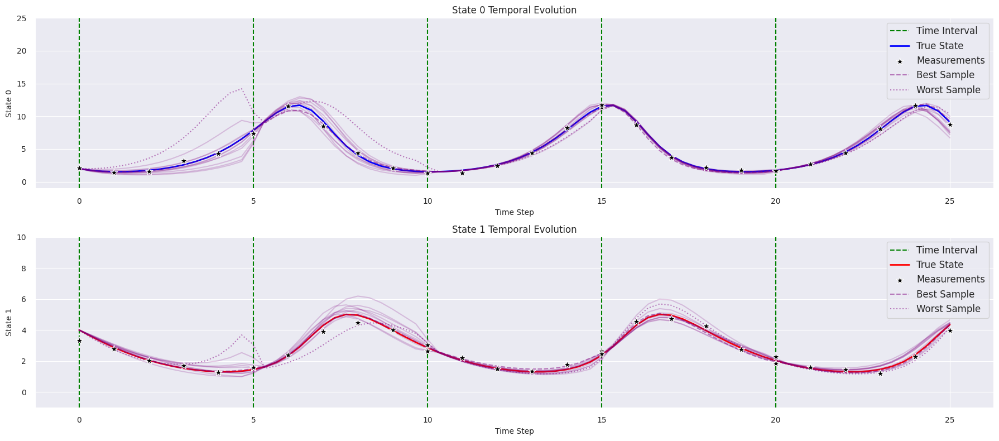

In [36]:
importlib.reload(plt)
plotter = plt.Plotter()

axs = plotter.plot_state_data(lvm, window_type='line')
axs[0].set_ylim([-1, 25])
axs[1].set_ylim([-1, 10])

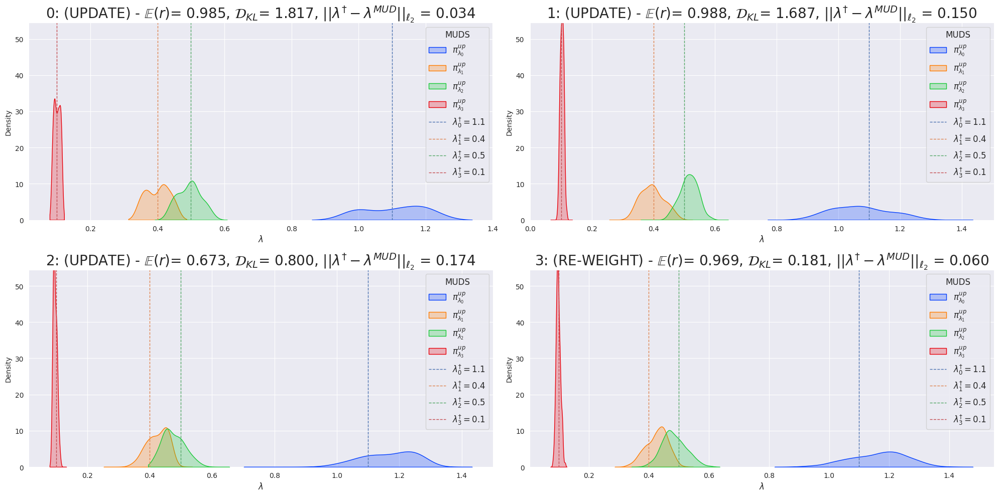

In [38]:
importlib.reload(plt)
plotter = plt.Plotter()

ax = plotter.plot_parameters(lvm, param_idxs=None, nrows=2,ncols=2, plot_initial=False, plot_legend=True)

(-0.1, 0.1)

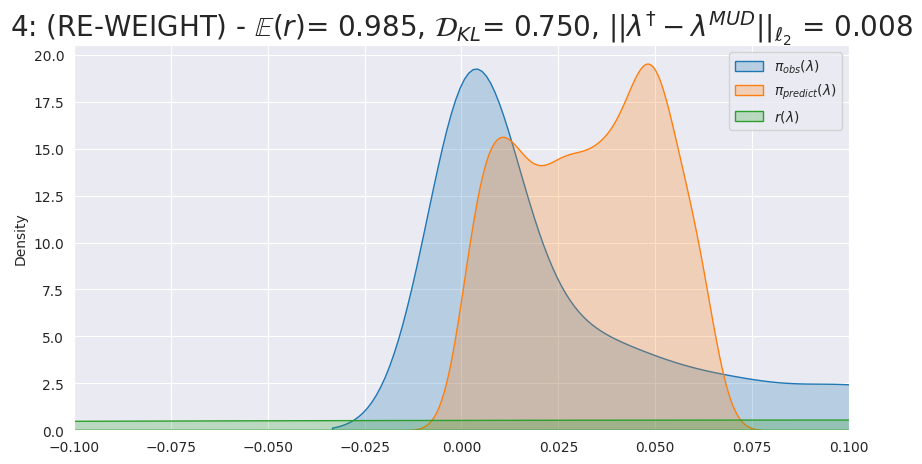

In [28]:
importlib.reload(plt)
plotter = plt.Plotter()

axs = plotter.plot_ratios(lvm, iterations=[4])
axs[0].set_xlim([-0.1,0.1])

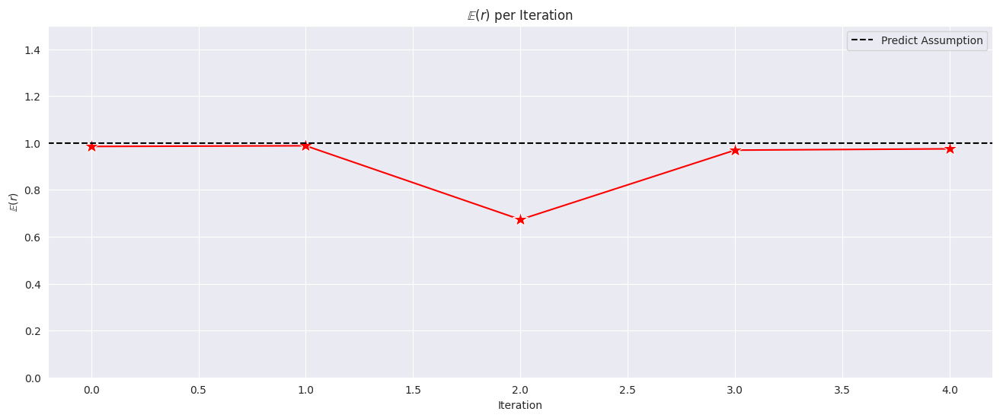

In [39]:
importlib.reload(plt)
plotter = plt.Plotter()

ax = plotter.plot_expected_ratios(lvm)

### Other plots

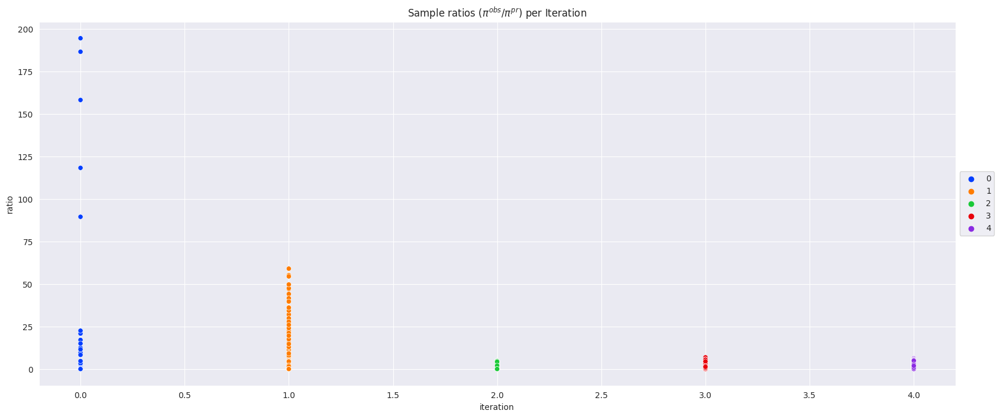

In [31]:
importlib.reload(plt)
plotter = plt.Plotter()

ax = plotter.plot_ratio_scatter(lvm)

<Figure size 1200x1000 with 0 Axes>

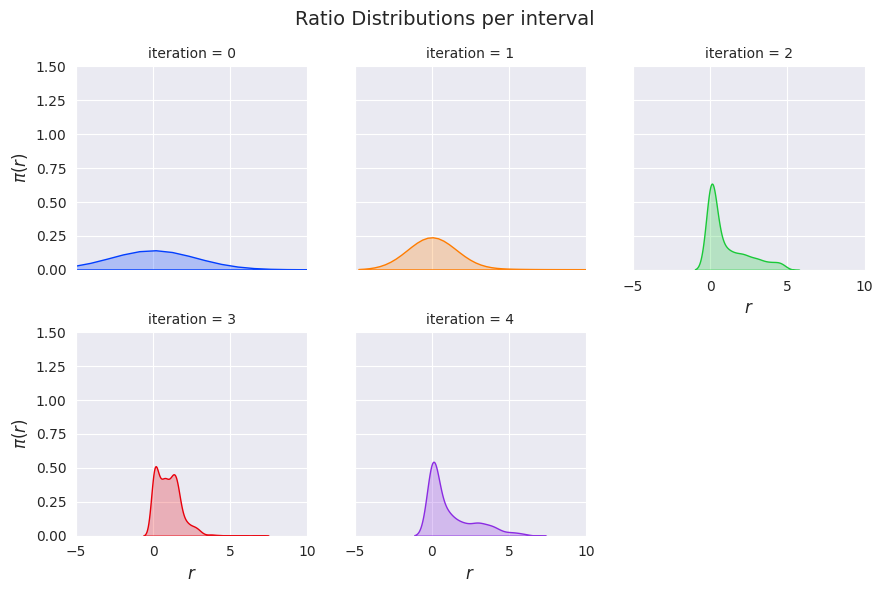

In [32]:
importlib.reload(plt)
plotter = plt.Plotter()
ax = plotter.plot_ratio_dist(lvm, ncols=3)

## Param Shift

In [40]:
num_samples = 1000
lv1_param_mins = [0, 0, 0, 0]
lv1_true_param = lv_p1
x0 = np.array([2, 4])
param_shifts = {50: lv_p2}

search_params = {
    "nc": 2,
    "method": "all",
    "best": "closest",
    "reweight": True,
    "resample": True,
    "min_weight_thresh": 1e-20,
}

lvm_shift = SDP.SequentialDensityProblem(
    run_lv,
    x0,
    lv1_true_param,
    measurement_noise=0.3,
    solve_ts=0.3,
    sample_ts=1,
    diff=0.15,
    hot_starts=True,
    param_mins=lv1_param_mins,
    param_shifts=param_shifts,
    search_params=search_params,
)

lvm.seq_solve(
    list(np.arange(5, 100, 5)), num_samples=num_samples, init_seed=lv1_initial_seed
)

[04/03/23 14:17:39] INFO     Computing domain within 0.15 of [1.1, 0.4, 0.5, 0.1]   ]8;id=223624;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=510055;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#212\212]8;;\

                    INFO     Initialized uniform domain:                            ]8;id=372516;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=542797;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#218\218]8;;\
                             [[0.935 1.265]                                                                        
                              [0.34  0.46 ]                                                                        
                              [0.425 0.575]                                                                        
                              [0.085 0.115]]                                                                       

                    INFO     Drawing 1000 from uniform at:                          ]8;id=214533;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=617332;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#228\228]8;;\
                                     loc: [0.935 0.34  0.425 0.085]                                                
                                     scale: [0.33 0.12 0.15 0.03]                                                  

                    INFO     Solver init - 19 windows: [0, 5, 10, 15, 20, 25, 30,   ]8;id=914755;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=359179;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#656\656]8;;\
                             35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]                                   

                    INFO     Iteration 0.                                           ]8;id=793913;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=857108;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:40] INFO     Reweight set but 5.66e-79 < 1.00e-20                   ]8;id=226604;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=464194;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#554\554]8;;\

                    INFO             Re-Sampling: e_r within 1+-10000000000.00      ]8;id=571320;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=16185;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#558\558]8;;\

                    INFO     Iteration 1: [0, 5] Summary:                           ]8;id=636955;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=965527;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━┓                                                               
                             ┃ Key        ┃ Value  ┃                                                               
                             ┡━━━━━━━━━━━━╇━━━━━━━━┩                                                               
                             │ Iteration  │ 1      │                                                               
                             │ Action     │ UPDATE │                                                               
                             │ L_2        │ 0.093  │                                                               
                             │ KL         │ 1.516  │                                                               
                             │ Best(E(r)) │ 1.082  │                                                               
                             │ Mean(E(r)) │ 1.082  │                                                               
                             │ std(E(r))  │ nan    │                                                               
                             └────────────┴────────┘                                                               

                    INFO     Iteration 1.                                           ]8;id=650304;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=130574;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO     Reweight set but 1.38e-98 < 1.00e-20                   ]8;id=538181;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=753926;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#554\554]8;;\

                    INFO             Re-Sampling: e_r within 1+-10000000000.00      ]8;id=961226;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=853940;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#558\558]8;;\

                    INFO     Iteration 2: [5, 10] Summary:                          ]8;id=539828;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=560516;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━┓                                                               
                             ┃ Key        ┃ Value  ┃                                                               
                             ┡━━━━━━━━━━━━╇━━━━━━━━┩                                                               
                             │ Iteration  │ 2      │                                                               
                             │ Action     │ UPDATE │                                                               
                             │ L_2        │ 0.041  │                                                               
                             │ KL         │ 1.845  │                                                               
                             │ Best(E(r)) │ 1.085  │                                                               
                             │ Mean(E(r)) │ 1.085  │                                                               
                             │ std(E(r))  │ nan    │                                                               
                             └────────────┴────────┘                                                               

                    INFO     Iteration 2.                                           ]8;id=940709;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=173686;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:41] INFO             Updating weights: e_r within threshold         ]8;id=403308;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=811419;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 5.03e-14 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 3: [10, 15] Summary:                         ]8;id=489523;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=70565;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 3         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.064     │                                                            
                             │ KL         │ 0.414     │                                                            
                             │ Best(E(r)) │ 0.912     │                                                            
                             │ Mean(E(r)) │ 0.912     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 3.                                           ]8;id=456103;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=459996;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=472288;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=177606;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 1.20e-13 >=                                      
                             1.00e-20                                                                              

[04/03/23 14:17:42] INFO     Iteration 4: [15, 20] Summary:                         ]8;id=285818;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=327751;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 4         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.077     │                                                            
                             │ KL         │ 0.591     │                                                            
                             │ Best(E(r)) │ 0.956     │                                                            
                             │ Mean(E(r)) │ 0.956     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 4.                                           ]8;id=905421;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=904836;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=255244;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=377220;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 2.53e-13 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 5: [20, 25] Summary:                         ]8;id=710372;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=733663;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 5         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.063     │                                                            
                             │ KL         │ 0.374     │                                                            
                             │ Best(E(r)) │ 0.825     │                                                            
                             │ Mean(E(r)) │ 0.825     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 5.                                           ]8;id=75232;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=766192;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=376692;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=958092;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 2.69e-10 >=                                      
                             1.00e-20                                                                              

[04/03/23 14:17:43] INFO     Iteration 6: [25, 30] Summary:                         ]8;id=375802;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=948654;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 6         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.036     │                                                            
                             │ KL         │ 0.256     │                                                            
                             │ Best(E(r)) │ 1.057     │                                                            
                             │ Mean(E(r)) │ 1.057     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 6.                                           ]8;id=441389;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=895598;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=708032;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=727566;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 9.20e-07 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 7: [30, 35] Summary:                         ]8;id=330157;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=755972;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 7         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.044     │                                                            
                             │ KL         │ 0.286     │                                                            
                             │ Best(E(r)) │ 0.786     │                                                            
                             │ Mean(E(r)) │ 0.786     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 7.                                           ]8;id=500072;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=524104;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=869137;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=482605;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 1.49e-07 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 8: [35, 40] Summary:                         ]8;id=37671;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=366515;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 8         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.075     │                                                            
                             │ KL         │ 1.016     │                                                            
                             │ Best(E(r)) │ 0.649     │                                                            
                             │ Mean(E(r)) │ 0.649     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 8.                                           ]8;id=347695;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=764464;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:44] INFO             Updating weights: e_r within threshold         ]8;id=882595;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=419852;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 8.90e-07 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 9: [40, 45] Summary:                         ]8;id=746902;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=630804;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 9         │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.025     │                                                            
                             │ KL         │ 0.657     │                                                            
                             │ Best(E(r)) │ 0.573     │                                                            
                             │ Mean(E(r)) │ 0.573     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 9.                                           ]8;id=104728;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=258418;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=806732;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=303202;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 8.03e-08 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 10: [45, 50] Summary:                        ]8;id=505668;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=336674;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 10        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.042     │                                                            
                             │ KL         │ 1.483     │                                                            
                             │ Best(E(r)) │ 0.854     │                                                            
                             │ Mean(E(r)) │ 0.854     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 10.                                          ]8;id=790507;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=536978;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:45] INFO             Updating weights: e_r within threshold         ]8;id=228515;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=46716;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 2.76e-14 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 11: [50, 55] Summary:                        ]8;id=850750;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=713579;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 11        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.025     │                                                            
                             │ KL         │ 3.043     │                                                            
                             │ Best(E(r)) │ 0.333     │                                                            
                             │ Mean(E(r)) │ 0.333     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 11.                                          ]8;id=558803;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=415029;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=38722;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=349422;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 7.61e-20 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 12: [55, 60] Summary:                        ]8;id=592243;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=546259;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 12        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.100     │                                                            
                             │ KL         │ 2.169     │                                                            
                             │ Best(E(r)) │ 0.027     │                                                            
                             │ Mean(E(r)) │ 0.027     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 12.                                          ]8;id=650592;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=715166;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:46] INFO             Updating weights: e_r within threshold         ]8;id=631206;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=213015;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 9.76e-11 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 13: [60, 65] Summary:                        ]8;id=313862;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=610425;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 13        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.100     │                                                            
                             │ KL         │ 0.825     │                                                            
                             │ Best(E(r)) │ 0.808     │                                                            
                             │ Mean(E(r)) │ 0.808     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 13.                                          ]8;id=150081;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=838421;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=921110;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=186215;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 1.99e-11 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 14: [65, 70] Summary:                        ]8;id=744948;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=839583;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 14        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.086     │                                                            
                             │ KL         │ 0.719     │                                                            
                             │ Best(E(r)) │ 0.636     │                                                            
                             │ Mean(E(r)) │ 0.636     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 14.                                          ]8;id=559150;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=9403;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:47] INFO             Updating weights: e_r within threshold         ]8;id=959107;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=61137;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 2.39e-16 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 15: [70, 75] Summary:                        ]8;id=933284;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=520354;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 15        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.066     │                                                            
                             │ KL         │ 0.981     │                                                            
                             │ Best(E(r)) │ 0.901     │                                                            
                             │ Mean(E(r)) │ 0.901     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 15.                                          ]8;id=328078;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=349775;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=972870;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=524710;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 6.42e-06 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 16: [75, 80] Summary:                        ]8;id=894093;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=687598;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 16        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.135     │                                                            
                             │ KL         │ 0.297     │                                                            
                             │ Best(E(r)) │ 0.734     │                                                            
                             │ Mean(E(r)) │ 0.734     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 16.                                          ]8;id=27419;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=978661;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:48] INFO             Updating weights: e_r within threshold         ]8;id=523207;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=613082;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 6.57e-05 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 17: [80, 85] Summary:                        ]8;id=617464;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=420481;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 17        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.135     │                                                            
                             │ KL         │ 0.803     │                                                            
                             │ Best(E(r)) │ 0.836     │                                                            
                             │ Mean(E(r)) │ 0.836     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 17.                                          ]8;id=622847;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=941773;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

                    INFO             Updating weights: e_r within threshold         ]8;id=790383;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=331100;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 1.52e-04 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 18: [85, 90] Summary:                        ]8;id=39392;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=335113;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 18        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.028     │                                                            
                             │ KL         │ 0.363     │                                                            
                             │ Best(E(r)) │ 0.633     │                                                            
                             │ Mean(E(r)) │ 0.633     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

                    INFO     Iteration 18.                                          ]8;id=785452;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=712437;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#658\658]8;;\

[04/03/23 14:17:49] INFO             Updating weights: e_r within threshold         ]8;id=940813;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=830310;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#546\546]8;;\
                             1+-10000000000.00, reweight set, and 5.19e-06 >=                                      
                             1.00e-20                                                                              

                    INFO     Iteration 19: [90, 95] Summary:                        ]8;id=391051;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py\SequentialDensityProblem.py]8;;\:]8;id=50121;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/SequentialDensityProblem.py#662\662]8;;\
                             ┏━━━━━━━━━━━━┳━━━━━━━━━━━┓                                                            
                             ┃ Key        ┃ Value     ┃                                                            
                             ┡━━━━━━━━━━━━╇━━━━━━━━━━━┩                                                            
                             │ Iteration  │ 19        │                                                            
                             │ Action     │ RE-WEIGHT │                                                            
                             │ L_2        │ 0.066     │                                                            
                             │ KL         │ 0.805     │                                                            
                             │ Best(E(r)) │ 0.915     │                                                            
                             │ Mean(E(r)) │ 0.915     │                                                            
                             │ std(E(r))  │ nan       │                                                            
                             └────────────┴───────────┘                                                            

## Random search

In [26]:
a  = {1.1:1, 0: 1121}
b = list(a.keys())
b.sort()
b

[0, 1.1]

In [10]:
lv1_res_rand = alg.sequential_resampling(
    run_lv,
    np.array([2, 4]),
    lv1_true_param,
    num_samples=1000,
    measurement_noise=0.1,
    diff=0.5,
    solve_ts=0.1,
    sample_ts=1,
    time_window=5,
    end_time=130,
    param_shifts=[],
    max_nc=1,
    param_mins=lv1_param_mins,
    init_seed = lv1_initial_seed,
    obs_seed = lv1_measurement_seed,
    random_search=True,
)

Initi: Uniform over [[0.55 1.65]
 [0.2  0.6 ]
 [0.25 0.75]
 [0.05 0.15]]

====== iteration 0 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
	 ... SEARCH SUMMARY ...
	NC = 1, un-weighted, 
	Searched 7 different combinations
	Best choice: 2/5 points: [1, 2]
		Best(E(r)) = 1.017376830582788
		Best(Mud) = [1.23492595 0.52091415 0.69526131 0.11964302]
		Mean(E(r)) = 0.9230718062053034, STD(E(r)) = 0.14745913151878132
		MIN(E(r)) = 0.680257457952848, MAX(E(r))) = 1.1431149526971438
	Drawing new samples: e_r within threshold 0.1

====== iteration 1 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
	 ... SEARCH SUMMARY ...
	NC = 1, un-weighted, 
	Searched 7 different combinations
	Best choice: 1/5 points: [3]
		Best(E(r)) = 0.994483609336635
		Best(Mud) = [1.26245048 0.4318954  0.40595321 0.08148307]
		Mean(E(r)) = 1.006134727430861, STD(E(r)) = 0.07501436474028728
		MIN(E(r)) = 0.9167023047157613, MAX(E(r))) = 1.114444748025

/opt/conda/envs/fenix/lib/python3.10/site-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


	 ... SEARCH SUMMARY ...
	NC = 1, un-weighted, 
	Searched 7 different combinations
	Best choice: 1/5 points: [3]
		Best(E(r)) = 0.9938903917085468
		Best(Mud) = [1.10720784 0.40243889 0.49901129 0.10199662]
		Mean(E(r)) = 2928489688.524409, STD(E(r)) = 3417803497.449042
		MIN(E(r)) = 0.9938903917085468, MAX(E(r))) = 10133865489.899836
	!!! Expected ratios for all attemps were < 1e-1 !!!
	!!! Resetting to: Uniform over [[0.55 1.65]
 [0.2  0.6 ]
 [0.25 0.75]
 [0.05 0.15]]

====== iteration 4 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
	 ... SEARCH SUMMARY ...
	NC = 1, un-weighted, 
	Searched 7 different combinations
	Best choice: 1/5 points: [4]
		Best(E(r)) = 1.0297858922474743
		Best(Mud) = [1.11193956 0.43418217 0.57584827 0.13026137]
		Mean(E(r)) = 0.954085819626721, STD(E(r)) = 0.14486017602483015
		MIN(E(r)) = 0.6779938431152905, MAX(E(r))) = 1.1062739199213598
	!!! Expected ratios for all attemps were < 1e-1 !!!
	!!! Resetting to: Uniform ove

In [8]:
plotter1 = Plotter()
post1 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data <center>

In [9]:
lv1_state_df, lv1_measure_df, lv1_residuals_df, lv1_predicted_lambdas_df,lv1_pushforward_df = post1.post_process_model(lv1_res)
display(lv1_state_df.head(),lv1_measure_df.head(),lv1_residuals_df.head(),lv1_predicted_lambdas_df.head(),lv1_pushforward_df.head())

,Times,X_0,X_1,Interval
0,0.000000,2.000000,4.000000,Time_Interval_0
1,0.102041,1.905276,3.877485,Time_Interval_0
2,0.204082,1.824128,3.755355,Time_Interval_0
3,0.306122,1.755130,3.634292,Time_Interval_0
4,0.408163,1.697053,3.514855,Time_Interval_0


,Times,X_0,X_1,Interval
0,0.000000,1.855011,3.860486,Time_Interval_0
1,1.020408,1.560645,2.971018,Time_Interval_0
2,2.040816,1.799734,2.047607,Time_Interval_0
3,3.061224,2.526378,1.471363,Time_Interval_0
4,4.081633,4.740306,1.347238,Time_Interval_0


,Residuals,Interval
0,2.486067e-29,Time_Interval_0
1,3.217379e-68,Time_Interval_0
2,8.000277e-30,Time_Interval_0
3,2.664232e-67,Time_Interval_0
4,2.861291e-61,Time_Interval_0


,$\pi_{\lambda_0}$,$\pi_{\lambda_1}$,$\pi_{\lambda_2}$,$\pi_{\lambda_3}$,Interval
0,0.648746,0.357678,0.480752,0.090062,Time_Interval_0
1,0.590409,0.523962,0.450363,0.061690,Time_Interval_0
2,1.220383,0.336157,0.437480,0.124027,Time_Interval_0
3,0.668066,0.518251,0.501528,0.054316,Time_Interval_0
4,0.754527,0.530422,0.748230,0.118329,Time_Interval_0


Push_Forward_0      Push_Forward_1           Push_Forward_2            \
             X_0  X_1            X_0       X_1            X_0       X_1   
0            2.0  4.0       1.850776  3.876439       1.720464  3.751880   
1            2.0  4.0       1.963035  3.820334       1.935652  3.647597   
2            2.0  4.0       1.966182  3.828899       1.945110  3.664283   
3            2.0  4.0       1.679582  3.798861       1.427208  3.602337   
4            2.0  4.0       1.912851  3.831732       1.845389  3.668038   

  Push_Forward_3           Push_Forward_4            ... Push_Forward_995  \
             X_0       X_1            X_0       X_1  ...              X_1   
0       1.606621  3.627258       1.507133  3.503345  ...         4.248280   
1       1.917115  3.481893       1.906823  3.323252  ...         0.938080   
2       1.935907  3.506306       1.937923  3.355041  ...         0.950124   
3       1.226732  3.411861       1.066156  3.228349  ...         2.012158   
4       1.795311  3.509517       1.760817  3.356593  ...        13.101769   

  Push_Forward_996            Push_Forward_997            Push_Forward_998  \
               X_0        X_1              X_0        X_1              X_0   
0        11.321408   4.455233        11.005473   4.662186        10.606247   
1         7.242879   0.959186         7.772408   0.986759         8.327281   
2        11.287009   1.008573        12.064285   1.080581        12.842275   
3         1.129683   1.978999         1.149271   1.946938         1.170244   
4         5.995446  13.050143         5.203388  12.909217         4.533731   

             Push_Forward_999                    Interval  
         X_1              X_0        X_1                   
0   4.864800        10.136314   5.058578  Time_Interval_0  
1   1.021648         8.903882   1.064864  Time_Interval_0  
2   1.168619        13.602241   1.275588  Time_Interval_0  
3   1.915978         1.192627   1.886124  Time_Interval_0  
4  12.695071         3.971500  12.422893  Time_Interval_0  

[5 rows x 2001 columns]

#### <center>Visualize Sequential Time Series Data<center>

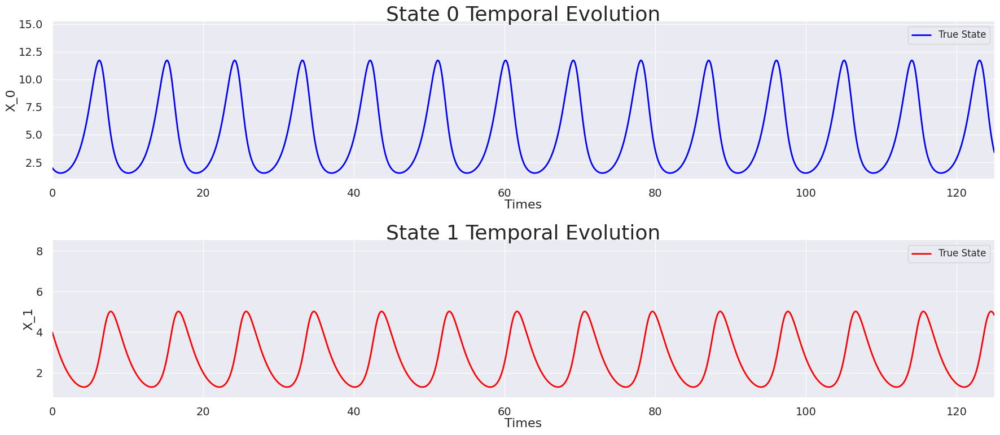

In [10]:
plotter1.plot_state_data(lv1_state_df)

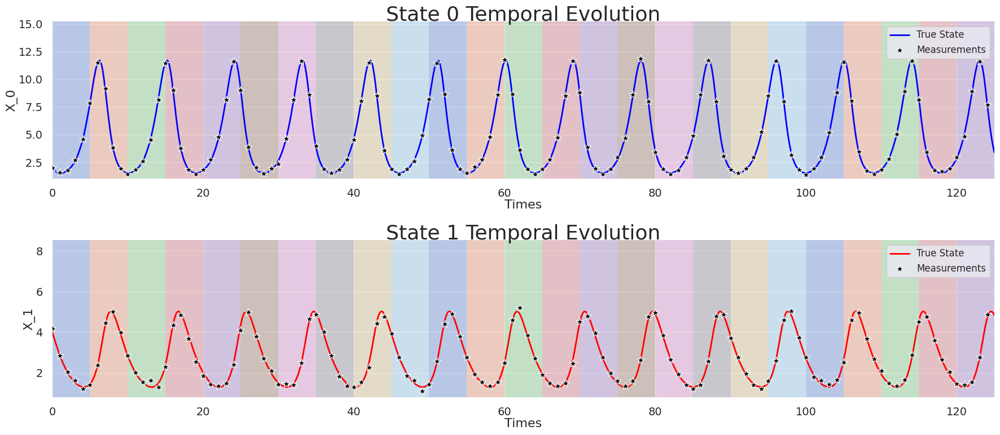

In [13]:
plotter1.plot_state_data(lv1_state_df,lv1_measure_df,window_type='rectangle',markersize=100)

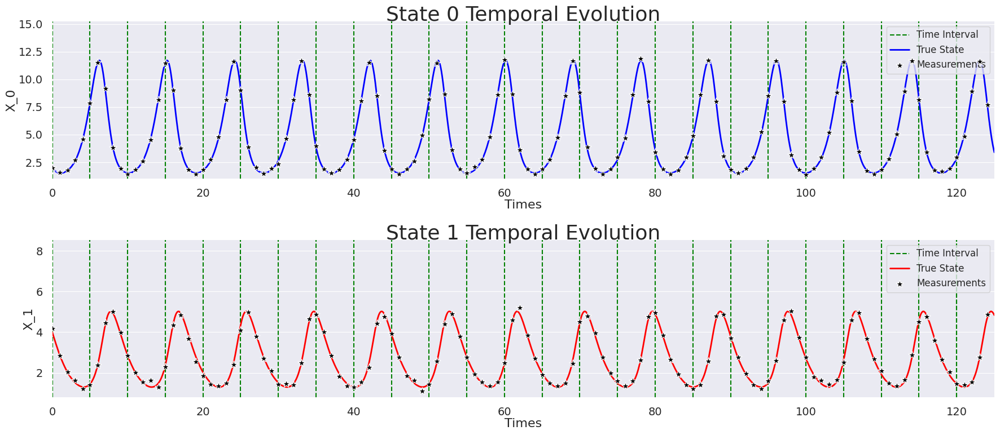

In [14]:
plotter1.plot_state_data(lv1_state_df,lv1_measure_df,window_type='line',shifts=lv1_param_shifts,markersize=100)

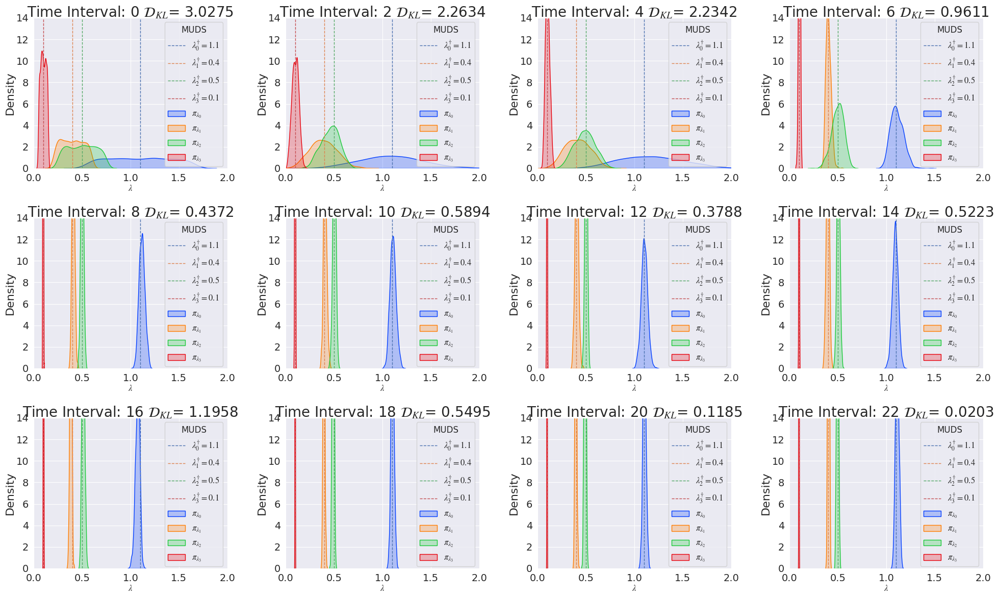

In [16]:
lv1_number_intervals = len(lv1_state_df['Interval'].unique())
lv1_iterations = np.arange(0,lv1_number_intervals,2)
plotter1.plot_parameters(lv1_res,lv1_iterations,'lv', number_parameters=4,nrows=3,ncols=4)

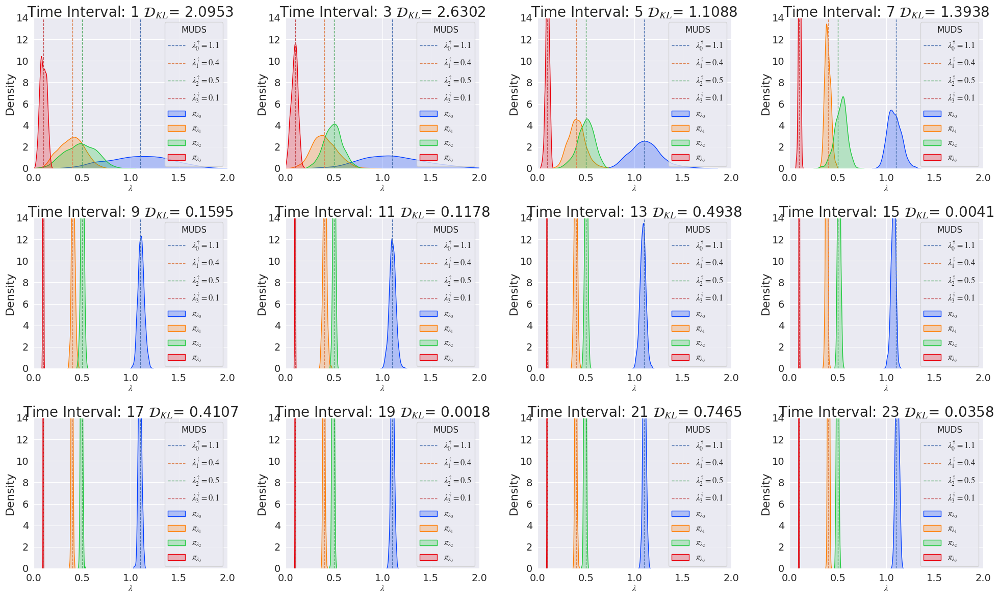

In [17]:
lv1_iterations = np.arange(1,lv1_number_intervals,2)
plotter1.plot_parameters(lv1_res,lv1_iterations,'lv',number_parameters=4,nrows=3,ncols=4)

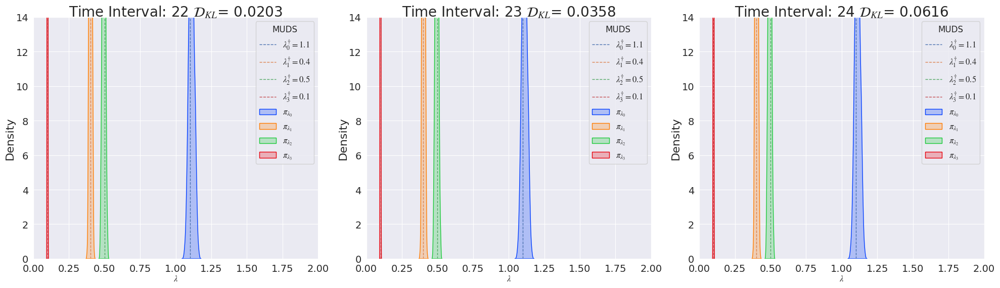

In [18]:
lv1_iterations = [22,23,24]
plotter1.plot_parameters(lv1_res,lv1_iterations,'lv',number_parameters=4,nrows=1,ncols=3)

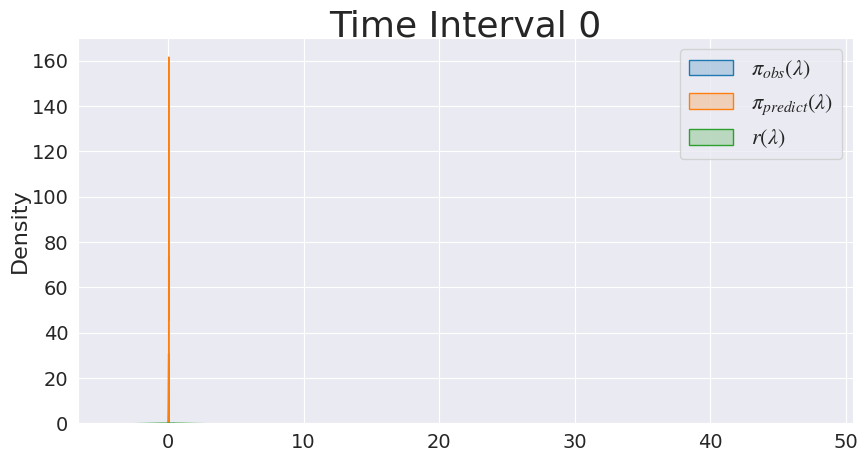

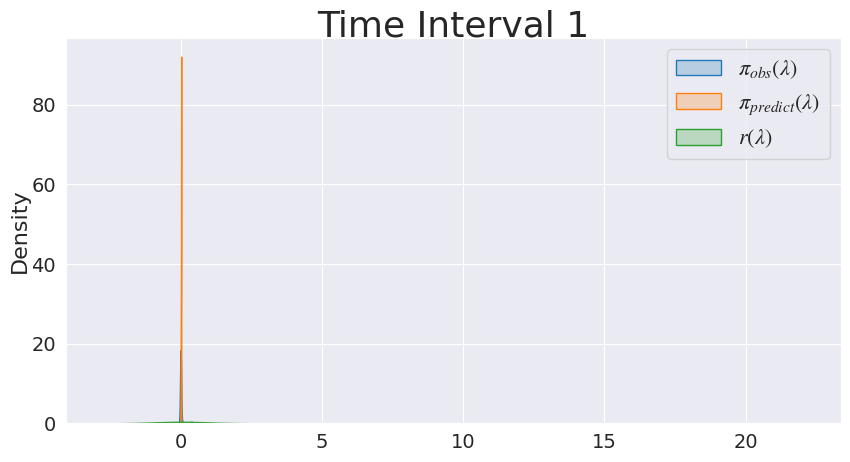

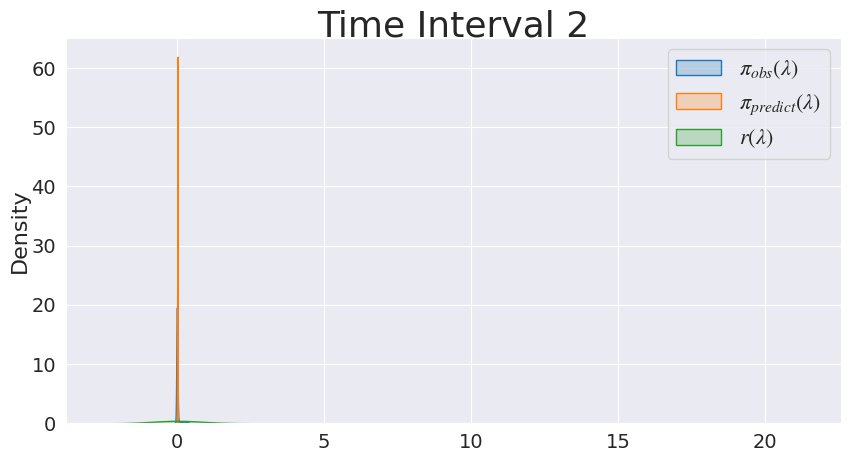

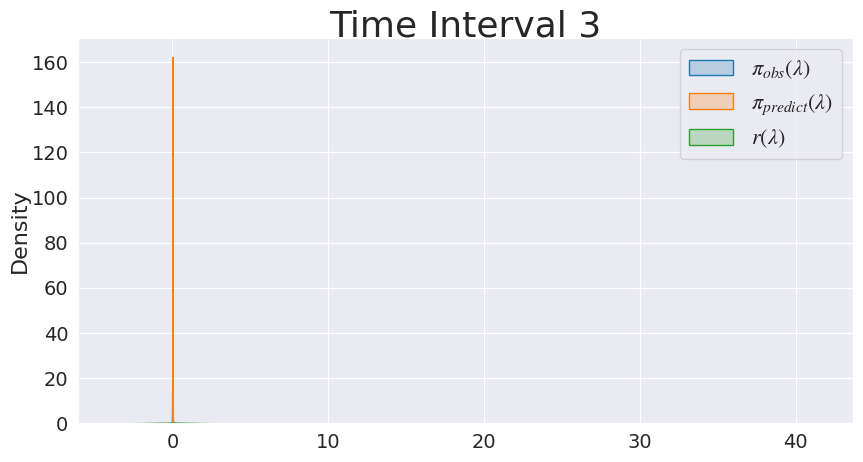

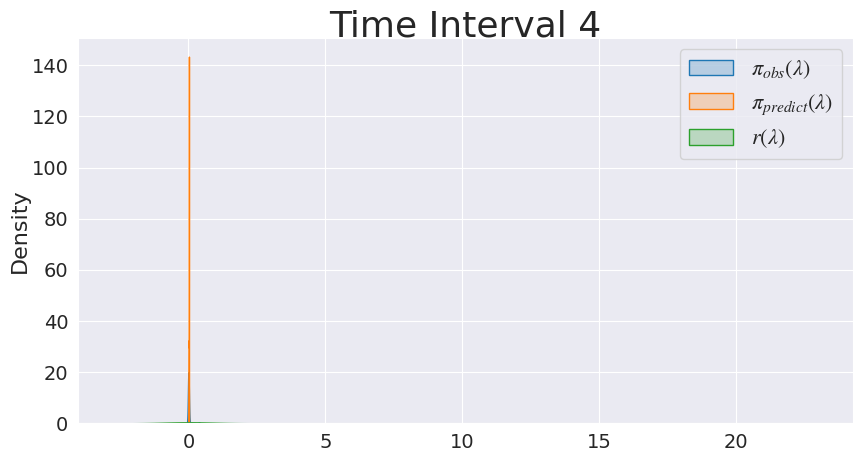

...

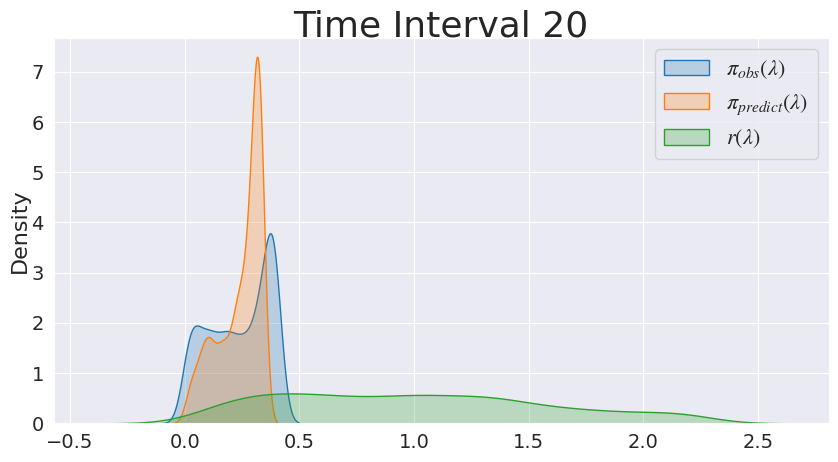

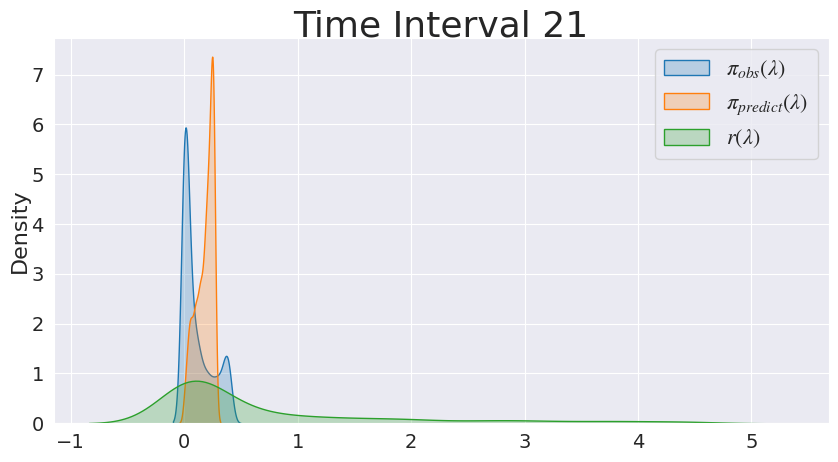

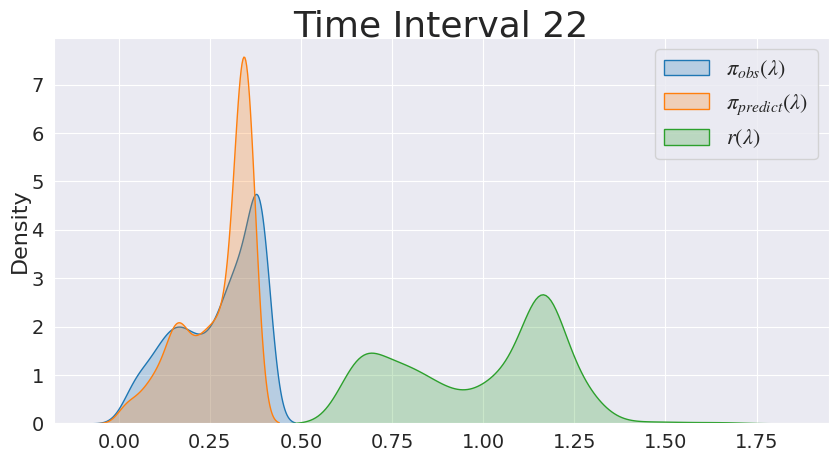

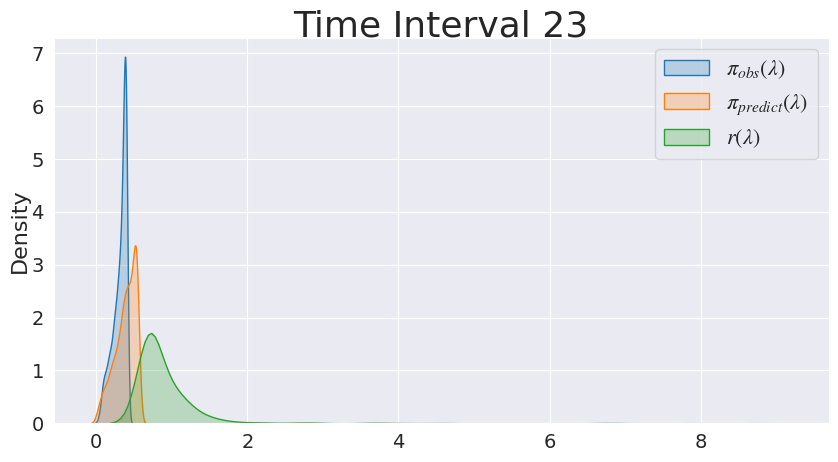

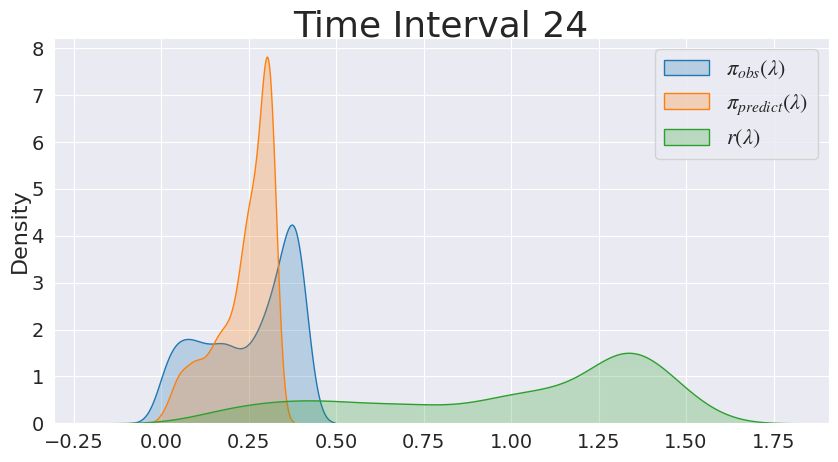

In [19]:
plotter1.plot_ratios(lv1_res)

/home/jovyan/work/repos/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:272: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


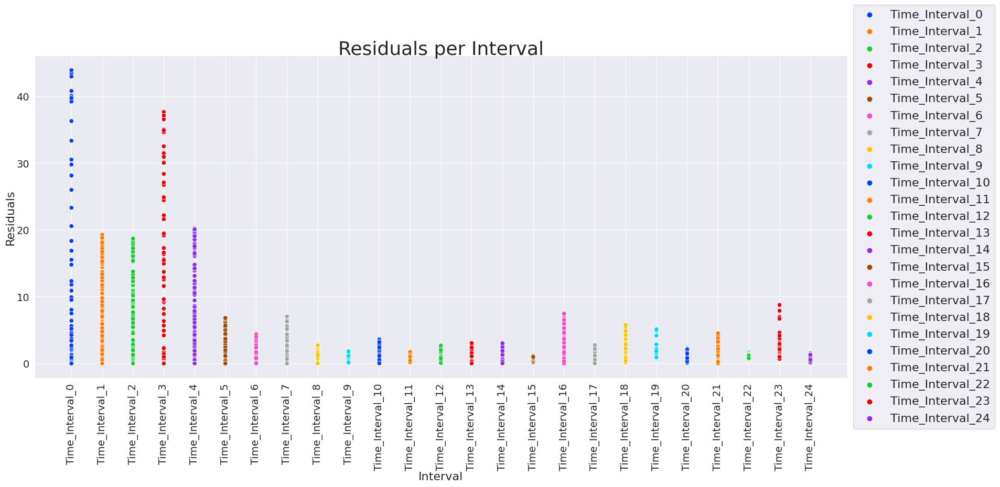

In [20]:
plotter1.plot_residual_scatter(lv1_residuals_df)

<Figure size 2000x1200 with 0 Axes>

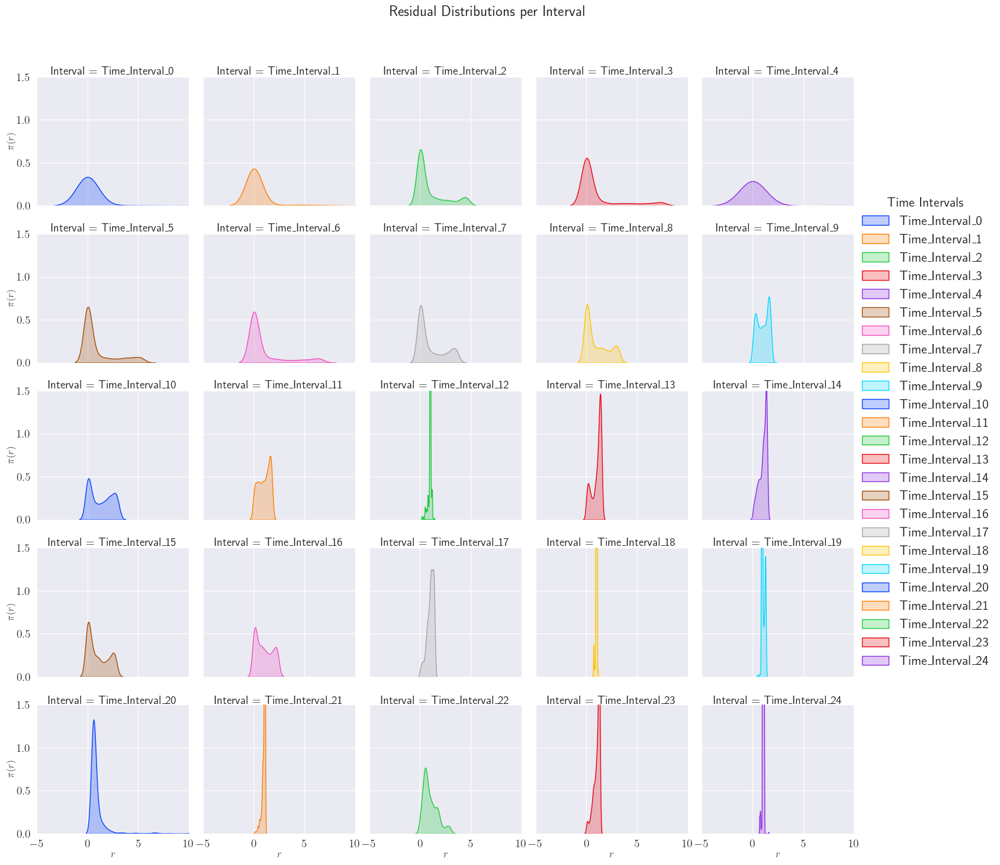

In [19]:
plotter1.plot_residual_dist(lv1_residuals_df)

In [20]:
stats1_df = post1.stats_df(lv1_residuals_df)
stats1_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,1.006923,4.402974,4.938923,24.325774
Time_Interval_1,1.027454,3.221602,3.404151,10.582546
Time_Interval_2,0.997449,1.505607,1.379398,0.443981
Time_Interval_3,1.059983,2.132205,2.012468,2.674118
Time_Interval_4,1.015221,5.272577,5.963960,36.596945


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:334: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


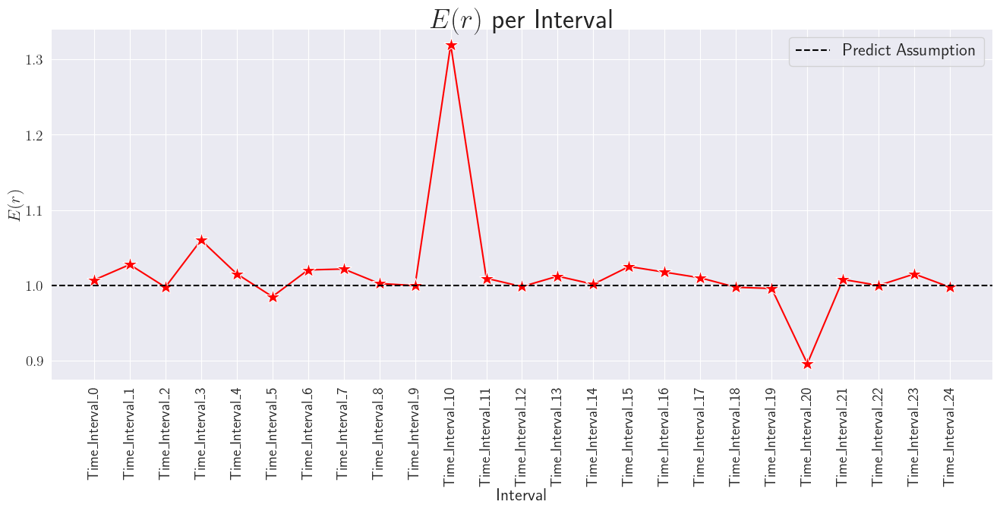

In [21]:
plotter1.plot_expected_ratios(stats1_df)

### CASE: 1-Parameter 1-Drift

#### <center> Select Seed & Run Model <center>

In [22]:
#     Seeds
# initial Measure Outcomes
#------------------------
# (2729, 3263)    kind of bad
# (6486, 8395)    worst
# (1991, 9032)    okay
# (1031, 1157)    good
# (3279, 8172)    good

In [23]:
# lv2_initial_seed,lv2_measurement_seed

In [24]:
lv2_param_mins = [0, 0, 0, 0]
lv2_true_param = [
    1.1,  # alpha - prey growth rate
    0.4,  # beta - prey death rate
    0.5,  # gamma - predator death rate
    0.1,  # delta - preadtor growth rate
]
lv_shift_2 = [
    55,
    [
        1.1,  # alpha - prey growth rate
        0.4,  # beta - prey death rate
        0.7,  # gamma - predator death rate
        0.1,  # delta - preadtor growth rate
    ],
]

lv2_initial_seed = np.random.randint(0, 10e5)
lv2_measurement_seed = np.random.randint(0, 10e5)

lv2_param_shifts = [lv_shift_2]
lv2_res = alg.sequential_resampling(
    run_lv,
    np.array([2, 4]),
    lv2_true_param,
    num_samples=1000,
    measurement_noise=0.1,
    diff=0.5,
    solve_ts=0.1,
    sample_ts=1,
    time_window=5,
    end_time=130,
    param_shifts=[lv_shift_2],
    max_nc=1,
    param_mins=lv2_param_mins,
    init_seed = lv2_initial_seed,
    obs_seed = lv2_measurement_seed,
)

Initi: Uniform over [[0.55 1.65]
 [0.2  0.6 ]
 [0.25 0.75]
 [0.05 0.15]]

====== iteration 0 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
1
2
3
4
	 ... SEARCH SUMMARY ...
	1: 4/5 points:
		Best(E(r)) = 0.9779971350891156
		Best(Mud) = [1.30949117 0.46449952 0.36814534 0.11290128]
		Mean(E(r)) = 0.9465622191913099, STD(E(r)) = 0.10097120356297634
		MIN(E(r)) = 0.781931199329616, MAX(E(r))) = 1.0568558550579041

	Best mud estimate nc = 1, num_ts = 4:
	mud point = [1.30949117 0.46449952 0.36814534 0.11290128]
	E(r) = 0.9779971350891156
	min/max = (0.0, 25.777416831205038)
	Drawing new samples: e_r within threshold 0.1

====== iteration 1 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
1
2
3
4
	 ... SEARCH SUMMARY ...
	1: 1/5 points:
		Best(E(r)) = 1.0168179219423306
		Best(Mud) = [0.96894933 0.40957843 0.59732469 0.13656138]
		Mean(E(r)) = 0.8951867224561412, STD(E(r)) = 0.14037711453068855
		MIN(E(r)) = 0.7365952639

In [25]:
plotter2 = Plotter()
post2 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data <center>

In [26]:
lv2_state_df, lv2_measure_df, lv2_residuals_df, lv2_predicted_lambdas_df, lv2_pushforward_df = post2.post_process_model(lv2_res)
display(lv2_state_df.head(),lv2_measure_df.head(),lv2_residuals_df.head(),lv2_predicted_lambdas_df.head())

,Times,X_0,X_1,Interval
0,0.000000,2.000000,4.000000,Time_Interval_0
1,0.102041,1.905276,3.877485,Time_Interval_0
2,0.204082,1.824128,3.755355,Time_Interval_0
3,0.306122,1.755130,3.634292,Time_Interval_0
4,0.408163,1.697053,3.514855,Time_Interval_0


,Times,X_0,X_1,Interval
0,0.000000,1.794463,4.157011,Time_Interval_0
1,1.020408,1.296098,2.729297,Time_Interval_0
2,2.040816,1.673920,1.929077,Time_Interval_0
3,3.061224,2.880821,1.428245,Time_Interval_0
4,4.081633,4.653519,1.253178,Time_Interval_0


,Residuals,Interval
0,2.423309e-34,Time_Interval_0
1,0.000000e+00,Time_Interval_0
2,8.586880e-03,Time_Interval_0
3,1.447753e-142,Time_Interval_0
4,0.000000e+00,Time_Interval_0


,$\pi_{\lambda_0}$,$\pi_{\lambda_1}$,$\pi_{\lambda_2}$,$\pi_{\lambda_3}$,Interval
0,0.618825,0.419611,0.331958,0.117058,Time_Interval_0
1,1.515563,0.345049,0.613257,0.053383,Time_Interval_0
2,0.886849,0.368583,0.680682,0.125821,Time_Interval_0
3,0.771287,0.585847,0.664587,0.053468,Time_Interval_0
4,1.564627,0.324369,0.317526,0.145785,Time_Interval_0


#### <center> Visualize Sequential Time Series Data <center>

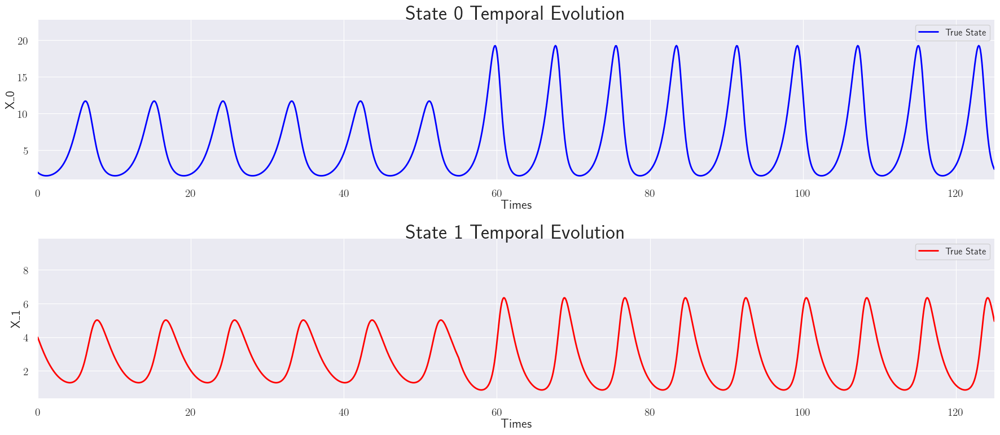

In [27]:
plotter2.plot_state_data(lv2_state_df)

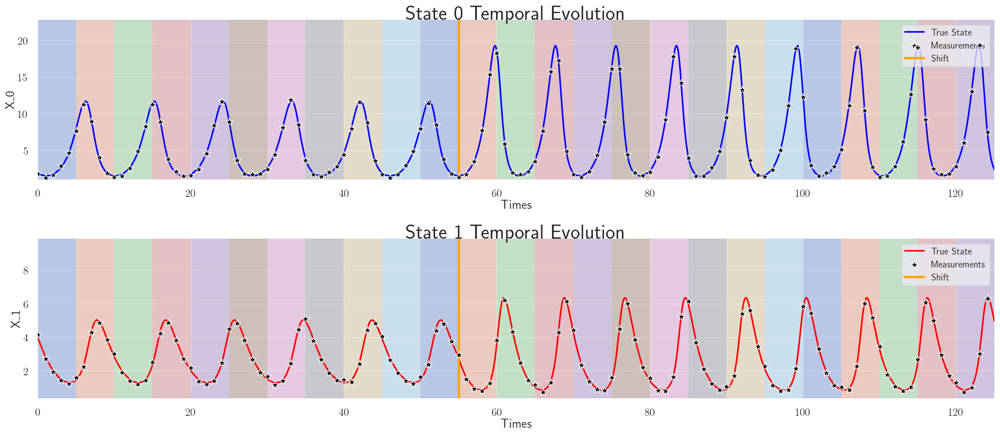

In [28]:
plotter2.plot_state_data(lv2_state_df,lv2_measure_df,window_type='rectangle',shifts=lv2_param_shifts)

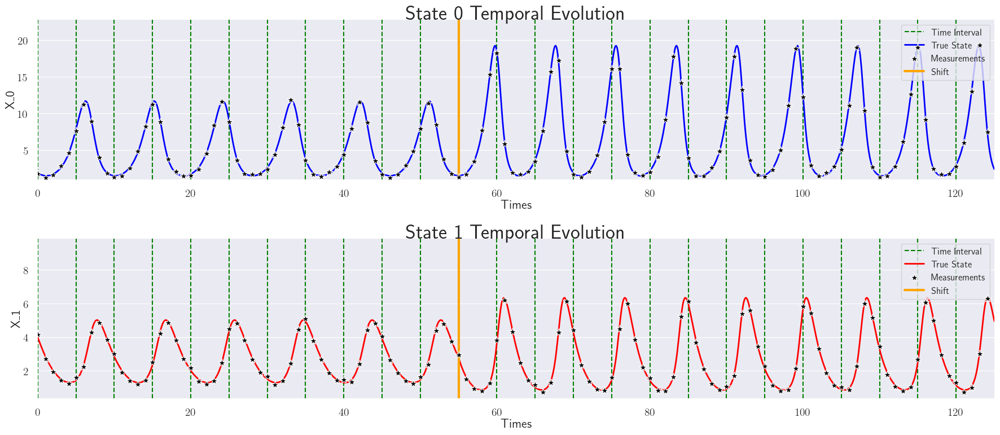

In [29]:
plotter2.plot_state_data(lv2_state_df,lv2_measure_df,window_type='line',shifts=lv2_param_shifts)

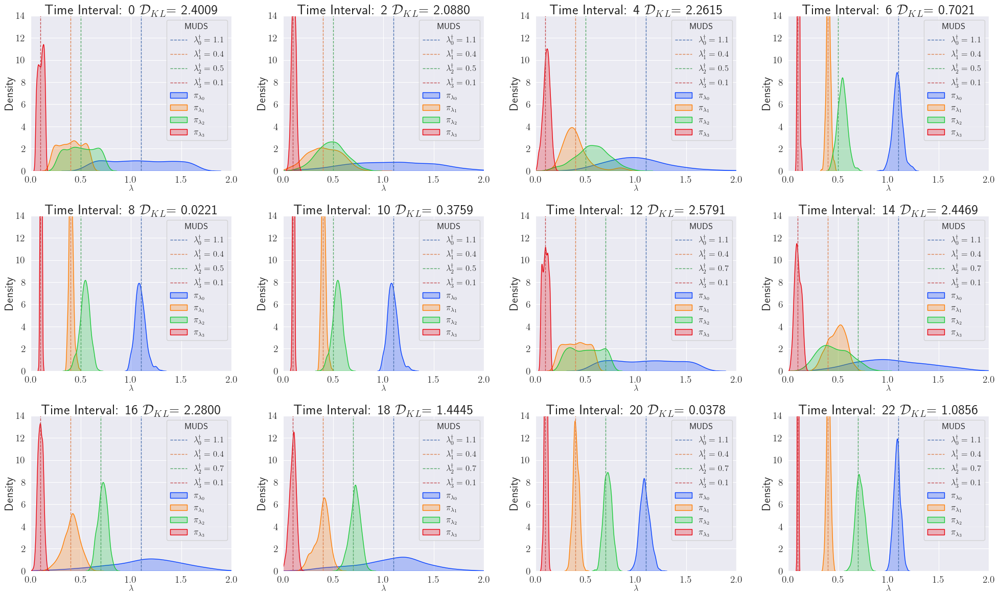

In [30]:
lv2_number_intervals = len(lv2_state_df['Interval'].unique())
lv2_iterations = np.arange(0,lv2_number_intervals,2)
plotter2.plot_parameters(lv2_res,lv2_iterations,'lv',number_parameters=4,nrows=3,ncols=4)

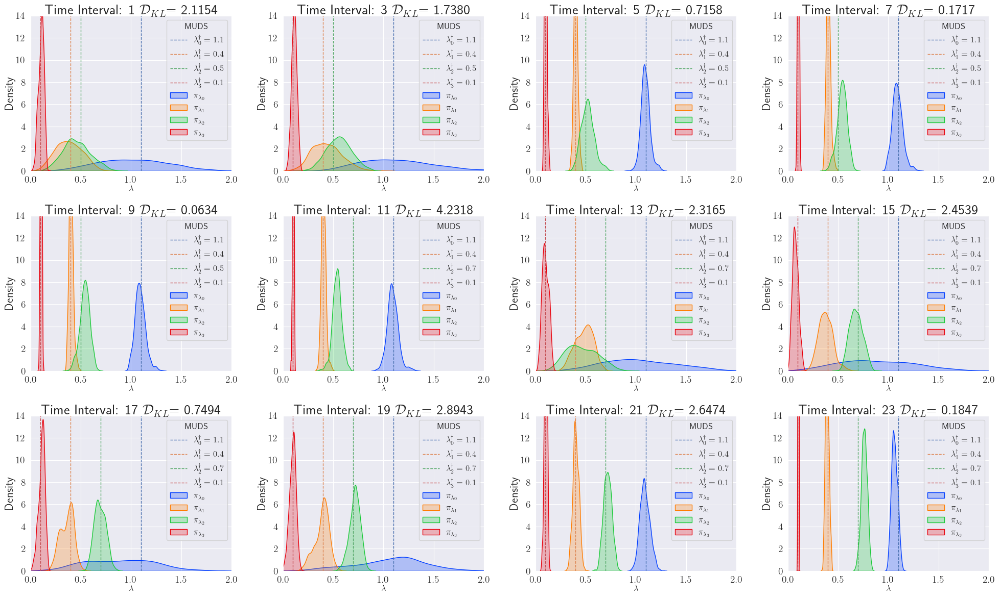

In [31]:
lv2_iterations = np.arange(1,lv2_number_intervals,2)
# lv2_iterations = [23,24,25]
plotter2.plot_parameters(lv2_res,lv2_iterations,'lv',number_parameters=4,nrows=3,ncols=4)

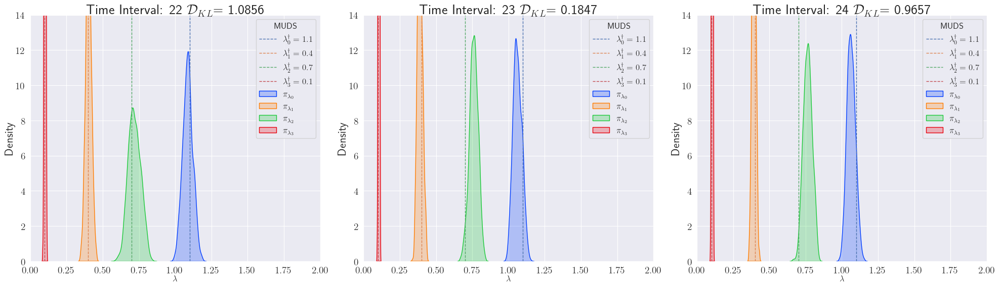

In [32]:
lv2_iterations = [22,23,24]
plotter2.plot_parameters(lv2_res,lv2_iterations,'lv',number_parameters=4,nrows=1,ncols=3)

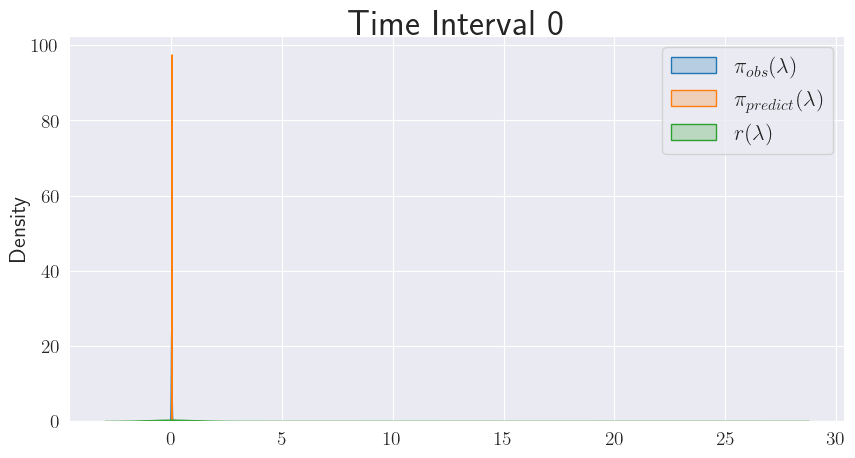

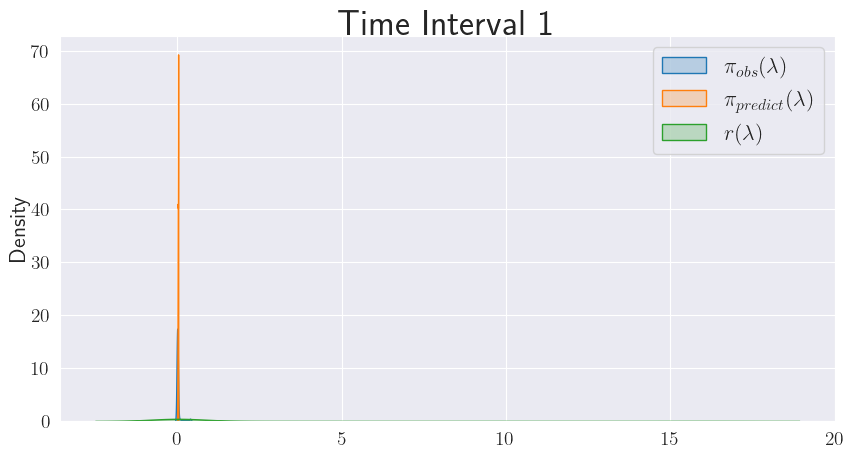

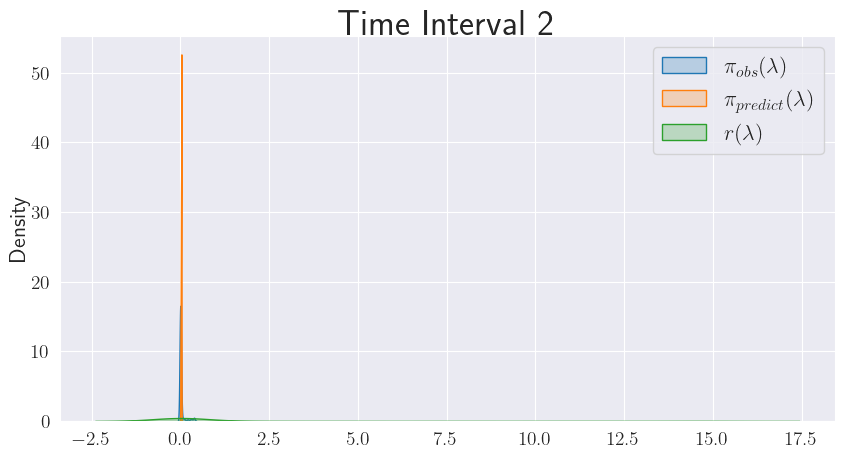

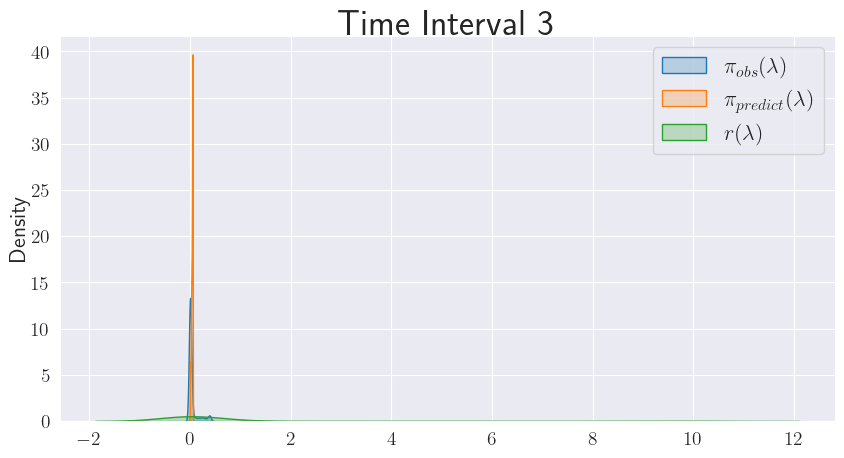

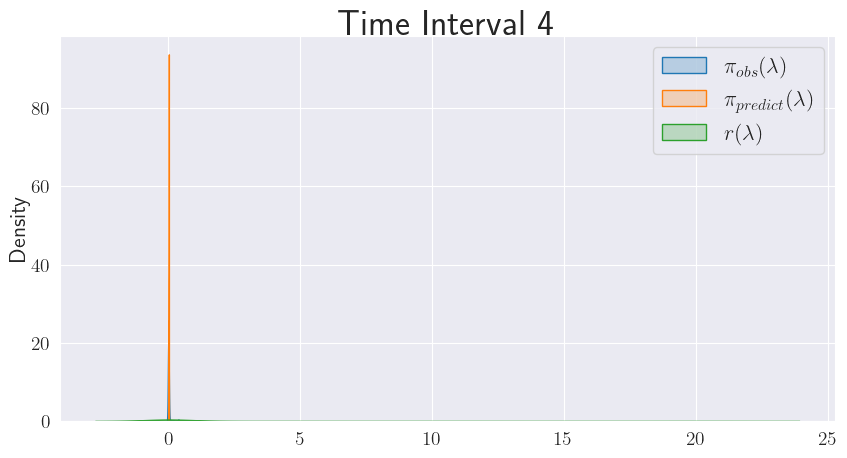

...

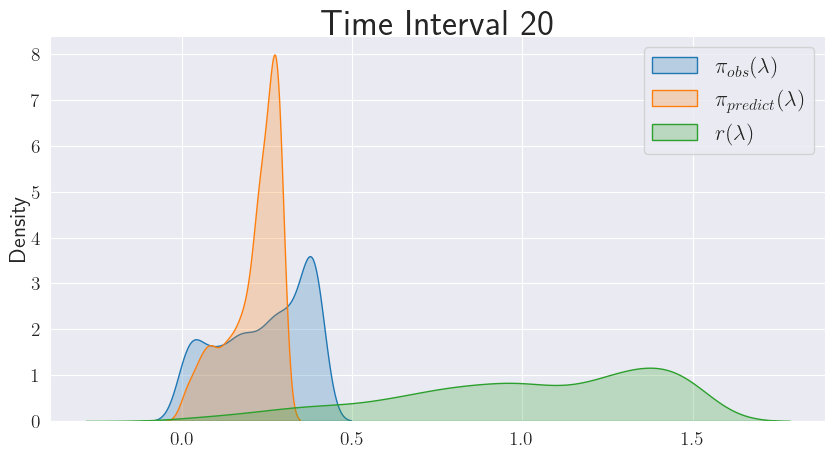

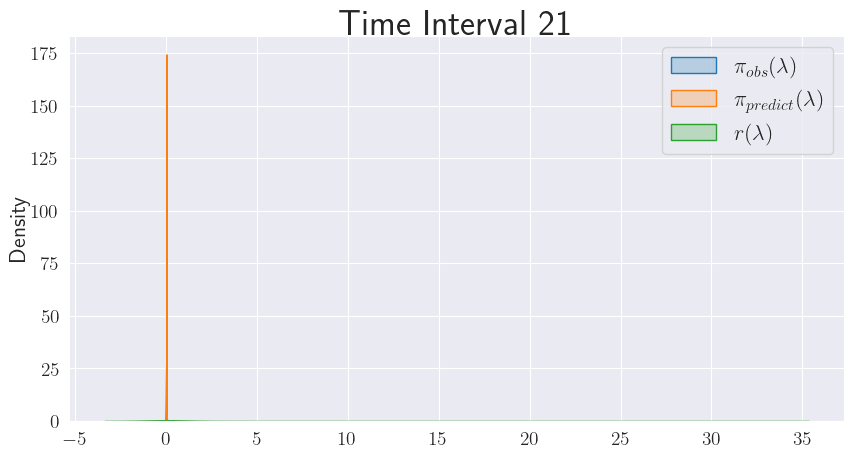

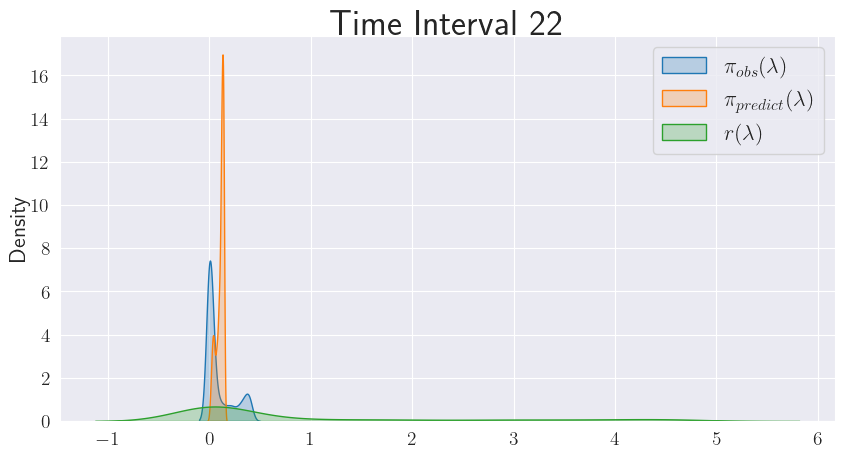

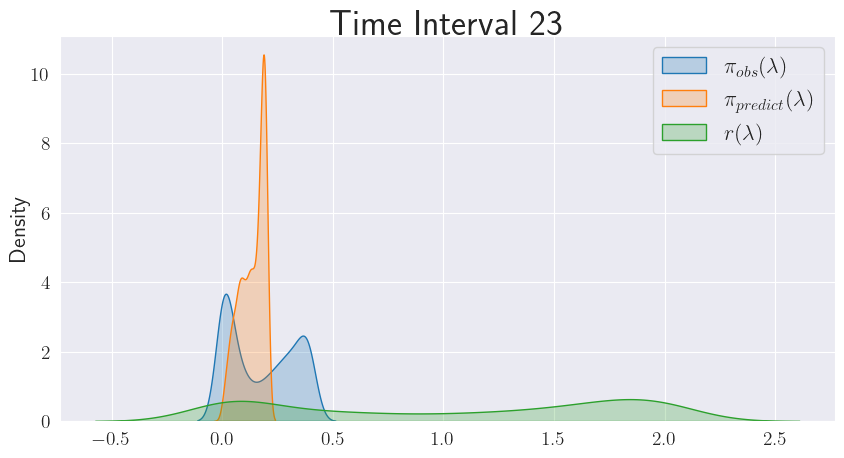

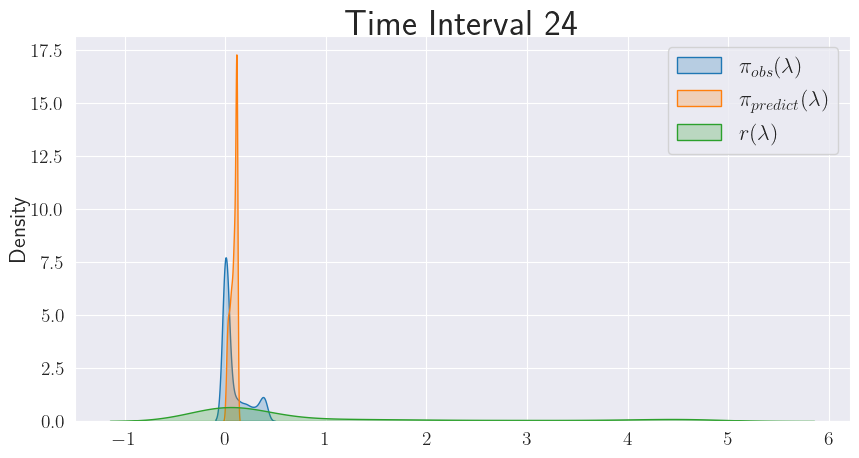

In [33]:
plotter2.plot_ratios(lv2_res)

/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:274: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


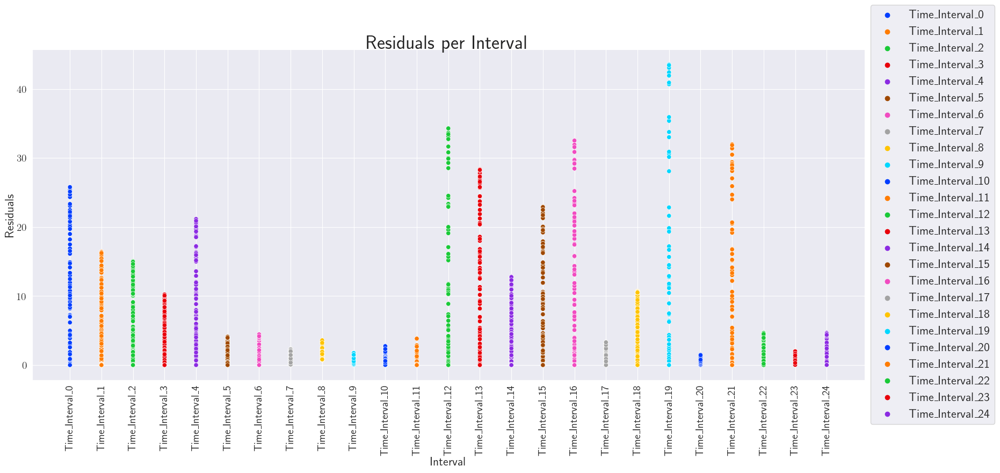

In [34]:
plotter2.plot_residual_scatter(lv2_residuals_df)

<Figure size 2000x1200 with 0 Axes>

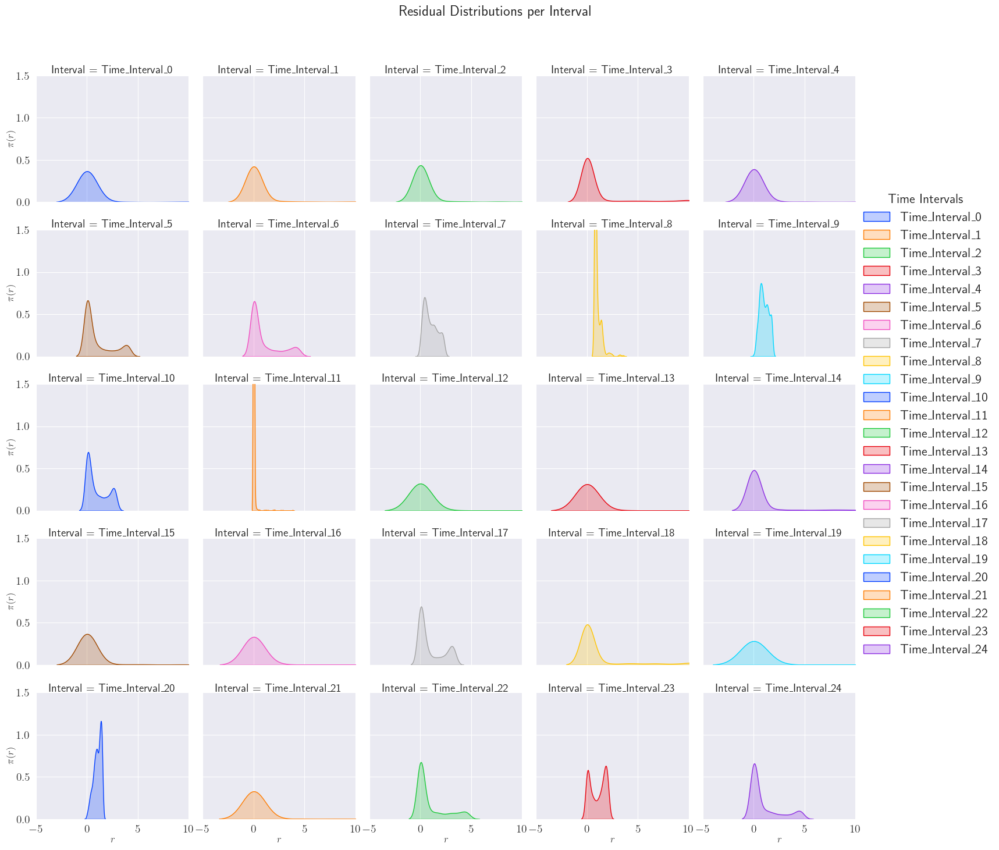

In [35]:
plotter2.plot_residual_dist(lv2_residuals_df)

In [36]:
stats2_df = post2.stats_df(lv2_residuals_df)
stats2_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,0.977997,3.998394,4.592723,21.197022
Time_Interval_1,1.016818,3.320740,3.551480,11.722335
Time_Interval_2,1.018659,3.187569,3.345991,10.097589
Time_Interval_3,0.993833,2.505871,2.644352,5.744292
Time_Interval_4,0.985543,3.690695,4.199051,17.157896


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:334: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


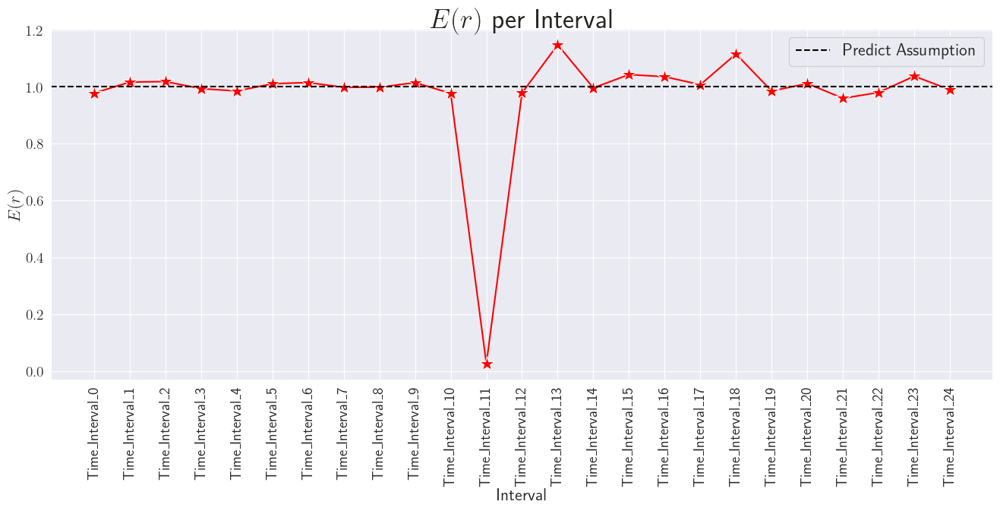

In [37]:
plotter2.plot_expected_ratios(stats2_df)

#### Case: 2-Parameter 1-Drift

#### <center> Select Seed & Run Model <center>

In [38]:
#     Seeds
# initial Measure Outcomes
#------------------------
# (396741, 245882)   kind of bad
# (517380, 588970)   pretty good
# (668348, 784514)   okay
# (562986, 112119)  pretty good
# (49038, 982709)   good

In [39]:
# lv3_initial_seed, lv3_measurement_seed

In [40]:
lv3_param_mins = [0, 0, 0, 0]
lv3_true_param = [
    1.1,  # alpha - prey growth rate
    0.4,  # beta - prey death rate
    0.5,  # gamma - predator death rate
    0.1,  # delta - preadtor growth rate
]
lv_shift_3= [
    55,
    [
        1.3,  # alpha - prey growth rate
        0.4,  # beta - prey death rate
        0.7,  # gamma - predator death rate
        0.1,  # delta - preadtor growth rate
    ],
]



# lv3_initial_seed = np.random.randint(0, 10e5)
# lv3_measurement_seed = np.random.randint(0, 10e5)

lv3_initial_seed = 49038
lv3_measurement_seed = 982709

lv3_param_shifts = [lv_shift_3]
lv3_res = alg.sequential_resampling(
    run_lv,
    np.array([2, 4]),
    lv3_true_param,
    num_samples=1000,
    measurement_noise=0.1,
    diff=0.5,
    solve_ts=0.1,
    sample_ts=1,
    time_window=5,
    end_time=130,
    param_shifts=[lv_shift_3],
    max_nc=1,
    param_mins=lv3_param_mins,
    init_seed = lv3_initial_seed,
    obs_seed = lv3_measurement_seed,
)

Initi: Uniform over [[0.55 1.65]
 [0.2  0.6 ]
 [0.25 0.75]
 [0.05 0.15]]

====== iteration 0 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
1
2
3
4
	 ... SEARCH SUMMARY ...
	1: 1/5 points:
		Best(E(r)) = 1.0110495407175932
		Best(Mud) = [0.74643522 0.54550537 0.40580308 0.09783801]
		Mean(E(r)) = 0.9132711831688612, STD(E(r)) = 0.10640997340471463
		MIN(E(r)) = 0.735266639166633, MAX(E(r))) = 1.0110495407175932

	Best mud estimate nc = 1, num_ts = 1:
	mud point = [0.74643522 0.54550537 0.40580308 0.09783801]
	E(r) = 1.0110495407175932
	min/max = (3.447081652884869e-297, 7.556729050672339)
	Drawing new samples: e_r within threshold 0.1

====== iteration 1 ======
True Param: [1.1, 0.4, 0.5, 0.1]
Pushing 1000 samples forward through model
1
2
3
4
	 ... SEARCH SUMMARY ...
	1: 4/5 points:
		Best(E(r)) = 0.9374039706450548
		Best(Mud) = [0.91294371 0.35179548 0.45953969 0.11071205]
		Mean(E(r)) = 1.0719769856182584, STD(E(r)) = 0.16392404899236546
		MIN(E(

In [41]:
plotter3 = Plotter()
post3 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data <center>

In [42]:
lv3_state_df, lv3_measure_df, lv3_residuals_df, lv3_predicted_lambdas_df, lv3_pushforward_df = post3.post_process_model(lv3_res)
display(lv3_state_df.head(),lv3_measure_df.head(),lv3_residuals_df.head(),lv3_predicted_lambdas_df.head())

,Times,X_0,X_1,Interval
0,0.000000,2.000000,4.000000,Time_Interval_0
1,0.102041,1.905276,3.877485,Time_Interval_0
2,0.204082,1.824128,3.755355,Time_Interval_0
3,0.306122,1.755130,3.634292,Time_Interval_0
4,0.408163,1.697053,3.514855,Time_Interval_0


,Times,X_0,X_1,Interval
0,0.000000,2.073336,3.957143,Time_Interval_0
1,1.020408,1.444464,2.810266,Time_Interval_0
2,2.040816,1.681256,2.033497,Time_Interval_0
3,3.061224,2.843102,1.402929,Time_Interval_0
4,4.081633,4.669674,1.268058,Time_Interval_0


,Residuals,Interval
0,4.234765e-01,Time_Interval_0
1,9.562799e-04,Time_Interval_0
2,2.053601e-16,Time_Interval_0
3,3.605635e-05,Time_Interval_0
4,1.566207e-07,Time_Interval_0


,$\pi_{\lambda_0}$,$\pi_{\lambda_1}$,$\pi_{\lambda_2}$,$\pi_{\lambda_3}$,Interval
0,1.245519,0.437660,0.482502,0.051225,Time_Interval_0
1,0.641876,0.541612,0.535707,0.115572,Time_Interval_0
2,0.936809,0.588187,0.696835,0.084896,Time_Interval_0
3,0.850921,0.366140,0.614969,0.094394,Time_Interval_0
4,0.920613,0.203039,0.684031,0.062255,Time_Interval_0


#### <center> Visualize Sequential Time Series Data <center>

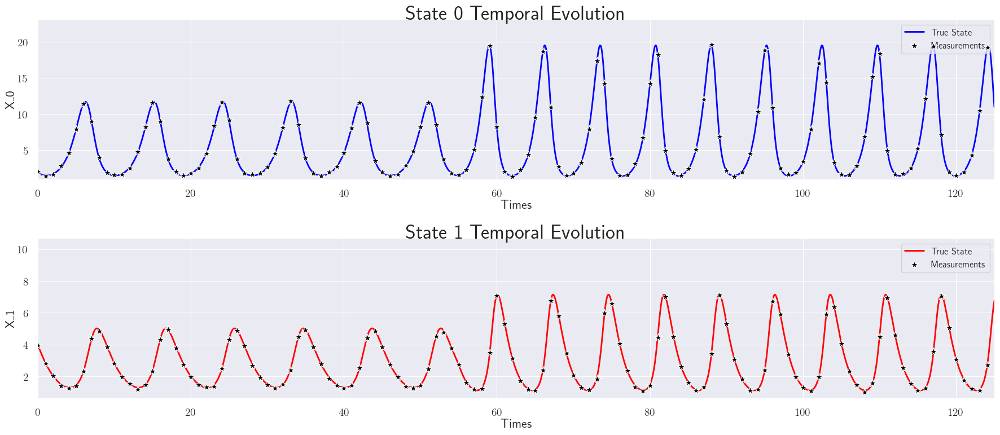

In [43]:
plotter3.plot_state_data(lv3_state_df,lv3_measure_df,markersize=100)

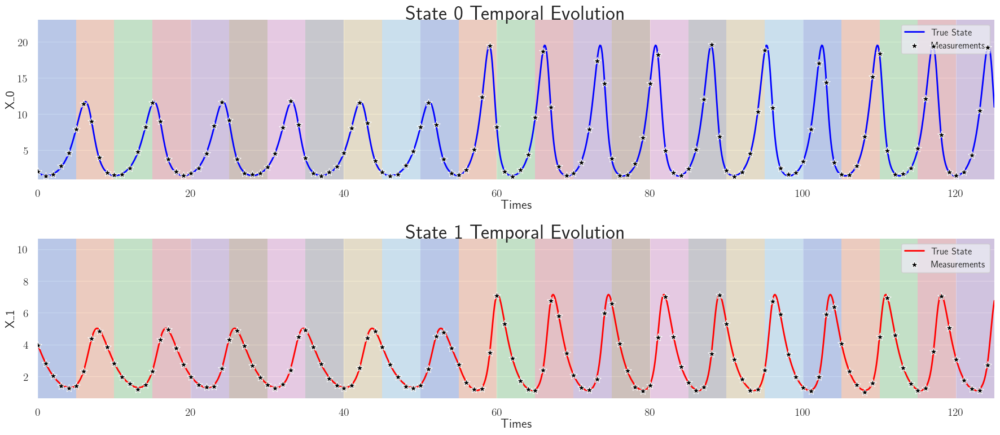

In [44]:
plotter3.plot_state_data(lv3_state_df,lv3_measure_df,window_type='rectangle')

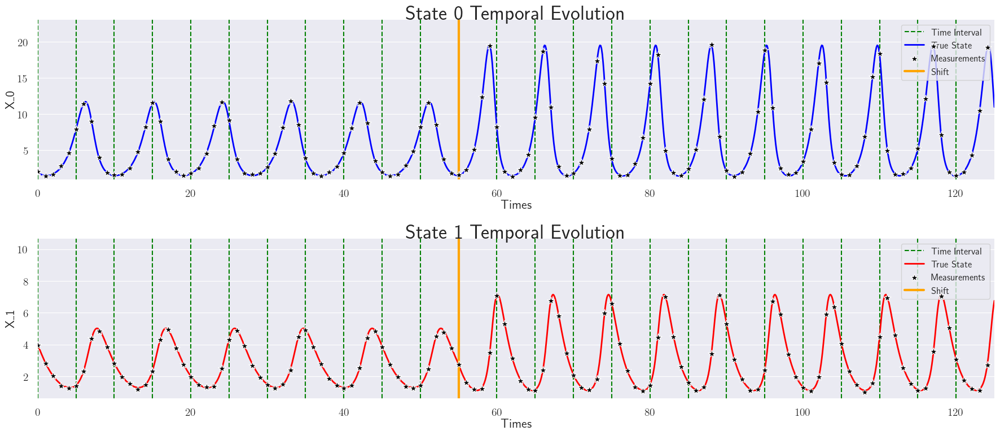

In [45]:
plotter3.plot_state_data(lv3_state_df,lv3_measure_df,window_type='line',shifts=lv3_param_shifts)

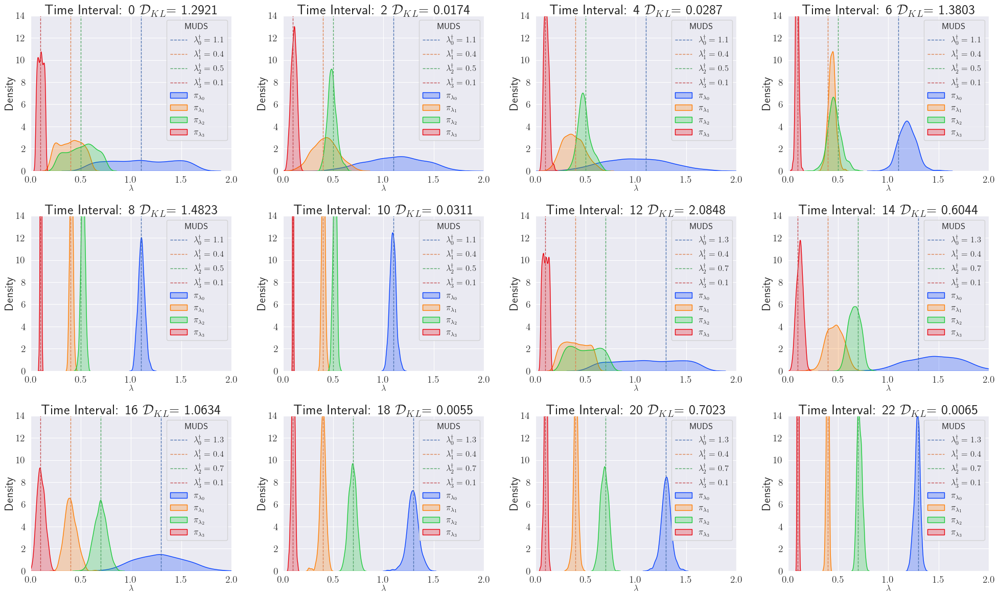

In [46]:
lv3_number_intervals = len(lv3_state_df['Interval'].unique())
lv3_iterations = np.arange(0,lv3_number_intervals,2)
plotter3.plot_parameters(lv3_res,lv3_iterations,'lv',number_parameters=4,nrows=3,ncols=4)

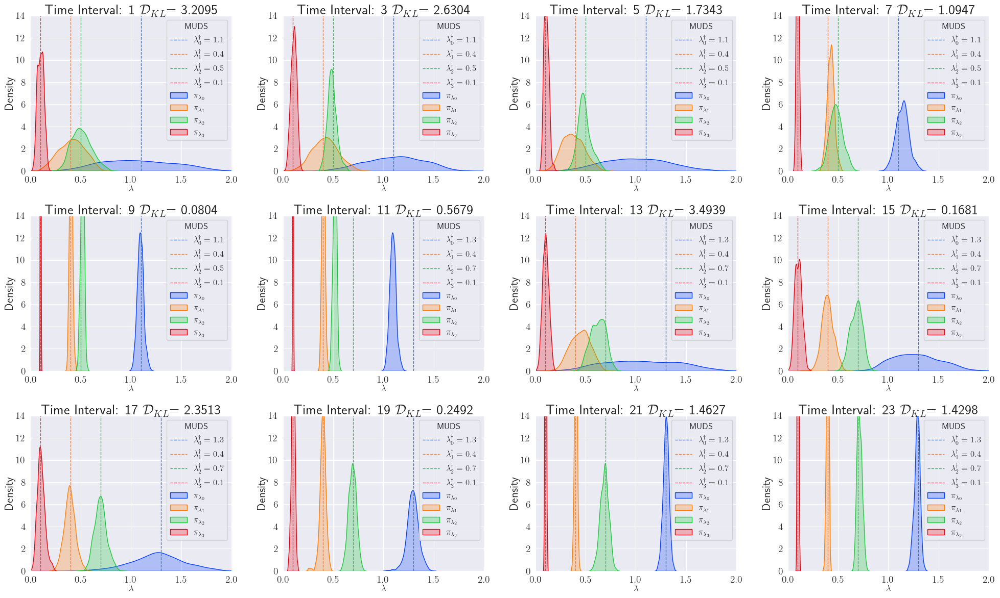

In [47]:
lv3_iterations = np.arange(1,lv3_number_intervals,2)
plotter3.plot_parameters(lv3_res,lv3_iterations,'lv',number_parameters=4,nrows=3,ncols=4)

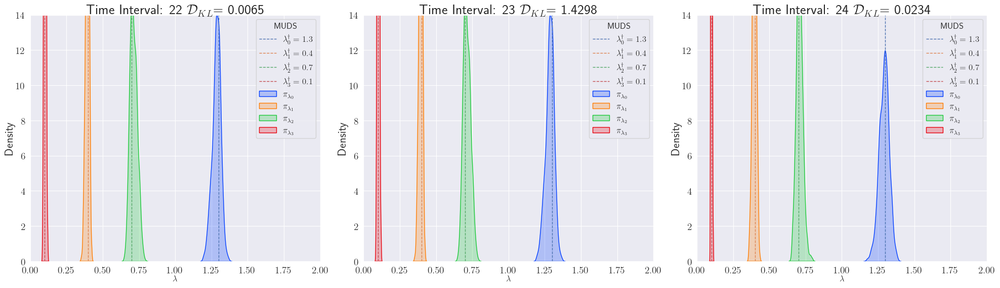

In [48]:
lv3_iterations = [22,23,24]
plotter3.plot_parameters(lv3_res,lv3_iterations,'lv',number_parameters=4,nrows=1,ncols=3)

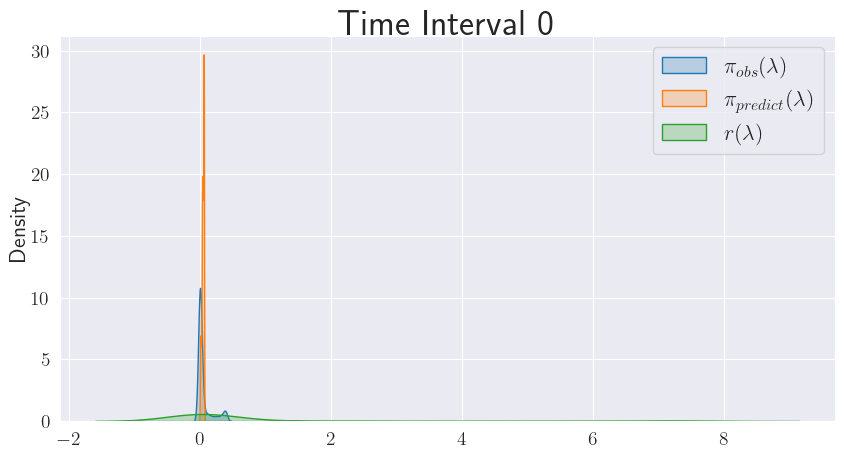

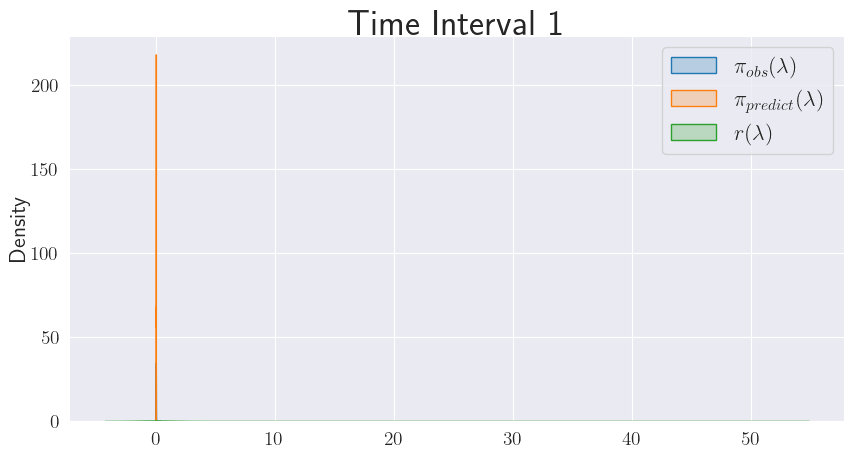

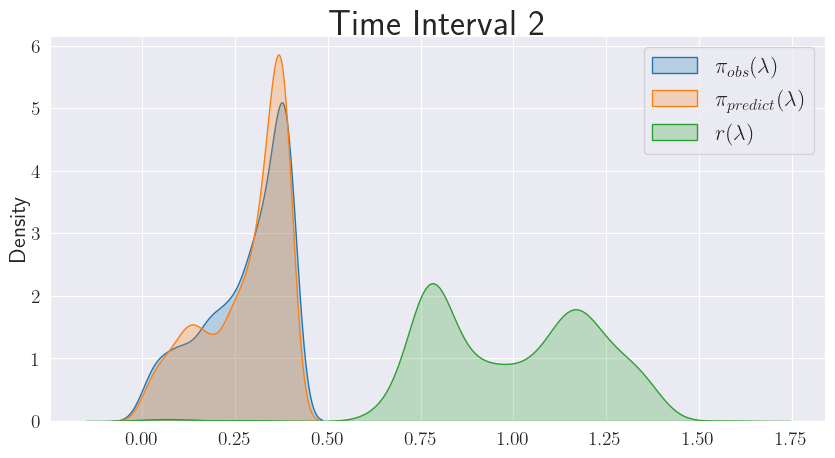

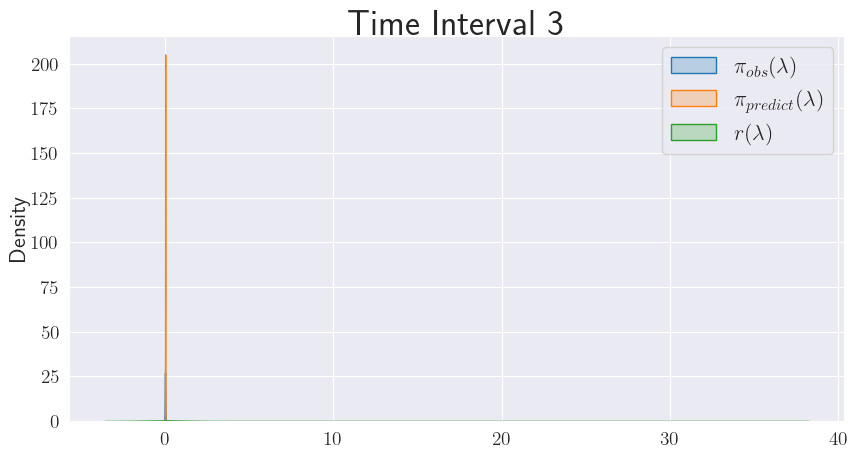

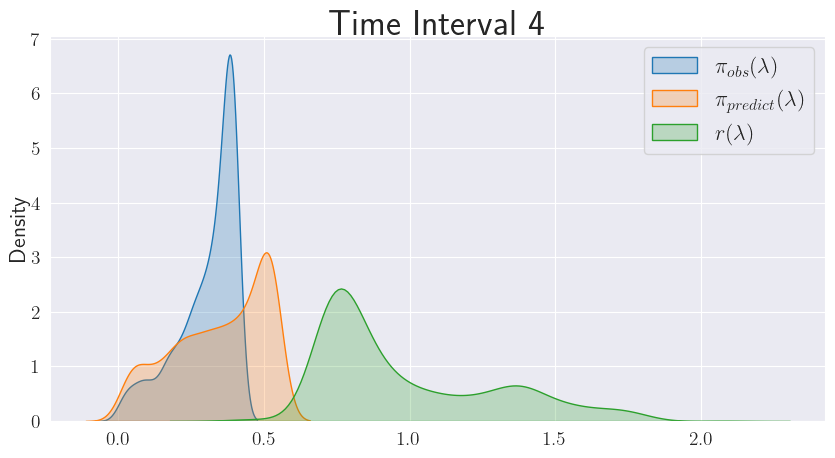

...

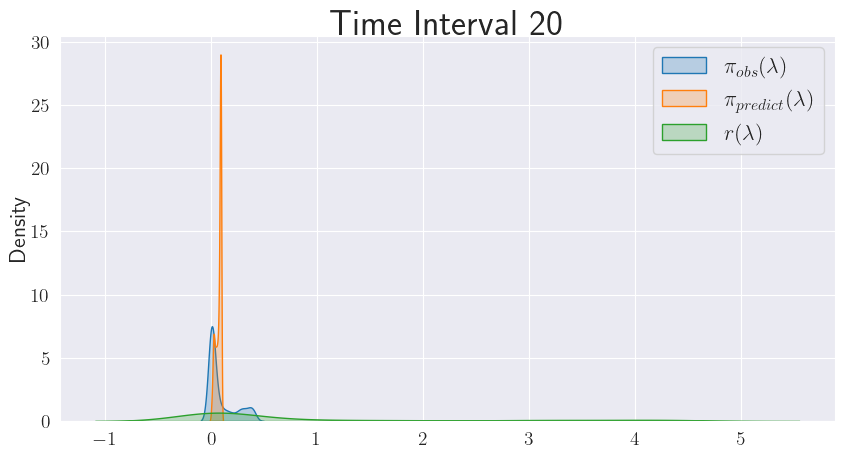

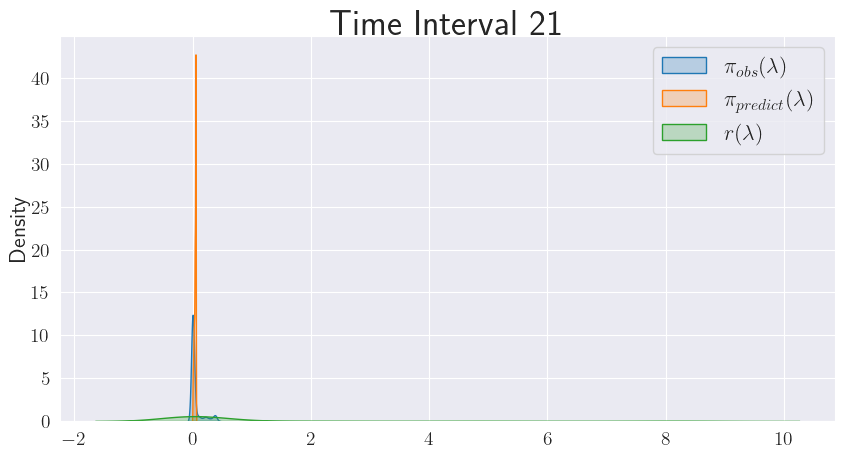

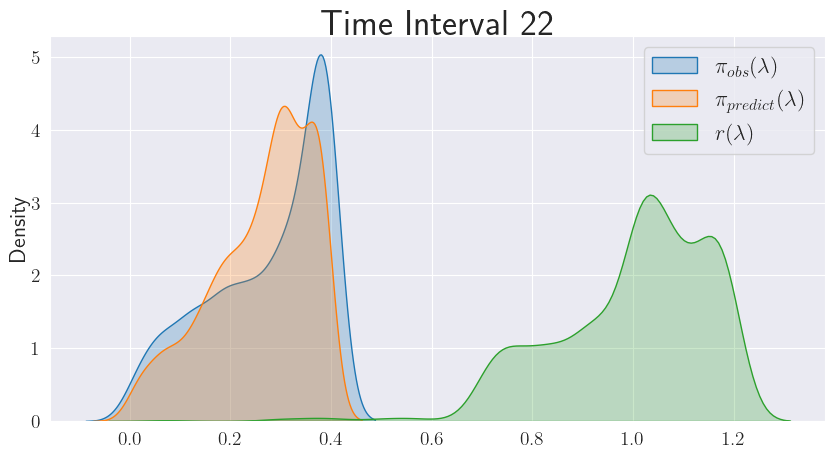

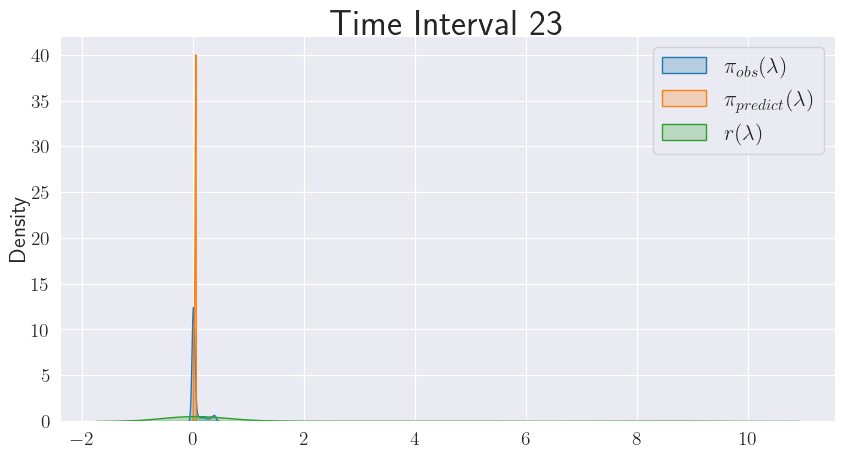

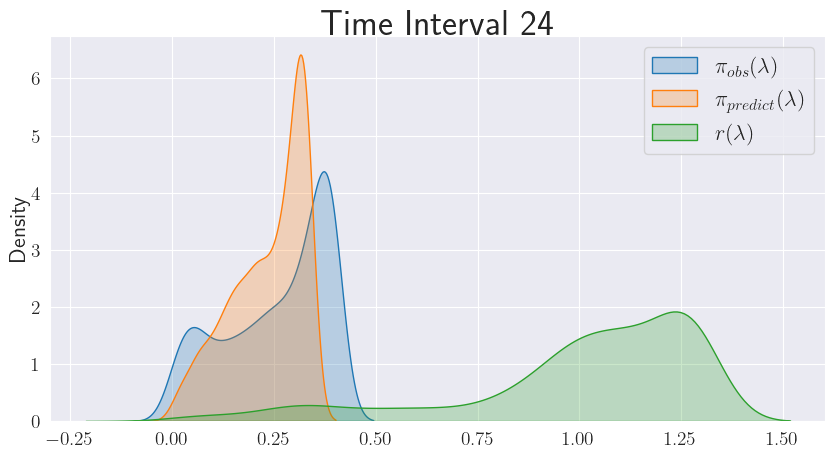

In [49]:
plotter3.plot_ratios(lv3_res)

/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:274: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


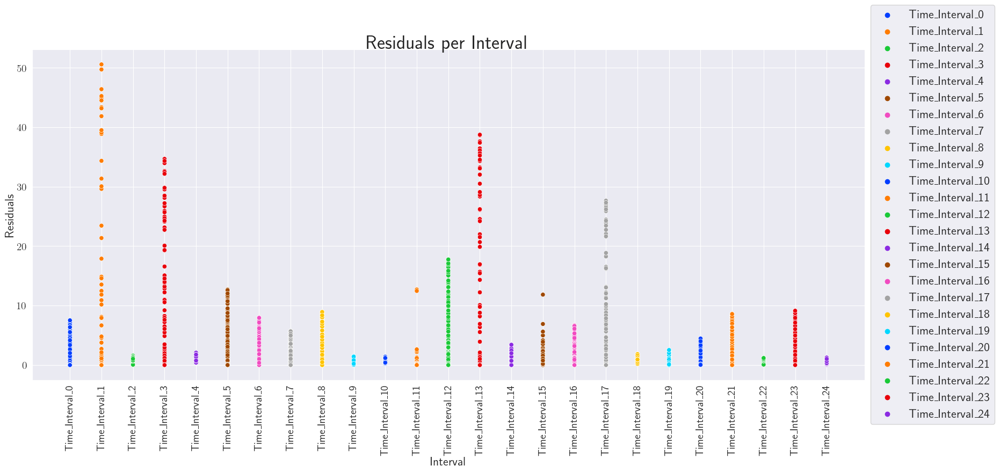

In [50]:
plotter3.plot_residual_scatter(lv3_residuals_df)

<Figure size 2000x1200 with 0 Axes>

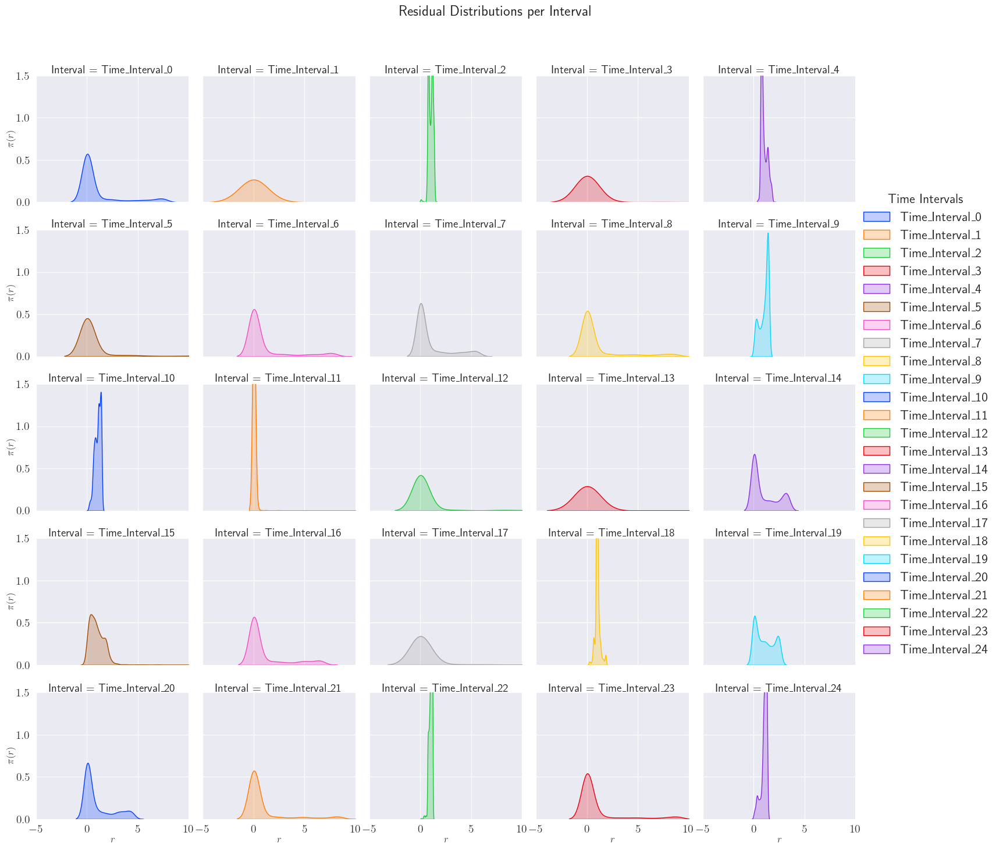

In [51]:
plotter3.plot_residual_dist(lv3_residuals_df)

In [52]:
stats3_df = post3.stats_df(lv3_residuals_df)
stats3_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,1.011050,2.126620,2.108725,3.026662
Time_Interval_1,0.937404,5.716976,6.796184,46.817124
Time_Interval_2,0.998541,0.221793,-0.349258,0.369894
Time_Interval_3,1.052984,4.773248,5.195040,27.553682
Time_Interval_4,0.986846,0.303124,0.978032,-0.149311


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:334: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


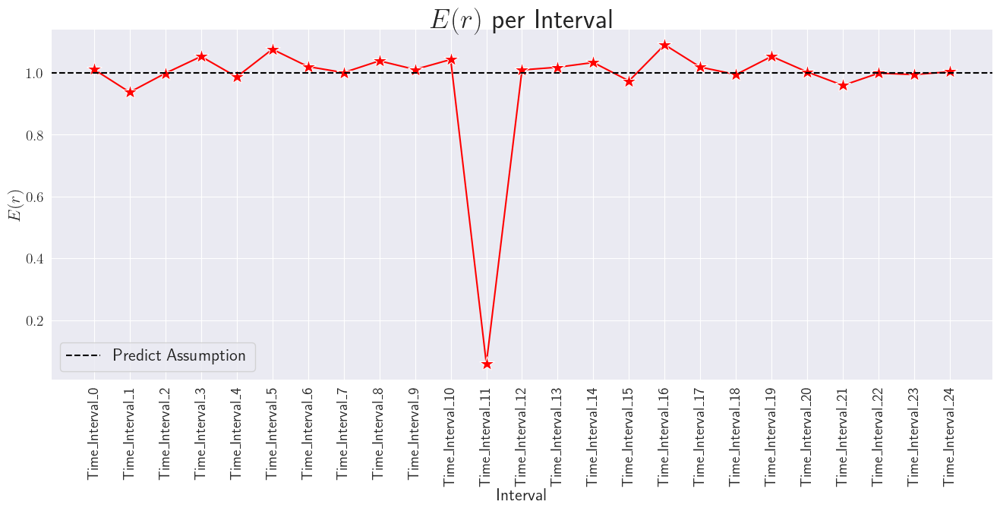

In [53]:
plotter3.plot_expected_ratios(stats3_df)

_____

## SEIR Model

**Problem description**:

The SEIR model describes the spread of a disease in a population fixed to $N$ individuals over time $t$. Furthermore, the model divides the population into four categories, called "S", "E", "I", and "R".
- "S" consists of individuals who are susceptible to the disease being modeled.
- "E" consists of individuals who are exposed to the disease. Diseases (like COVID-19) often have an incubation period or a latency period and this category accommodates it. (The SIR model does not have this category.)
- "I" consists of individuals infected with the disease and are capable of infecting others.
- "R" consists of individuals who can be removed from the system, e.g., because they have gained immunity to the disease, or because they have succumbed to the disease.

The SEIR model, like many other epidemiological models depends on particular parameters, which are the following :
 - $\beta>0$ The rate of contraction of the disease (transmission parameter)
 - $ \sigma >0$ The incubation rate i.e. the rate at which exposed hosts become infected
 - $\gamma>0$ : The mean recovery rate
Individual $S$ becomes infected after positive contact with an $I$ individual. However, he develops immunity to the disease : he leaves $I$ category at a $\gamma$ cure rate.

**Model Assumptions**

- Model is deterministic
- On average, an individual $S$ in the population encounters $\beta$ individuals per unit time.
- The rate of infected individuals leaving category $I$ is $\gamma I$ per unit time (once an individual has been infected, he develops immunity to the disease).
- The population size $N=S+E+I+R$ is constant.
- Note constant average number of contacts $\beta$ is a strong and constraining assumption : it cannot be applied to all diseases.

This is the system of equations of the model :

The total population $N$ in the system (the sum of individuals in all categories) is likely to be quite large. Instead of working with such large numbers, let us divide each side of each equation by $\mathbf{N}$ and work instead with the proportions
$$
s=\frac{S}{N}, \quad e=\frac{E}{N}, \quad i=\frac{I}{N}, \quad r=\frac{R}{N} .
$$
The equivalent ODE system to be solved for the unknown functions $s(t), e(t), i(t)$, and $r(t)$, has now become
$$
\begin{aligned}
& \frac{d s}{d t}=-\beta i s \\
& \frac{d e}{d t}=\beta i s-\sigma e \\
& \frac{d i}{d t}=\sigma e-\gamma i \\
& \frac{d r}{d t}=\gamma i
\end{aligned}
$$
When supplemented with some initial conditions, say
$$
s(0)=0.99, \quad e(0)=0.01, \quad i(0)=0, \quad r(0)=0
$$
This is the formulation of the Initial Value Probelm we wish to solve. Note that the above initial conditions correspond to a starting scenario where just $1 \%$ of the population is exposed.


In [2]:

def seir_system(states: np.ndarray, time: np.ndarray, *parameters: tuple[float, float]
    ) -> np.ndarray:
        """
        Parameters
        ----------
        states : np.ndarray
            An array of the current states of the system
        time : np.ndarray
            simulation time array
        *parameters : tuple[float, float]
            The parameters of the model: beta, gamma
        Returns
        -------
        np.ndarray
            The derivatives of the states with respect to time
        """

        beta, sigma,gamma = parameters

        xdot = np.array([-beta * states[2] * states[0],
                     -sigma * states[1] + beta * states[2] * states[0], 
                     -gamma * states[2] + sigma * states[1], 
                     gamma * states[2]])

        return xdot


def seir_run_model(x0,
              times,
              parameter_samples) -> None:
    """
    Runs the SEIR model for a specified number of drift windows.
    Uses the initial state, the drift windows, the times, the get_parameters and save_output methods of the class
    to integrate the system of ODEs and save the output for each window.

    Parameters
    ----------
    self : object
        The instance of the class
    """
    return odeint(seir_system, x0, times, args=parameter_samples)

In [33]:
importlib.reload(alg)

<module 'algorithms' from '/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/algorithms.py'>

### CASE: 2-Parameter 2-Drift

#### <center> Select Seed & Run Model

In [56]:
#       Seeds
#      ---------
# initial | Measure | Outcomes
#-----------------------------
# (737794, 918771)     bad (can't catch second shift, see: r dist plot for reason intuition)  shift times: shift 1: 55, shift 2: 125
# (114711, 275212)     bad (can't catch second shift, see: r dist plot for reason intuition)  shift times: shift 1: 55, shift 2: 100
# (594649, 899702)     bad (can't catch second shift, see: r dist plot for reason intuition)  shift times: shift 1: 55, shift 2: 75


In [57]:
# seir_initial_seed, seir_measurement_seed

In [57]:
seir_param_mins = [0, 0,0]

# seir_true_param = [0.3,  # beta transmission rate
#                   0.3, # sigma incubation rate i.e. rate at which exposed hosts become infected,
#                 0.2]  # gamma  mean recovery rate

seir_true_param = [0.4,  # beta transmission rate
                  0.2, # sigma incubation rate i.e. rate at which exposed hosts become infected,
                0.1]  # gamma  mean recovery rate


# (1) Policy Lockdown: => Slower Transmission Rate(beta), (2) Virus Mutation: => Faster Incubation Rate(sigma)
seir_shift_1 = [                
    25,
    [
        0.3,  # beta
        0.25, # sigma
        0.1,  # gamma
    ],
]
# (1) Virus Mutation: => Faster Recovery Rate (gamma), (2) Virus Mutation: => Faster Incubation Rate (sigma)
seir_shift_2 = [
    75,
    [
        0.3,  # beta
        0.3, # sigma
        0.15,  # gamma
    ],
]

seir_initial_seed = np.random.randint(0, 10e5)
seir_measurement_seed = np.random.randint(0, 10e5)

seir_initial_state = np.array([0.99, # susceptible
                              0.01, # exposed
                                0, # infected
                                0] # recovered
                         )



# seir_param_shifts = [seir_shift_2,seir_shift_1]
seir_param_shifts = []

seir_res = alg.sequential_resampling(
    seir_run_model,
    seir_initial_state,
    seir_true_param,
    num_samples=1000,
    measurement_noise=0.01,
    diff=0.6,
    solve_ts=0.2,
    sample_ts=2,
    time_window=12,
    end_time=120,
    param_shifts=seir_param_shifts,
    max_nc=1,
    param_mins=seir_param_mins,
    init_seed=seir_initial_seed,
    obs_seed=seir_measurement_seed,
)

Initi: Uniform over [[0.16 0.64]
 [0.08 0.32]
 [0.04 0.16]]

====== iteration 0 ======
True Param: [0.4, 0.2, 0.1]
Pushing 1000 samples forward through model
	 ... SEARCH SUMMARY ...
	1: 5/6 points:
		Best(E(r)) = 1.0042265609560883
		Best(Mud) = [0.45461902 0.17141661 0.1313811 ]
		Mean(E(r)) = 0.8415514854630668, STD(E(r)) = 0.12772538264874078
		MIN(E(r)) = 0.6952749743712434, MAX(E(r))) = 1.0042265609560883

	Best mud estimate nc = 1, num_ts = 5:
	mud point = [0.45461902 0.17141661 0.1313811 ]
	E(r) = 1.0042265609560883
	min/max = (1.477494140023732e-13, 1.8155400015213503)
	Drawing new samples: e_r within threshold 0.1

====== iteration 1 ======
True Param: [0.4, 0.2, 0.1]
Pushing 1000 samples forward through model
	 ... SEARCH SUMMARY ...
	1: 1/6 points:
		Best(E(r)) = 1.0158028960494851
		Best(Mud) = [0.50525437 0.17431417 0.13793728]
		Mean(E(r)) = 1.0356566919864538, STD(E(r)) = 0.02068509884656031
		MIN(E(r)) = 1.0158028960494851, MAX(E(r))) = 1.066109228356414

	Best mud est

In [58]:
plotter4 = Plotter()
post4 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data

In [59]:
seir_state_df, seir_measure_df, seir_residuals_df, seir_predicted_lambdas_df, seir_pushforward_df = post4.post_process_model(seir_res)
display(seir_state_df.head(),seir_measure_df.head(),seir_residuals_df.head(),seir_predicted_lambdas_df.head())

,Times,X_0,X_1,X_2,X_3,Interval
0,0.000000,0.990000,0.010000,0.000000,0.000000,Time_Interval_0
1,0.203390,0.989984,0.009617,0.000395,0.000004,Time_Interval_0
2,0.406780,0.989937,0.009280,0.000767,0.000016,Time_Interval_0
3,0.610169,0.989861,0.008985,0.001119,0.000035,Time_Interval_0
4,0.813559,0.989757,0.008728,0.001453,0.000061,Time_Interval_0


,Times,X_0,X_1,X_2,X_3,Interval
0,0.000000,1.004966,0.009325,0.004239,0.015377,Time_Interval_0
1,2.033898,0.982401,0.010643,0.008955,-0.013951,Time_Interval_0
2,4.067797,0.974212,0.027512,0.003146,0.007788,Time_Interval_0
3,6.101695,0.989075,0.008608,-0.010502,0.008605,Time_Interval_0
4,8.135593,0.975129,-0.011725,0.008263,0.012868,Time_Interval_0


,Residuals,Interval
0,0.805125,Time_Interval_0
1,1.032117,Time_Interval_0
2,1.254371,Time_Interval_0
3,1.038661,Time_Interval_0
4,1.567441,Time_Interval_0


,$\pi_{\lambda_0}$,$\pi_{\lambda_1}$,$\pi_{\lambda_2}$,Interval
0,0.217379,0.150559,0.157204,Time_Interval_0
1,0.276392,0.169774,0.128193,Time_Interval_0
2,0.250372,0.188664,0.070417,Time_Interval_0
3,0.195428,0.215674,0.075157,Time_Interval_0
4,0.271894,0.286687,0.131855,Time_Interval_0


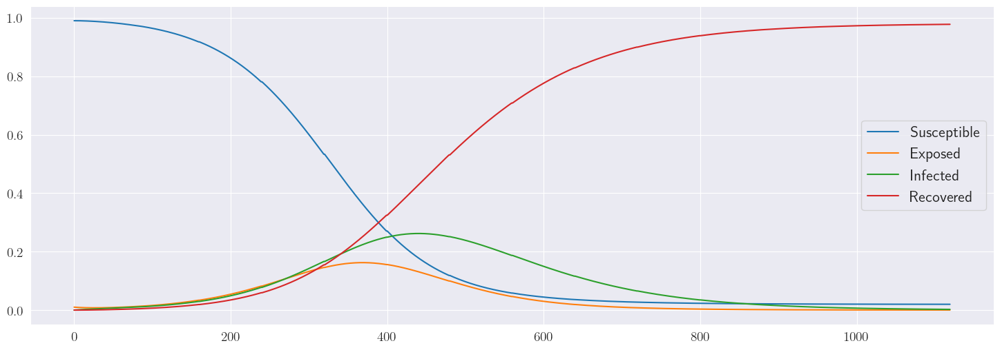

In [27]:
seir_state_df.iloc[:,1:5].plot(figsize=(18,6))
plt.legend(labels=['Susceptible', 'Exposed', 'Infected', 'Recovered'])
plt.show()

##### Time Series Analysis (Quick Look, can just be ignored)

In [ ]:
# ! pip install statsmodels

In [40]:
# from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# from statsmodels.graphics.gofplots import qqplot
# from statsmodels.tsa.stattools import acf, pacf
# from statsmodels.tsa.tsatools import lagmat

/Users/rylanspence/opt/anaconda3/envs/dc_sequence/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


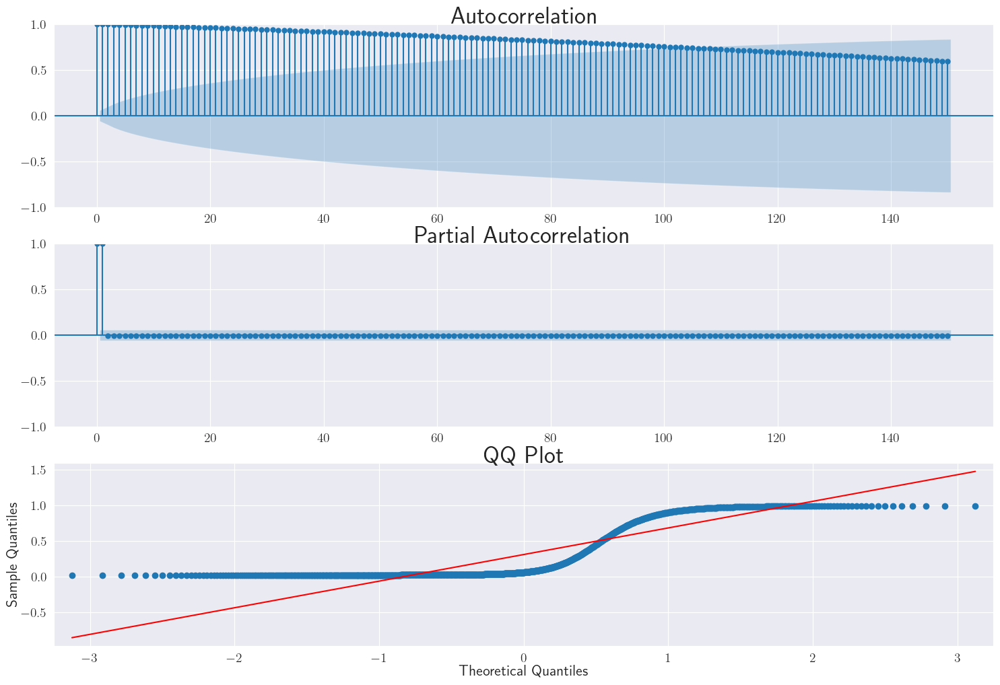

/Users/rylanspence/opt/anaconda3/envs/dc_sequence/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


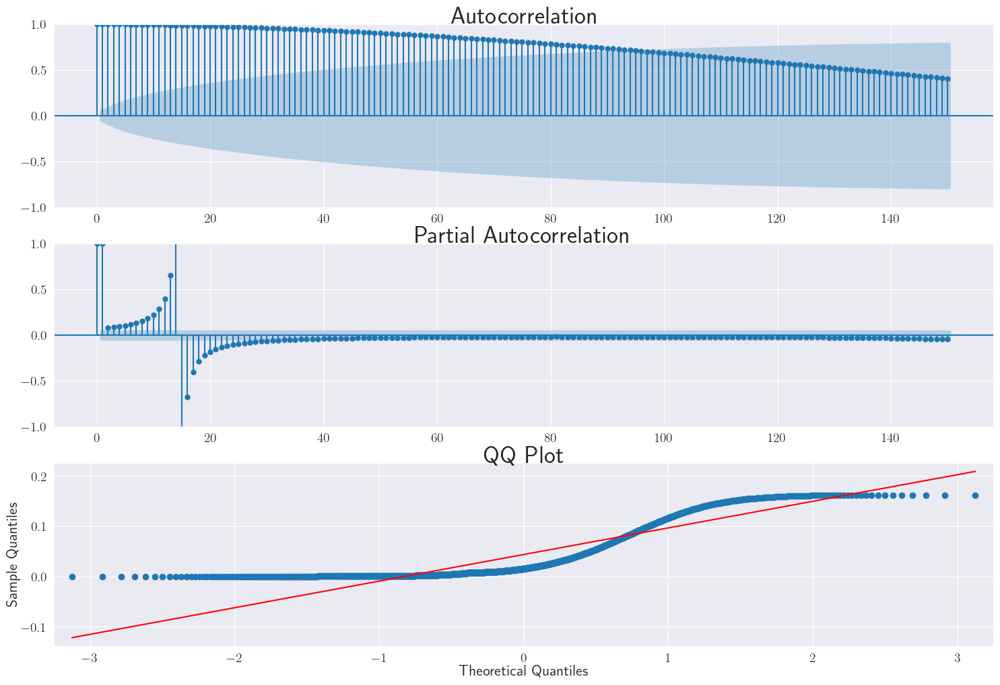

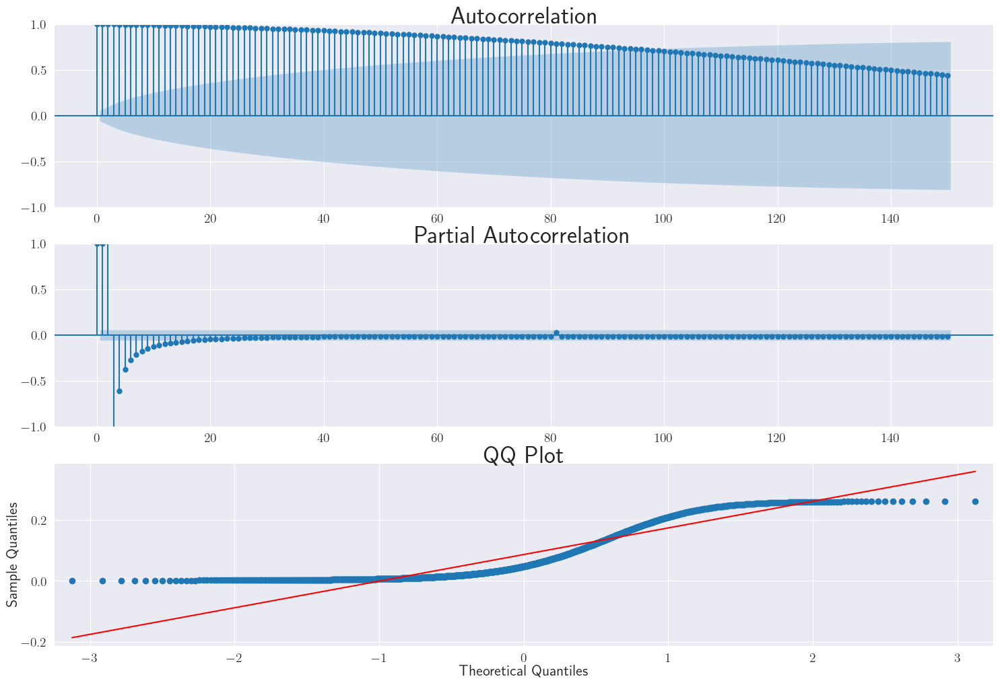

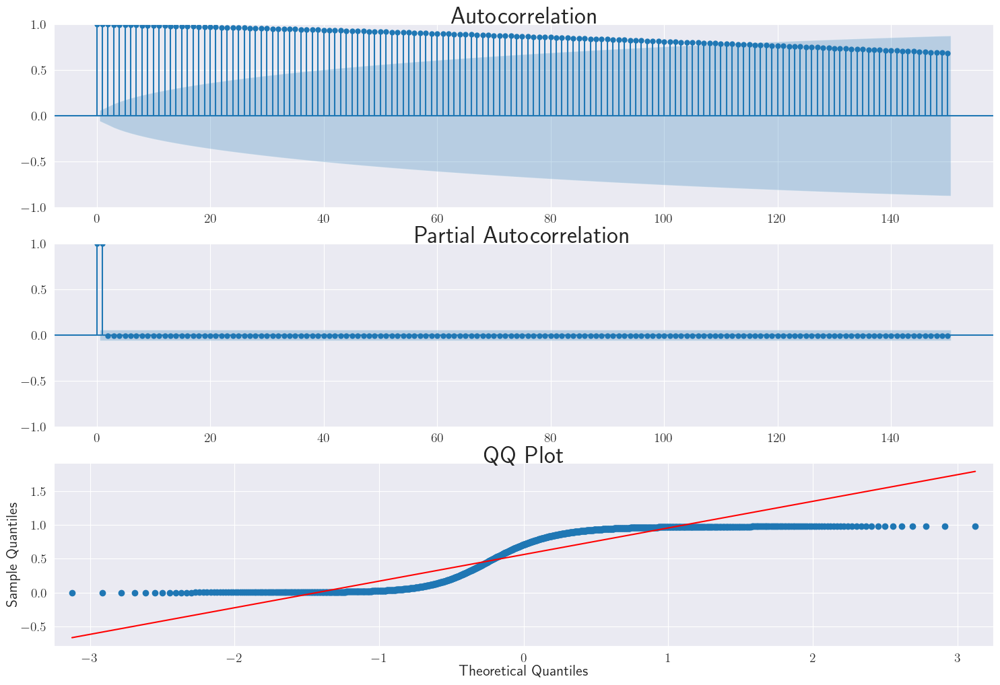

In [44]:

# for i in range(1,5):
#     fig, ax = plt.subplots(3, 1,figsize=(18,12))
#     plot_acf(seir_state_df.iloc[:,i], lags=150, ax=ax[0])
#     plot_pacf(seir_state_df.iloc[:,i], lags=150, ax=ax[1])
#     qqplot(seir_state_df.iloc[:,i], line='s', ax=ax[2])
#     ax[2].set_title('QQ Plot')
#     plt.show()
    

#### <center> Visualize Sequential Time Series Data <center>

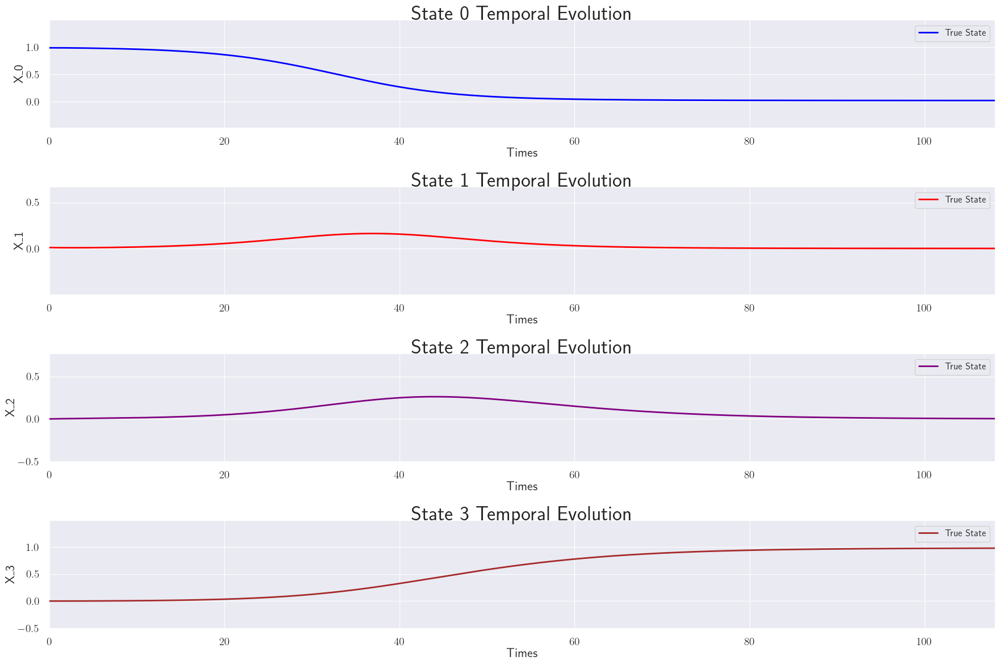

In [48]:
plotter4.plot_state_data(seir_state_df)

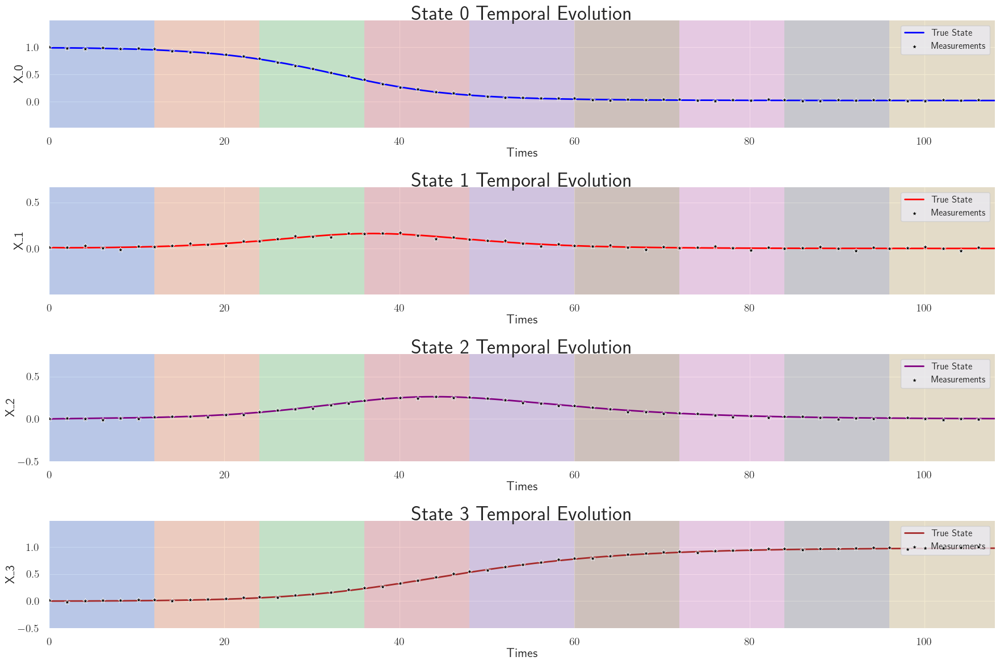

In [60]:
plotter4.plot_state_data(seir_state_df,seir_measure_df,window_type='rectangle',markersize=50)

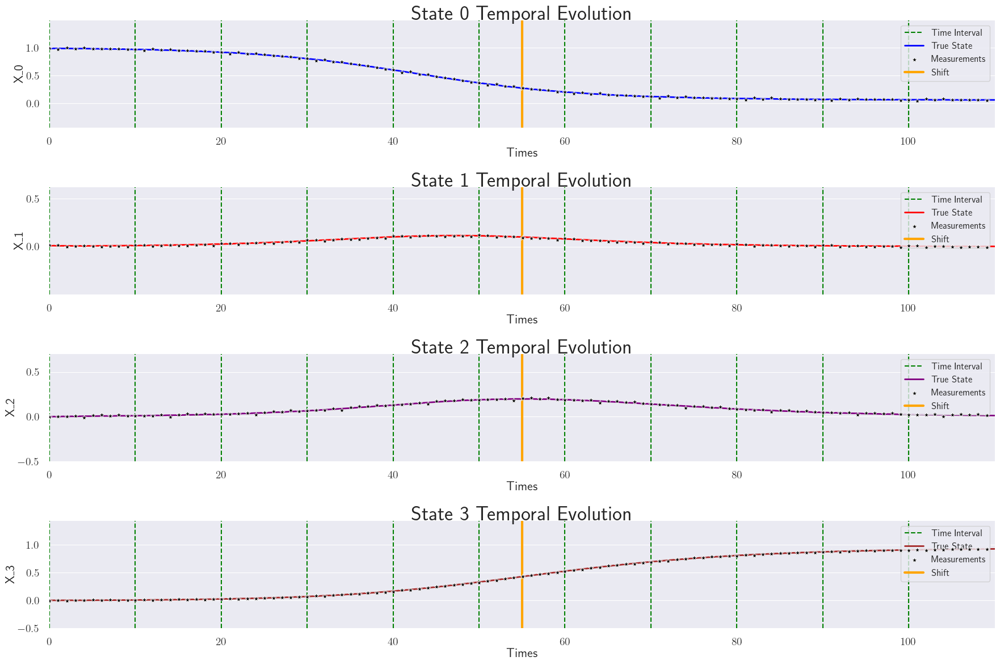

In [41]:
seir_param_shifts = [seir_shift_1,seir_shift_2]
plotter4.plot_state_data(seir_state_df,seir_measure_df,window_type='line',shifts=seir_param_shifts,markersize=50)

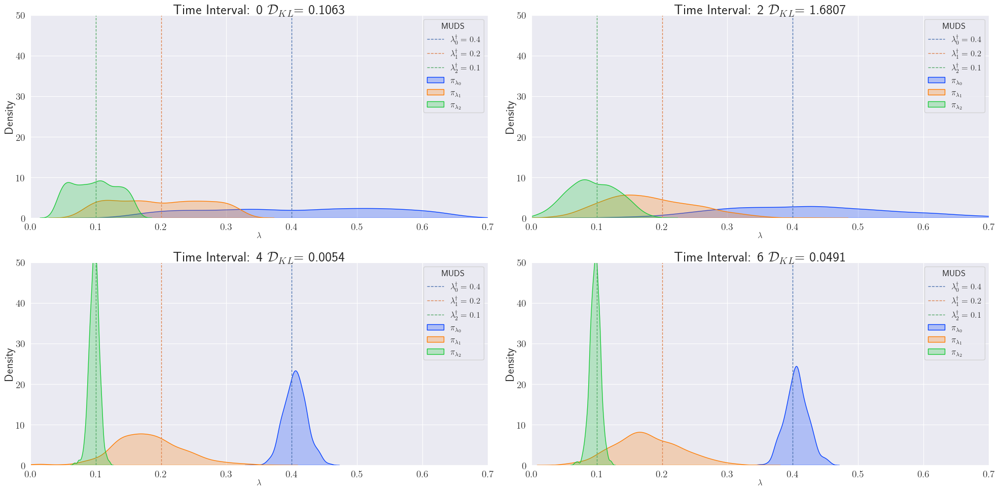

In [61]:
seir_number_intervals = len(seir_state_df['Interval'].unique())
seir_iterations = np.arange(0,seir_number_intervals-1,2)
plotter4.plot_parameters(seir_res, seir_iterations,'seir',number_parameters=3,nrows=2,ncols=2)

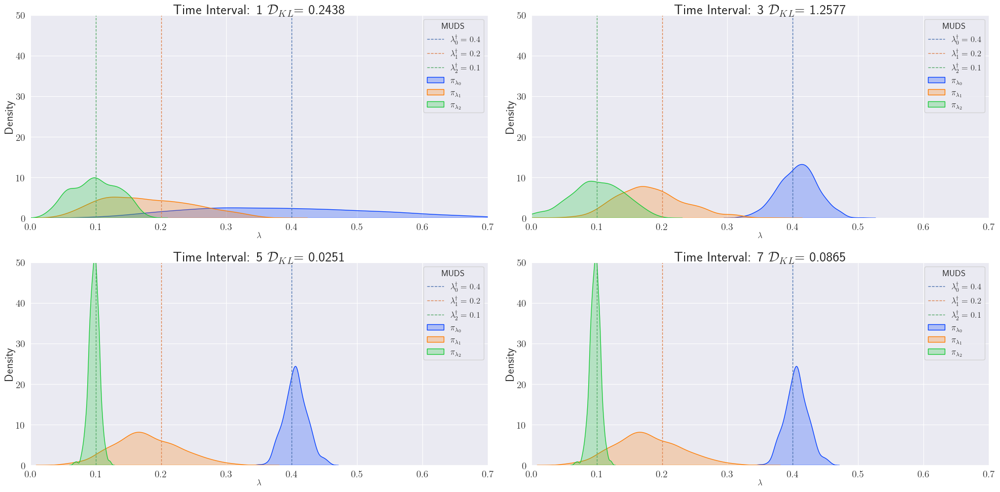

In [62]:
seir_iterations = np.arange(1,seir_number_intervals-1,2)
plotter4.plot_parameters(seir_res, seir_iterations,'seir',number_parameters=3,nrows=2,ncols=2)


In [149]:
seir_number_intervals

14

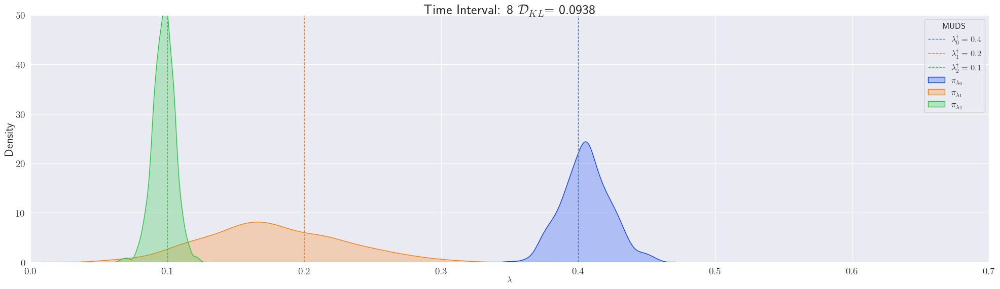

In [63]:
seir_iterations = [8]
plotter4.plot_parameters(seir_res, seir_iterations,'seir',number_parameters=3,nrows=1,ncols=1)

In [ ]:
plotter4.plot_ratios(seir_res)

/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:274: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


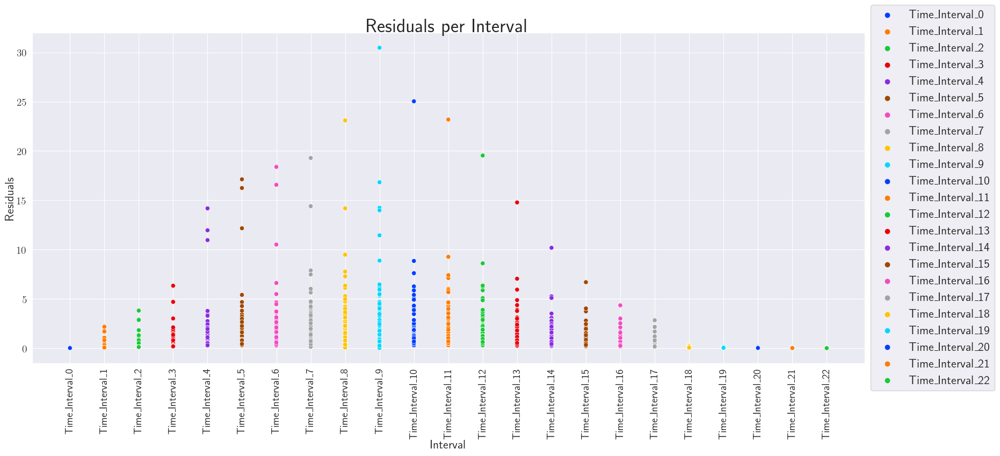

In [69]:
plotter4.plot_residual_scatter(seir_residuals_df)

<Figure size 2000x1200 with 0 Axes>

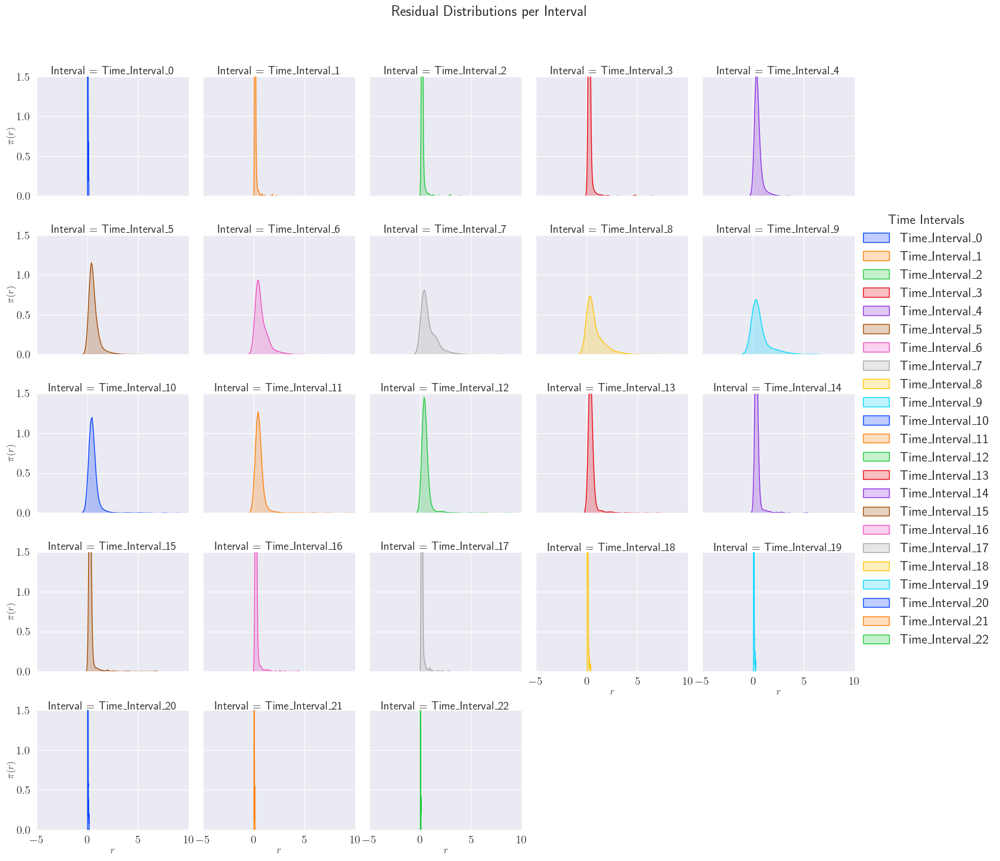

In [70]:
plotter4.plot_residual_dist(seir_residuals_df)

In [55]:
stats4_df = post4.stats_df(seir_residuals_df)
stats4_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,1.007220,0.666904,0.154120,-1.192671
Time_Interval_1,0.996643,1.937069,1.963680,2.506523
Time_Interval_2,1.015578,1.729208,1.620144,1.197287
Time_Interval_3,1.011730,0.370771,-1.198645,0.190542
Time_Interval_4,1.004624,0.642358,-0.133274,-1.392839


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:332: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


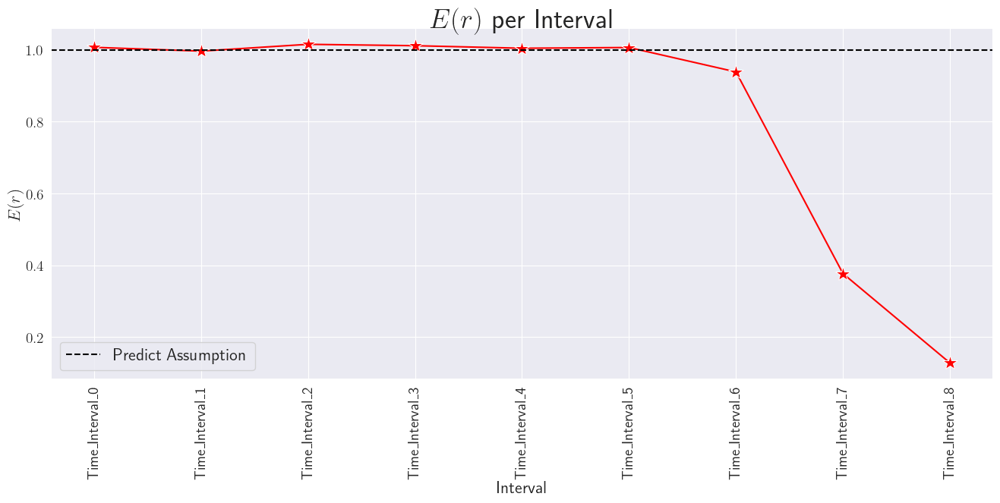

In [56]:
plotter4.plot_expected_ratios(stats4_df)

____

# RLC Model

The RLC circuit is the electrical circuit consisting of a resistor of resistance $R$, a coil of inductance $L$, a capacitor of capacitance $C$ and a voltage source arranged in series. If the charge
on the capacitor is $Q$ and the current flowing in the circuit is $I$, the voltage across $R, L$ and $C$ are $R I, L \frac{d I}{d t}$ and $\frac{Q}{C}$ respectively. By the Kirchhoff's law that says that the voltage between any two points has to be independent of the path used to travel between the two points,

$$
L I^{\prime}(t)+R I(t)+\frac{1}{C} Q(t)=V(t)
$$

Assuming that $R, L, C$ and $V$ are known, this is still one differential equation in two unknowns, $I$ and $Q$. However the two unknowns are related by $I(t)=\frac{d Q}{d t}(t)$ so that

$$
L Q^{\prime \prime}(t)+R Q^{\prime}(t)+\frac{1}{C} Q(t)=V(t)
$$

or, differentiating with respect to $t$ and then subbing in $\frac{d Q}{d t}(t)=I(t)$,

$$
L I^{\prime \prime}(t)+R I^{\prime}(t)+\frac{1}{C} I(t)=V^{\prime}(t)
$$

This can be linearized into the following ODE system, by letting $x = [I, I^{\prime}]^T$

$$
x_0^{\prime} = x_1 \\
x_1^{\prime} = \frac{1}{L}V^{\prime} - \frac{R}{L}x_1 - \frac{1}{LC}x_0
$$

## Constant Voltage case

If we assume the a constant voltage, then the system becomes:

$$
x_0^{\prime} = x_1 \\
x_1^{\prime} = - \frac{R}{L}x_1 - \frac{1}{LC}x_0
$$

Where the initial condition becomes $x_0 = [I_0, 0]^T$

In [73]:
def rlc_system_constant(states: np.array, times: np.array, *parameters: tuple[float, float, float]
) -> np.array:
    """
    Parameters
    ----------
    states : np.ndarray
        An array of the current states of the system
    time : np.ndarray
        simulation time array
    *parameters : tuple[float, float]
        The parameters of the model: beta, gamma
    Returns
    -------
    np.ndarray
        The derivatives of the states with respect to time
    """
    r, = parameters

    xdot = [
        states[1],
        - (r / L) * states[1] - states[0] / (L * C),
    ]
    return xdot

def run_rlc(x0,
            times,
            parameter_samples) -> None:
    """
    Runs the RLC model for a specified number of drift windows.
    Uses the initial state, the drift windows, the times, the get_parameters and save_output methods of the class
    to integrate the system of ODEs and save the output for each window.

    Parameters
    ----------
    self : object
        The instance of the class
    """
    return odeint(rlc_system_constant, x0, times, args=parameter_samples)

In [74]:
importlib.reload(alg)

<module 'algorithms' from '/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/algorithms.py'>

### Response signal characteristics 

We know that the dampening factor:

$$
\zeta = \frac{R}{2}*\sqrt{\frac{C}{L}}
$$

We know that the regimes of behavior for the RL circuit are:

1. $\zeta < 1 \rightarrow $ Underdamped - Decaying oscillations
1. $\zeta > 1 \rightarrow $ Overdamped - Decay with no oscillations
1. $\zeta = 1 \rightarrow $ Critically damped - fastest decay possible without going into oscillation

In [75]:
L = 100    # L - Inductance in henrys
C = 1e-6   # C - Capicatance in Farads
R = 200    # R - Resistance in ohms

# Damping factor
zeta = R / 2 * np.sqrt(C/L)
print(f"Damping factor: {zeta}")

Damping factor: 0.01


#### CASE: 1-Parameter No-Drift (Insufficient Sampling Rate)

#### <center> Select Seed & Run Model <center>

In [76]:
#       Seeds
#      ---------
# initial | Measure | Outcomes
#-----------------------------
# (452763, 648208)   okay
# (751429, 265168)   good
# (503875, 774940)   really bad
# (986134, 379528)   really good

In [77]:
# rlc1_initial_seed, rlc1_measurement_seed 

In [78]:
L = 100    # L - Inductance in henrys
C = 1e-6   # C - Capicatance in Farads
R = 200    # R - Resistance in ohms

# Damping factor
zeta = R / 2 * np.sqrt(C/L)
print(f"Damping factor: {zeta}")

Damping factor: 0.01


In [79]:
sample_ts=.099
solve_ts = 1e-3

end_time = 1
num_windows = 5
time_window = end_time / num_windows

I_0 = 10  # Initial current in Amps
x_0 = np.array([I_0, 0])

rlc1_true_param = [R]
rlc1_param_shifts = []
rlc1_diff = [
    0.8,
]

rlc1_initial_seed = np.random.randint(0, 10e5)
rlc1_measurement_seed = np.random.randint(0, 10e5)

rlc1_res = alg.sequential_resampling(
    run_rlc,
    x_0,
    rlc1_true_param,  # np.array([0.5]*4),
    num_samples=1000,
    measurement_noise=0.5,
    diff=rlc1_diff,
    solve_ts=solve_ts,
    sample_ts=sample_ts,
    time_window=time_window,
    end_time=end_time,
    param_shifts=rlc1_param_shifts,
    max_nc=1,
    param_mins=[0, 0, 0],
    init_seed=rlc1_initial_seed,
    obs_seed=rlc1_measurement_seed,
)

Initi: Uniform over [[ 40. 360.]]

====== iteration 0 ======
True Param: [200]
Pushing 1000 samples forward through model
1
2
	 ... SEARCH SUMMARY ...
	1: 2/3 points:
		Best(E(r)) = 1.3348781225489632
		Best(Mud) = [201.7303027]
		Mean(E(r)) = 1.3971483058458052, STD(E(r)) = 0.062270183296841974
		MIN(E(r)) = 1.3348781225489632, MAX(E(r))) = 1.4594184891426472

	Best mud estimate nc = 1, num_ts = 2:
	mud point = [201.7303027]
	E(r) = 1.3348781225489632
	min/max = (0.0, 39.77145952926711)
	 Resampling from previous updated distribution

====== iteration 1 ======
True Param: [200]
Pushing 1000 samples forward through model
1
2
	 ... SEARCH SUMMARY ...
	1: 2/3 points:
		Best(E(r)) = 1.3327946425168051
		Best(Mud) = [200.18074338]
		Mean(E(r)) = 1.3631984129543726, STD(E(r)) = 0.030403770437567368
		MIN(E(r)) = 1.3327946425168051, MAX(E(r))) = 1.3936021833919399

	Best mud estimate nc = 1, num_ts = 2:
	mud point = [200.18074338]
	E(r) = 1.3327946425168051
	min/max = (0.0, 64.56009739446016

In [80]:
plotter5 = Plotter()
post5 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data <center>

In [81]:
rlc1_state_df, rlc1_measure_df, rlc1_residuals_df, rlc1_predicted_lambdas_df, rlc1_pushforward_df = post5.post_process_model(rlc1_res)
display(rlc1_state_df.head(),rlc1_measure_df.head(),rlc1_residuals_df.head(),rlc1_predicted_lambdas_df.head())

,Times,X_0,X_1,Interval
0,0.000000,10.000000,0.000000,Time_Interval_0
1,0.001005,9.949573,-100.232636,Time_Interval_0
2,0.002010,9.798933,-199.253447,Time_Interval_0
3,0.003015,9.549803,-296.066520,Time_Interval_0
4,0.004020,9.204890,-389.700211,Time_Interval_0


,Times,X_0,X_1,Interval
0,0.000000,9.464872,-0.057909,Time_Interval_0
1,0.099497,-6.984339,453.115215,Time_Interval_0
2,0.198995,3.999119,-709.881843,Time_Interval_0
3,0.200000,2.888156,-747.217156,Time_Interval_1
4,0.299497,1.586335,737.051144,Time_Interval_1


,Residuals,Interval
0,4.076997e-221,Time_Interval_0
1,0.000000e+00,Time_Interval_0
2,1.423217e-61,Time_Interval_0
3,4.934225e-142,Time_Interval_0
4,7.886134e-186,Time_Interval_0


,$\pi_{\lambda_0}$,Interval
0,106.538915,Time_Interval_0
1,359.941641,Time_Interval_0
2,253.816444,Time_Interval_0
3,125.041153,Time_Interval_0
4,114.281716,Time_Interval_0


#### <center> Visualize Sequential Time Series Data <center>

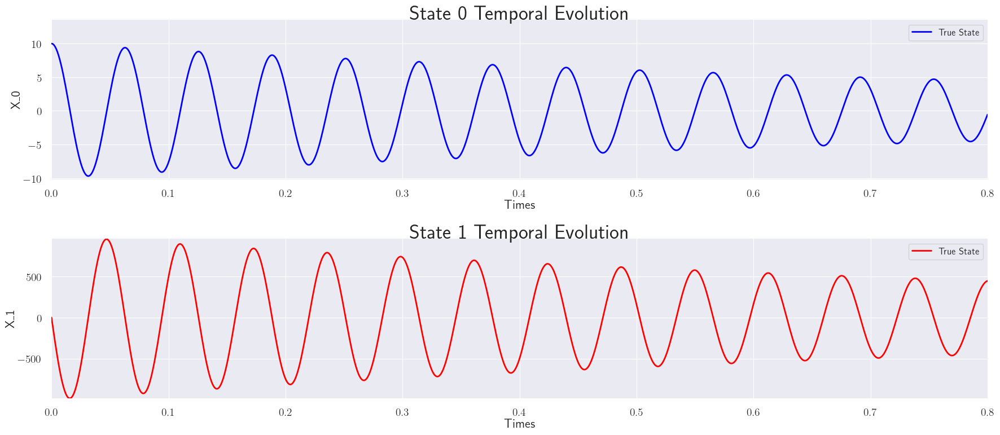

In [82]:
plotter5.plot_state_data(rlc1_state_df)

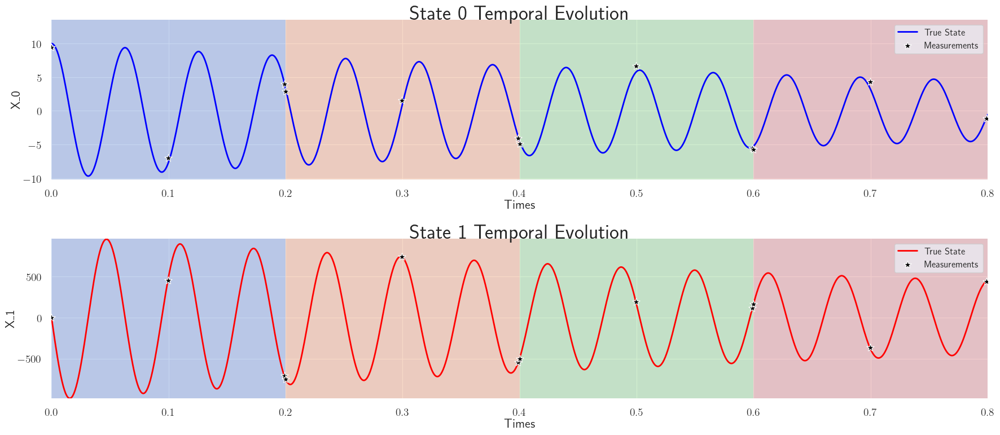

In [83]:
plotter5.plot_state_data(rlc1_state_df,rlc1_measure_df,window_type='rectangle',markersize=100)

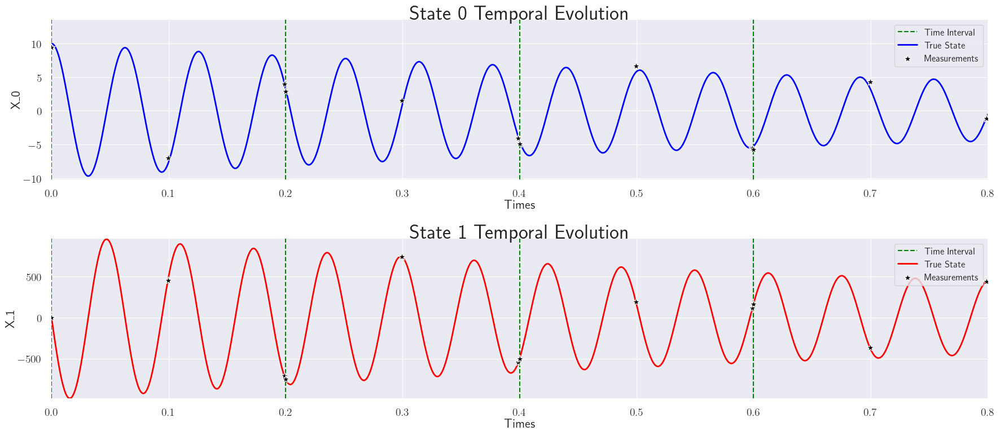

In [84]:
plotter5.plot_state_data(rlc1_state_df,rlc1_measure_df,window_type='line',shifts=rlc1_param_shifts)

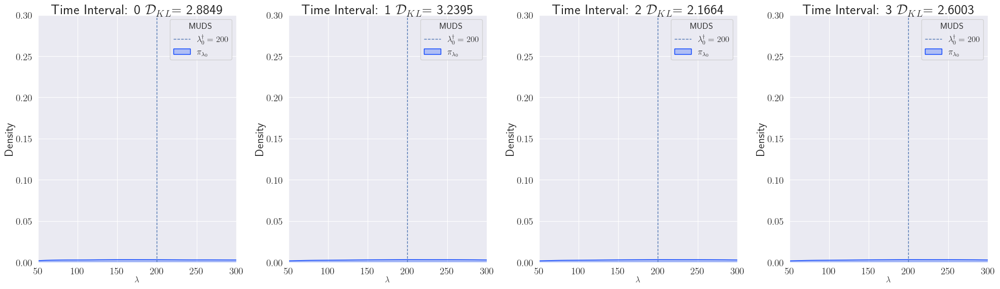

In [85]:
rlc1_number_intervals = len(rlc1_state_df['Interval'].unique())
rlc1_show_iterations = np.arange(rlc1_number_intervals)
plotter5.plot_parameters(rlc1_res,rlc1_show_iterations,'rlc', nrows=1,ncols=len(rlc1_show_iterations),number_parameters=1)

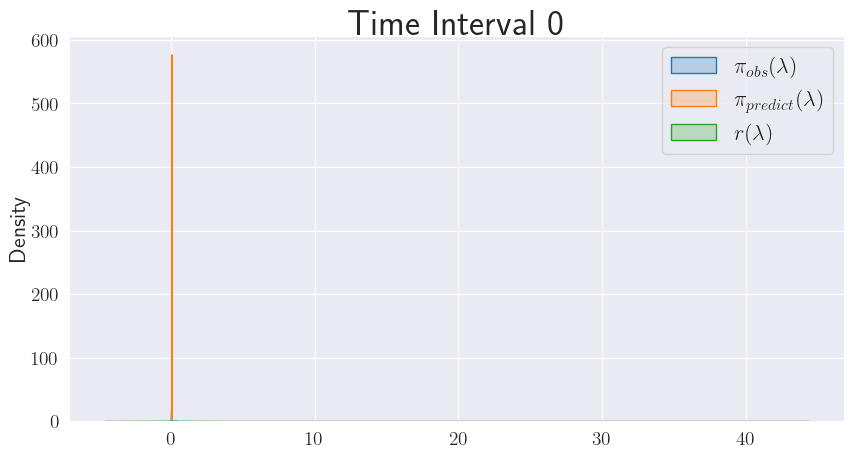

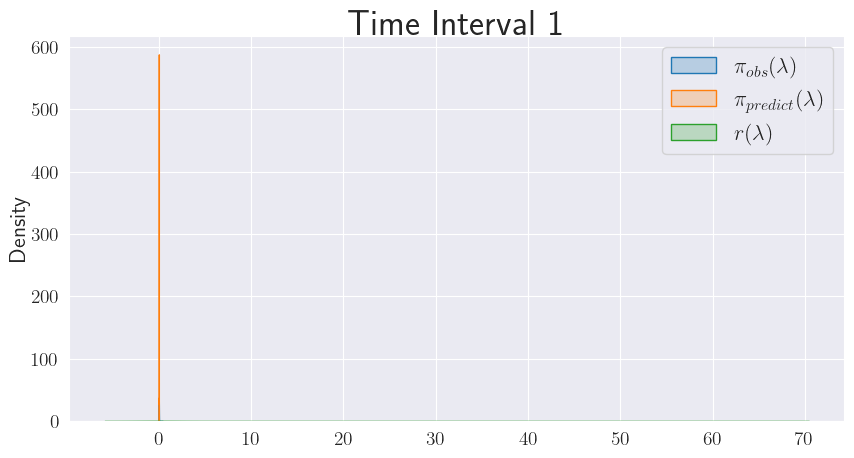

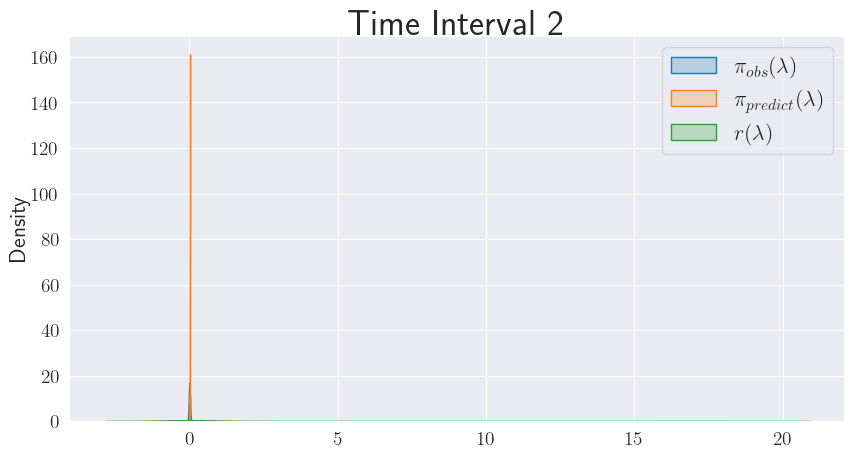

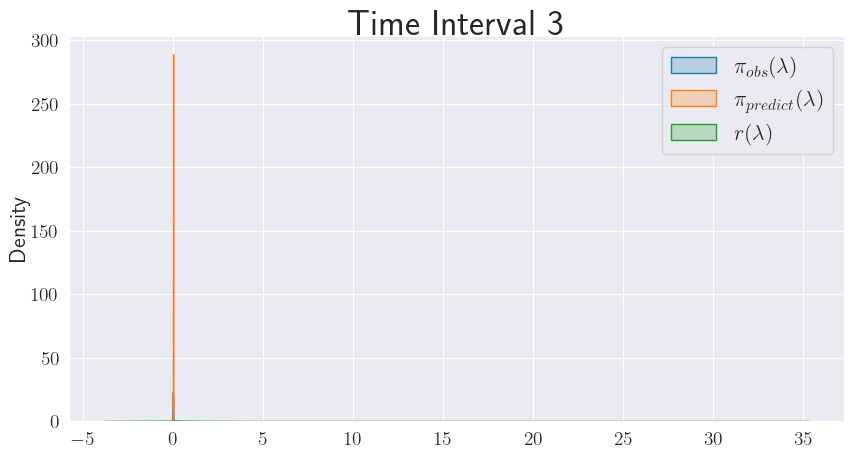

In [86]:
plotter5.plot_ratios(rlc1_res)

/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:274: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


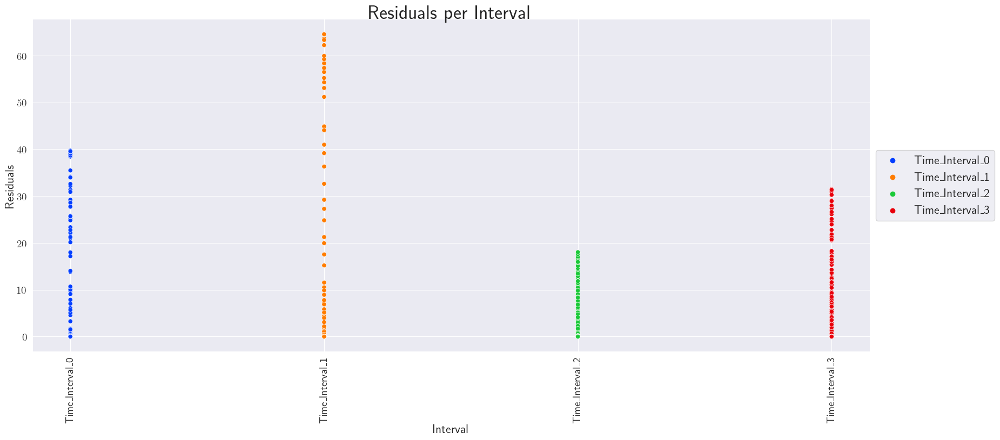

In [87]:
plotter5.plot_residual_scatter(rlc1_residuals_df)

<Figure size 1200x1000 with 0 Axes>

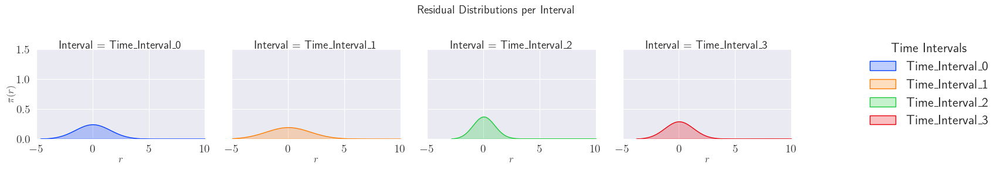

In [88]:
plotter5.plot_residual_dist(rlc1_residuals_df)

In [89]:
stats5_df = post5.stats_df(rlc1_residuals_df)
stats5_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,1.334878,6.168229,4.995740,24.554654
Time_Interval_1,1.332795,7.806639,6.596400,44.056092
Time_Interval_2,1.161934,3.797602,3.435653,10.640387
Time_Interval_3,1.213893,5.039856,4.615785,21.066173


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:334: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


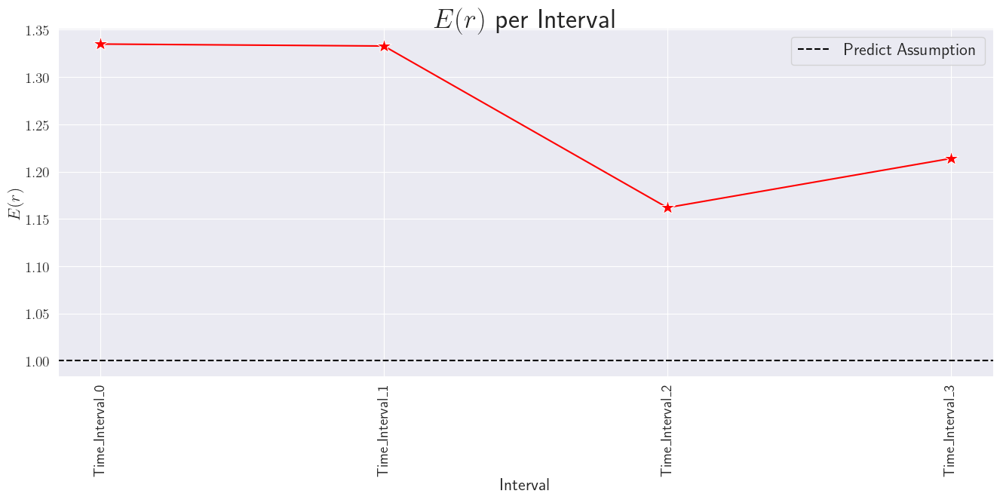

In [90]:
plotter5.plot_expected_ratios(stats5_df)

#### CASE: 1-Parameter No-Drift (Sufficient Sampling Rate)

#### <center> Select Seed & Run Model <center>

In [91]:
#       Seeds
#      ---------
# initial | Measure | Outcomes
#-----------------------------
# (597627, 726312)   okay/bad
# (871002, 275060)   pretty good
# (731951, 813919)    good

In [92]:
# rlc2_initial_seed, rlc2_measurement_seed 

In [93]:
L = 100    # L - Inductance in henrys
C = 1e-6   # C - Capicatance in Farads
R = 200    # R - Resistance in ohms

# Damping factor
zeta = R / 2 * np.sqrt(C/L)
print(f"Damping factor: {zeta}")

Damping factor: 0.01


In [94]:
sample_ts = 10 * 1.0 / (2*np.pi*(1.0 / np.sqrt(L * C)))
solve_ts = 1e-3

end_time = 1
num_windows = 5
time_window = end_time / num_windows

I_0 = 10  # Initial current in Amps
x_0 = np.array([I_0, 0])

rlc2_true_param = [R]
rlc2_param_shifts = []
rlc2_diff = [
    0.8,
]

rlc2_initial_seed = np.random.randint(0, 10e5)
rlc2_measurement_seed = np.random.randint(0, 10e5)

rlc2_res = alg.sequential_resampling(
    run_rlc,
    x_0,
    rlc2_true_param,  # np.array([0.5]*4),
    num_samples=1000,
    measurement_noise=0.5,
    diff=rlc1_diff,
    solve_ts=solve_ts,
    sample_ts=sample_ts,
    time_window=time_window,
    end_time=end_time,
    param_shifts=rlc2_param_shifts,
    max_nc=1,
    param_mins=[0, 0, 0],
    init_seed=rlc2_initial_seed,
    obs_seed=rlc2_measurement_seed,
)

Initi: Uniform over [[ 40. 360.]]

====== iteration 0 ======
True Param: [200]
Pushing 1000 samples forward through model
1
2
3
4
5
6
7
8
9
10
11
12
13
	 ... SEARCH SUMMARY ...
	1: 6/14 points:
		Best(E(r)) = 1.0019189272728337
		Best(Mud) = [201.07314968]
		Mean(E(r)) = 0.8490450871711429, STD(E(r)) = 0.25066137298518
		MIN(E(r)) = 0.06562578530760019, MAX(E(r))) = 1.056909584851095

	Best mud estimate nc = 1, num_ts = 6:
	mud point = [201.07314968]
	E(r) = 1.0019189272728337
	min/max = (0.0, 96.58700578345338)
	Drawing new samples: e_r within threshold 0.1

====== iteration 1 ======
True Param: [200]
Pushing 1000 samples forward through model
1
2
3
4
5
6
7
8
9
10
11
12
13
	 ... SEARCH SUMMARY ...
	1: 11/14 points:
		Best(E(r)) = 0.9975749049978495
		Best(Mud) = [202.84951757]
		Mean(E(r)) = 0.8323507249439358, STD(E(r)) = 0.2784018587754939
		MIN(E(r)) = 0.0024512063157660705, MAX(E(r))) = 1.00985657029585

	Best mud estimate nc = 1, num_ts = 11:
	mud point = [202.84951757]
	E(r) = 0

In [95]:
plotter6 = Plotter()
post6 = PostProcessor()

#### <center> Post-Process Sequential MUD Estimation Data <center>


In [96]:
rlc2_state_df, rlc2_measure_df, rlc2_residuals_df, rlc2_predicted_lambdas_df, rlc2_pushforward_df = post6.post_process_model(rlc2_res)
display(rlc2_state_df.head(),rlc2_measure_df.head(),rlc2_residuals_df.head(),rlc2_predicted_lambdas_df.head())

,Times,X_0,X_1,Interval
0,0.000000,10.000000,0.000000,Time_Interval_0
1,0.001005,9.949573,-100.232636,Time_Interval_0
2,0.002010,9.798933,-199.253447,Time_Interval_0
3,0.003015,9.549803,-296.066520,Time_Interval_0
4,0.004020,9.204890,-389.700211,Time_Interval_0


,Times,X_0,X_1,Interval
0,0.000000,10.828880,0.441079,Time_Interval_0
1,0.015075,1.356542,-982.516351,Time_Interval_0
2,0.030151,-9.531134,-122.881635,Time_Interval_0
3,0.045226,-2.083138,938.399162,Time_Interval_0
4,0.060302,9.023848,236.353994,Time_Interval_0


,Residuals,Interval
0,1.948591e-208,Time_Interval_0
1,0.000000e+00,Time_Interval_0
2,0.000000e+00,Time_Interval_0
3,0.000000e+00,Time_Interval_0
4,0.000000e+00,Time_Interval_0


,$\pi_{\lambda_0}$,Interval
0,239.413312,Time_Interval_0
1,131.471899,Time_Interval_0
2,261.980974,Time_Interval_0
3,44.321693,Time_Interval_0
4,56.090514,Time_Interval_0


#### <center> Visualize Sequential Time Series Data <center>

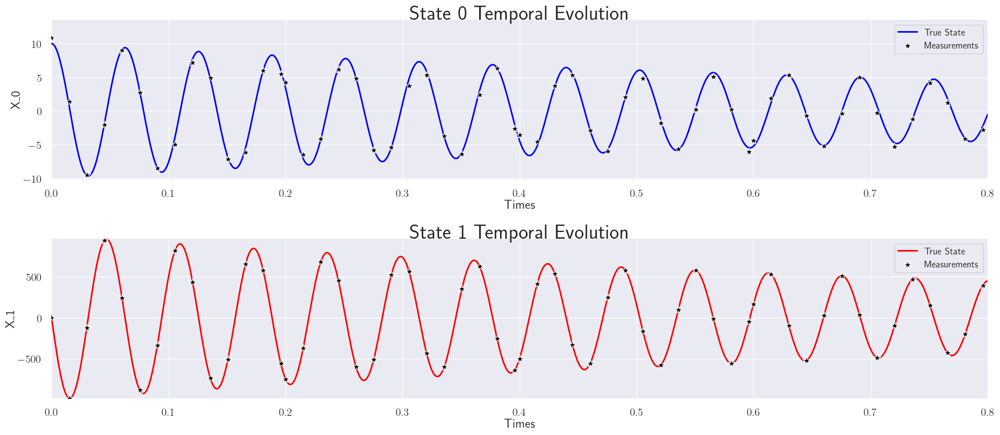

In [97]:
plotter6.plot_state_data(rlc2_state_df,rlc2_measure_df)

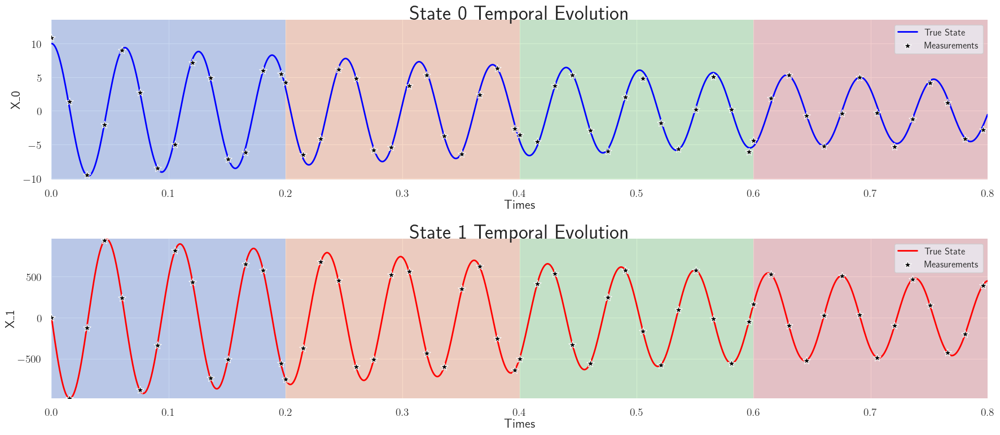

In [98]:
plotter6.plot_state_data(rlc2_state_df,rlc2_measure_df,window_type='rectangle')

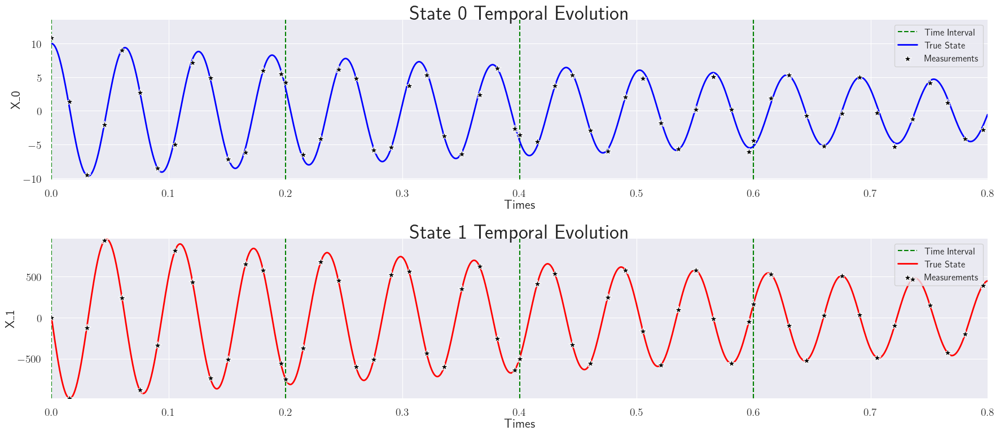

In [99]:
plotter6.plot_state_data(rlc2_state_df,rlc2_measure_df,window_type='line',shifts=rlc2_param_shifts)

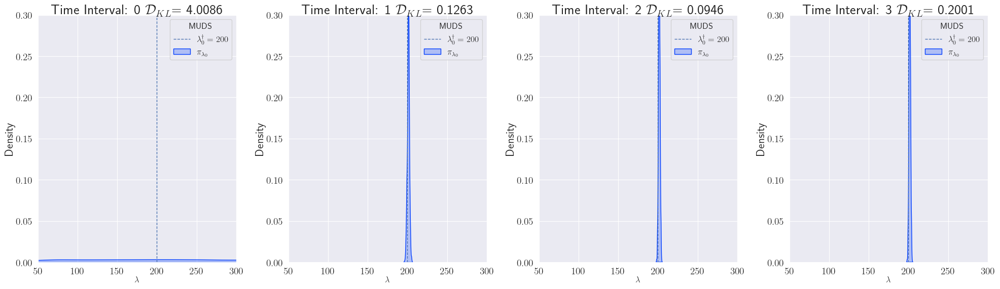

In [100]:
rlc2_number_intervals = len(rlc2_state_df['Interval'].unique())
rlc2_show_iterations = np.arange(rlc2_number_intervals)
plotter6.plot_parameters(rlc2_res,rlc2_show_iterations,'rlc', nrows=1,ncols=len(rlc2_show_iterations),number_parameters=1)

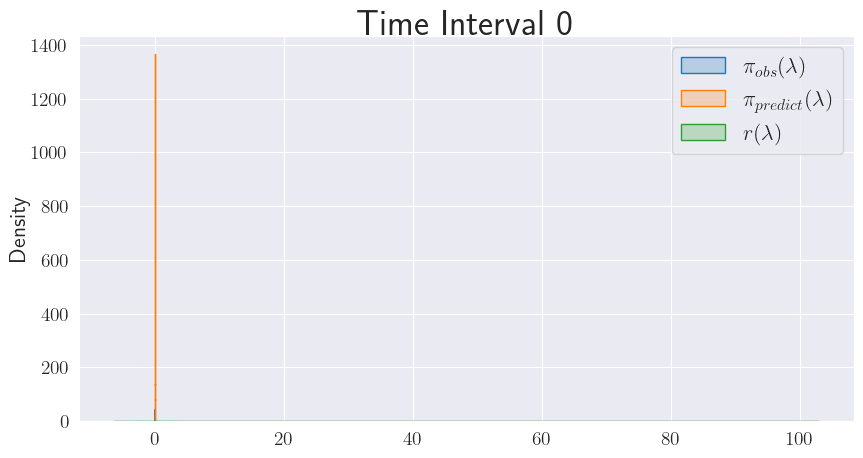

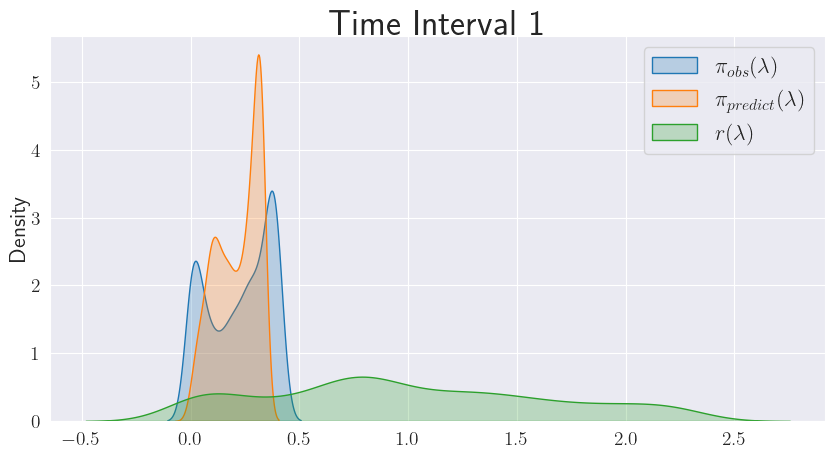

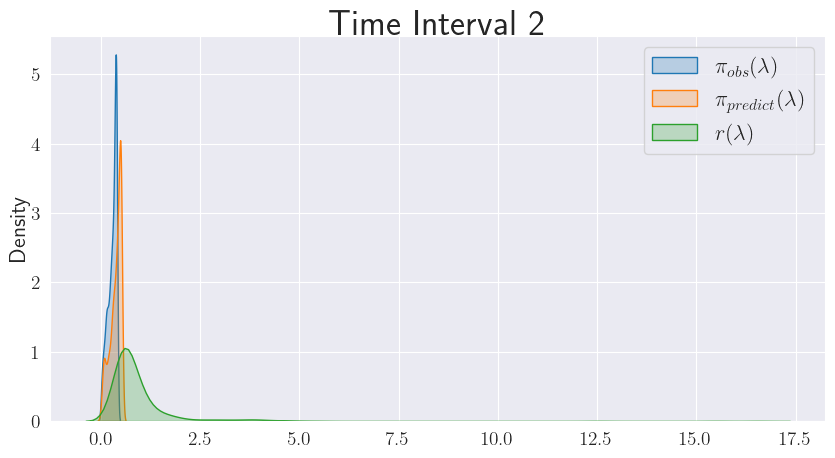

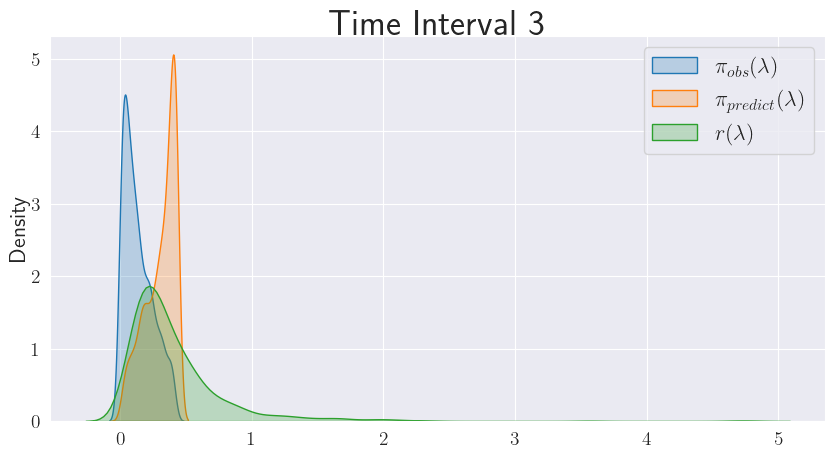

In [101]:
plotter6.plot_ratios(rlc2_res)

/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:274: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


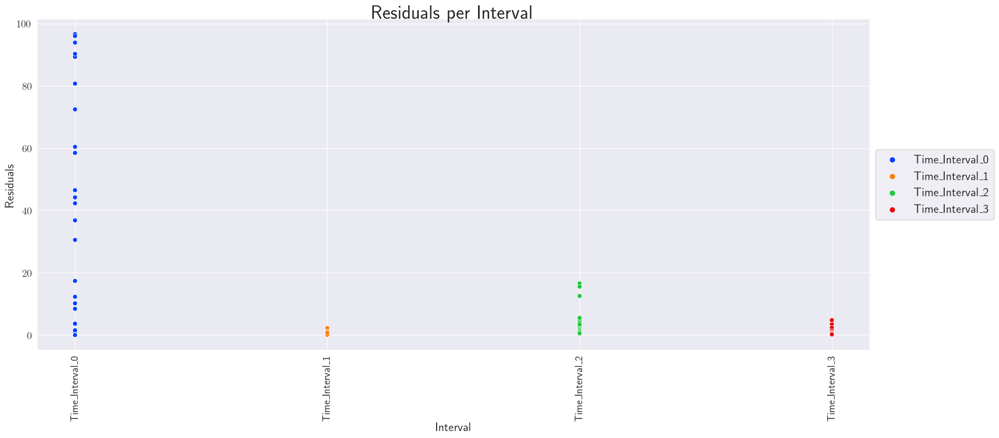

In [102]:
plotter6.plot_residual_scatter(rlc2_residuals_df)

<Figure size 1200x1000 with 0 Axes>

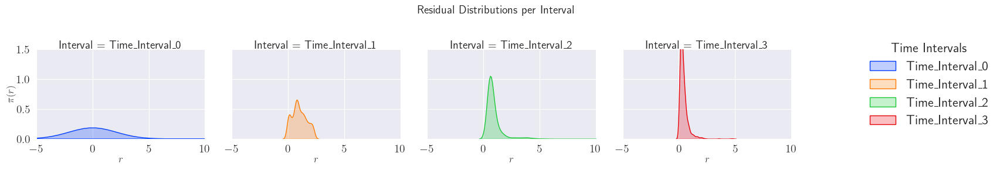

In [103]:
plotter6.plot_residual_dist(rlc2_residuals_df)

In [104]:
stats6_df = post6.stats_df(rlc1_residuals_df)
stats6_df.head()

,Mean,Std,Skew,Kurt
,Residuals,Residuals,Residuals,Residuals
Interval,,,,
Time_Interval_0,1.334878,6.168229,4.995740,24.554654
Time_Interval_1,1.332795,7.806639,6.596400,44.056092
Time_Interval_2,1.161934,3.797602,3.435653,10.640387
Time_Interval_3,1.213893,5.039856,4.615785,21.066173


/Users/rylanspence/Desktop/Git/DC/DC_Sequential/dc_notebooks/ode_notebook/plotting.py:334: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=90)


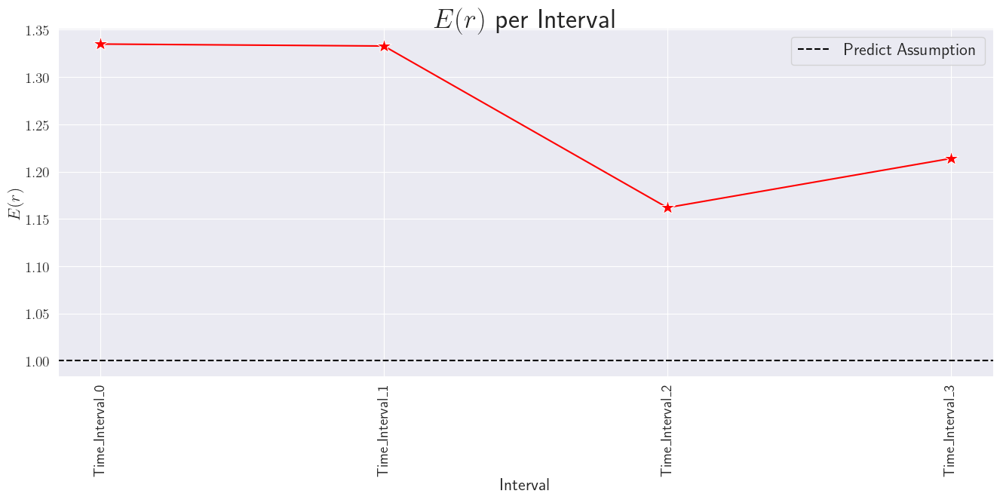

In [105]:
plotter6.plot_expected_ratios(stats6_df)